## LSTM-FCN For Multivariate Time Series FOG Classification

## Imports

In [6]:
from tsai.all import *
import pandas as pd
import matplotlib.pyplot as plt
import numpy
from sklearn import metrics
from tsai.inference import load_learner
from sklearn import preprocessing
from timeit import default_timer as timer
import optuna
import joblib

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
COLAB = False

if COLAB:
    !pip install tsai
    gpu_info = !nvidia-smi
    gpu_info = '\n'.join(gpu_info)
    if gpu_info.find('failed') >= 0:
      print('Not connected to a GPU')
    else:
      print(gpu_info)

    from psutil import virtual_memory
    ram_gb = virtual_memory().total / 1e9
    print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

    if ram_gb < 20:
      print('Not using a high-RAM runtime')
    else:
      print('You are using a high-RAM runtime!')

    from google.colab import drive
    import pandas as pd
    drive.mount('/content/drive')
    base_path = "/content/drive/MyDrive/SYDE 599 - Deep Learning/SYDE 599 Project/Group Project"
    # data_path = f"{base_path}/data/Filtered Data"

    # Import data
    df = pd.read_csv(base_path + "/cleaned_data.zip")
else:
    df = pd.read_csv("cleaned_data.csv")

## Creating Windows

In [166]:
def create_sliding_windows(dataframe, window_length=500, stride=None, horizon=1000, pred_val=100):
    features_df = dataframe[
        [
            "Electrooculogram",
            "ECG",
            "EMG_R-TA",
            "EMG_L-TA",
            "EMG_R-GS",
            "SC",
            "LS_acc_x",
            "LS_acc_y",
            "LS_acc_z",
            "LS_gyro_x",
            "LS_gyro_y",
            "LS_gyro_z",
            "RS_acc_x",
            "RS_acc_y",
            "RS_acc_z",
            "RS_gyro_x",
            "RS_gyro_y",
            "RS_gyro_z",
            "Waist_acc_x",
            "Waist_acc_y",
            "Waist_acc_z",
            "Waist_gyro_x",
            "Waist_gyro_y",
            "Waist_gyro_z",
            "Arm_acc_x",
            "Arm_acc_y",
            "Arm_acc_z",
            "Arm_gyro_x",
            "Arm_gyro_y",
            "Arm_gyro_z",
            "FoG",
        ]
    ]
    # features_df = dataframe[['ECG', 'LS_acc_x', 'LS_acc_y',
    #   'RS_acc_x', 'RS_acc_y',
    #  'Waist_acc_x', 'Waist_acc_y', 
    #  "FoG"]]
    features = torch.tensor(features_df.values).float()
    
    # create samples with sliding window approach
    # A two second window will be 500Hz * 2 = 1000 
    get_x = list(range(0, features.shape[1]))
    get_y = features.shape[1] - 1

    # With sliding window 1000 and no overlap (stride of None)
    # 7530 samples, of 30 features, for 1000 time steps in each sample

    # horizon defines the amount of look forward 
    # here it's 0 so it's predicting the next time step FoG Label

    X, y = SlidingWindow(window_length, stride=stride, get_x=get_x, get_y=get_y, horizon=horizon)(features)
    trainset_y = np.empty((0))
    
    for i, ele in enumerate(y):
        horizon_window = y[i][pred_val]
        horizon_window = np.atleast_1d(horizon_window)
        # horizon_window = horizon_window.reshape((1))
        trainset_y = np.append(trainset_y, (horizon_window), axis=0)

    del features_df
    del features
    
    # X dims are (samples, features, time steps)
#     print(f"X shape is: {X.shape}")
    # y are the FOG labels (samples,)
#     print(f"y shape is: {y.shape}")
    
    return(X, trainset_y)


## Training

In [200]:
# nFoG = [element for element in y if element == 0]
# print(len(nFoG))

# FoG = [element for element in y if element == 1]
# print(len(FoG))

In [202]:
def train(X, y, splits, learning_rate, arch, bs=32, wd=None, num_epochs=30):
    t0 = timer()
    batch_tfms = TSStandardize()
    model_name = "fcst_8feat_hzn_1ms_3sec_alldata_no-overlap"
    fcst = TSForecaster(X, y, splits=splits, loss_func=BCEWithLogitsLossFlat(), batch_tfms=batch_tfms, path='models', bs=bs, arch=arch, metrics=[ F1ScoreMulti(), RecallMulti()], cbs=ShowGraph(), num_workers=16, wd=wd)
    fcst.fit_one_cycle(num_epochs, learning_rate)
#     fcst.export(f"{model_name}.pkl")
    print(f"Training time: {round(timer() - t0, 4)} seconds")
    return fcst

In [ ]:
def get_test_f1(X, y, splits, model):
  actual = [0 if target == 0 else 1 for target in y[splits[2]]]

  raw_preds, target, preds = model.get_X_preds(X[splits[2]])
  predicted = [0 if pred[0] == False else 1 for pred in preds]

  confusion_matrix = metrics.confusion_matrix(actual, predicted)

  cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

  cm_display.plot()
  plt.show()

  tp = confusion_matrix[1,1]
  fp = confusion_matrix[0,1]
  fn = confusion_matrix[1,0]
  pre = tp/(tp+fp)
  re = tp/(tp+fn)
  f1 = 2*pre*re/(pre+re)
  return f1

# def objective(trial):

## Optuna Hyperparamater Search

In [217]:
def objective(trial):
    
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-3, log=True)
    batch_size = trial.suggest_categorical("batch_size", [64, 128, 256, 512])
    pred_val = trial.suggest_int("pred_val", 1, 450, 49)
    num_epochs = trial.suggest_int("num_epochs", 15, 100)
    weight_decay = trial.suggest_float("weight_decay", 0.00001, 0.01, log=True)
    normalization = trial.suggest_categorical("normalization", [True, False])
    window_length = trial.suggest_int("window_length", 10, 1000)
    
    X, y = create_sliding_windows(df, window_length=window_length, horizon=500, pred_val=pred_val)
    scaler = StandardScaler()
    
    if normalization:
        X = scaler.fit_transform(X.reshape(-1, X.shape[-1])).reshape(X.shape)
    splits = get_splits(y, valid_size=0.1, test_size=0.1, stratify=True, random_state=23, shuffle=True)
    model = train(X, y, splits, learning_rate, LSTM_FCNPlus, bs=batch_size, wd=weight_decay, num_epochs=num_epochs)
    f1 = get_test_f1(X, y, splits, model)
    print(f1)
    return f1
    

[I 2022-12-05 03:25:43,738] A new study created in memory with name: no-name-894ba40c-b963-48c9-9440-dc3c985351cf


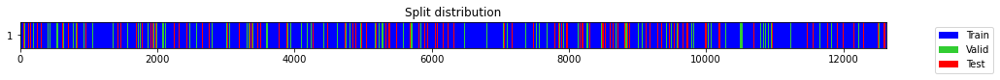

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.657530,0.641455,0.429291,0.496905,00:01
1,0.626610,0.593936,0.527947,0.547406,00:01
2,0.581117,0.540451,0.571901,0.578088,00:01
3,0.536035,0.501611,0.583620,0.586943,00:01
4,0.501022,0.471674,0.637088,0.625592,00:01
5,0.467155,0.444702,0.697919,0.677771,00:01
6,0.438777,0.417949,0.739434,0.720551,00:01
7,0.414289,0.403171,0.737092,0.721896,00:01
8,0.387890,0.374494,0.775040,0.765799,00:01
9,0.367589,0.351456,0.811690,0.812464,00:01


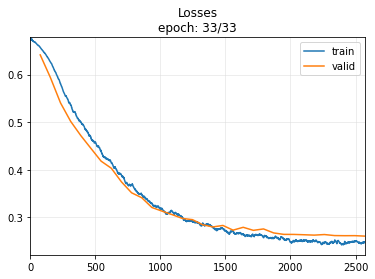

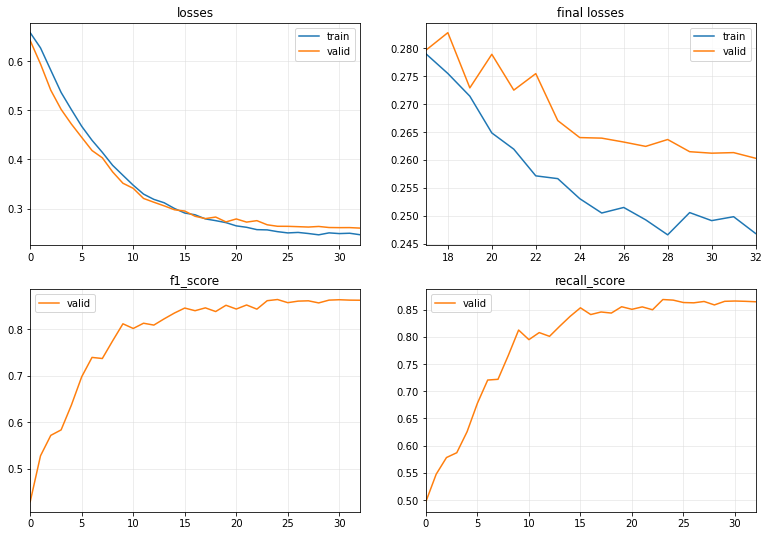

Training time: 49.7444 seconds


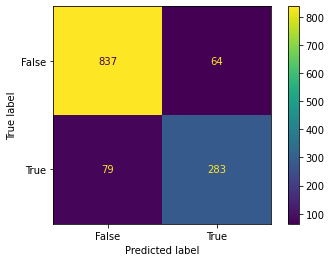

[I 2022-12-05 03:26:36,396] Trial 0 finished with value: 0.7983074753173484 and parameters: {'learning_rate': 7.73774954705107e-05, 'batch_size': 128, 'pred_val': 50, 'num_epochs': 33, 'weight_decay': 3.449814531251622e-05, 'normalization': True, 'window_length': 279}. Best is trial 0 with value: 0.7983074753173484.


0.7983074753173484


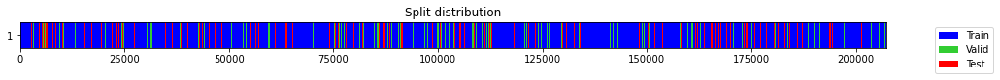

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.550037,0.535055,0.634619,0.623740,00:03
1,0.489716,0.482078,0.652778,0.638329,00:03
2,0.444162,0.438352,0.717297,0.699746,00:03
3,0.405940,0.395612,0.761767,0.747033,00:03
4,0.369083,0.363768,0.789954,0.780746,00:04
5,0.343444,0.340316,0.812345,0.805860,00:03
6,0.324549,0.324376,0.819674,0.813485,00:03
7,0.308827,0.307726,0.824020,0.811683,00:03
8,0.298818,0.297428,0.830450,0.817011,00:03
9,0.291289,0.288453,0.844888,0.842487,00:03


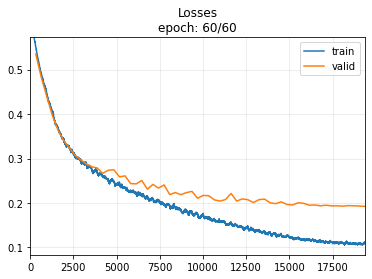

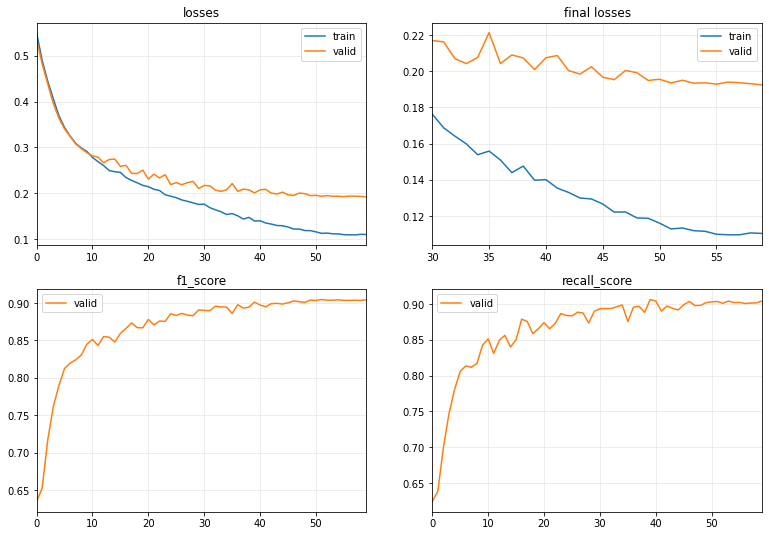

Training time: 255.0007 seconds


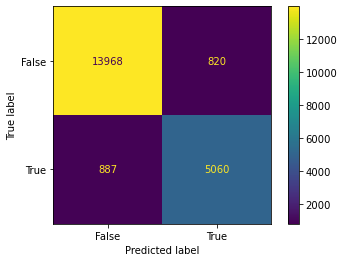

[I 2022-12-05 03:31:25,074] Trial 1 finished with value: 0.8556692314196329 and parameters: {'learning_rate': 0.0003137777822662027, 'batch_size': 512, 'pred_val': 148, 'num_epochs': 60, 'weight_decay': 2.1240842722479307e-05, 'normalization': True, 'window_length': 17}. Best is trial 1 with value: 0.8556692314196329.


0.8556692314196329


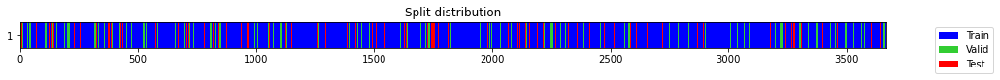

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.762167,0.758178,0.226732,0.497199,00:01
1,0.758659,0.743648,0.252355,0.501175,00:00
2,0.750477,0.723433,0.302514,0.511042,00:00
3,0.735124,0.692662,0.518528,0.586315,00:00
4,0.714383,0.656053,0.595356,0.606177,00:01
5,0.688727,0.619003,0.637199,0.626636,00:00
6,0.659883,0.584984,0.510159,0.544224,00:00
7,0.630417,0.560536,0.496696,0.538621,00:00
8,0.605010,0.543241,0.477821,0.527272,00:01
9,0.582294,0.533010,0.473458,0.521525,00:01


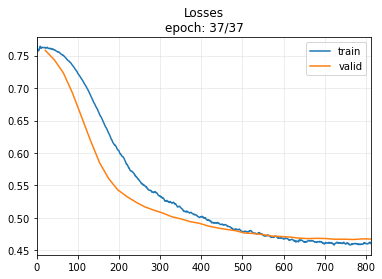

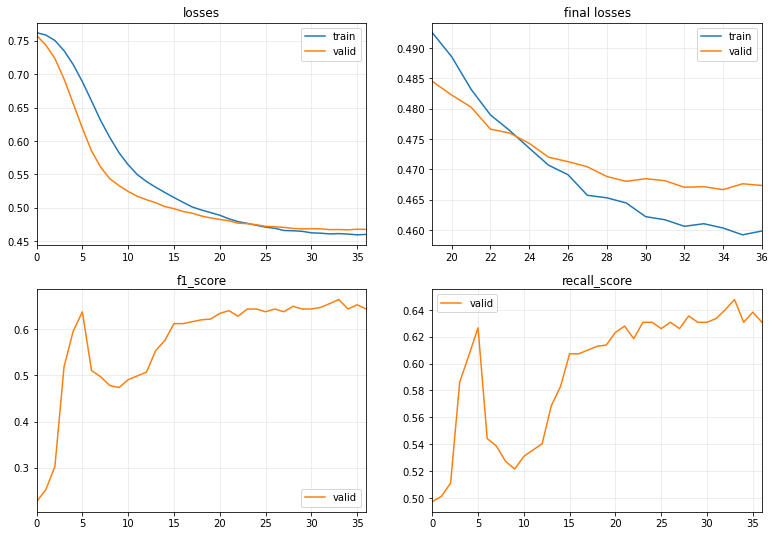

Training time: 42.7479 seconds


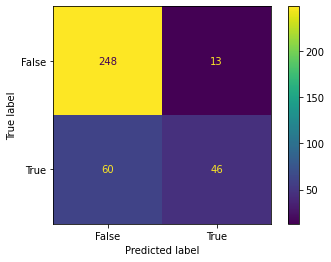

[I 2022-12-05 03:32:09,325] Trial 2 finished with value: 0.5575757575757576 and parameters: {'learning_rate': 2.3855599982317017e-05, 'batch_size': 128, 'pred_val': 50, 'num_epochs': 37, 'weight_decay': 1.4511264031547904e-05, 'normalization': False, 'window_length': 960}. Best is trial 1 with value: 0.8556692314196329.


0.5575757575757576


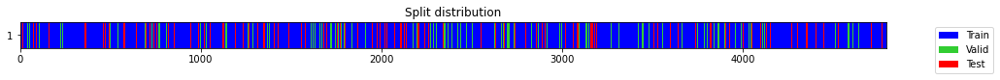

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.713586,0.657755,0.571786,0.586383,00:01
1,0.690842,0.609159,0.594512,0.589730,00:01
2,0.656093,0.548772,0.415854,0.500000,00:01
3,0.616778,0.563084,0.415854,0.500000,00:00
4,0.584979,0.570860,0.415854,0.500000,00:00
5,0.556310,0.503645,0.491723,0.535456,00:00
6,0.531252,0.446633,0.601506,0.599813,00:00
7,0.508435,0.411770,0.730668,0.706957,00:00
8,0.487884,0.397718,0.753289,0.735773,00:00
9,0.468857,0.396512,0.797647,0.795731,00:00


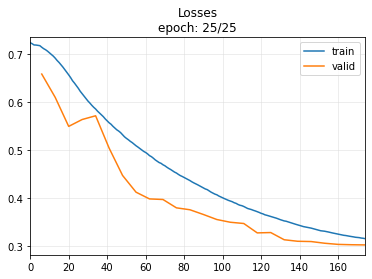

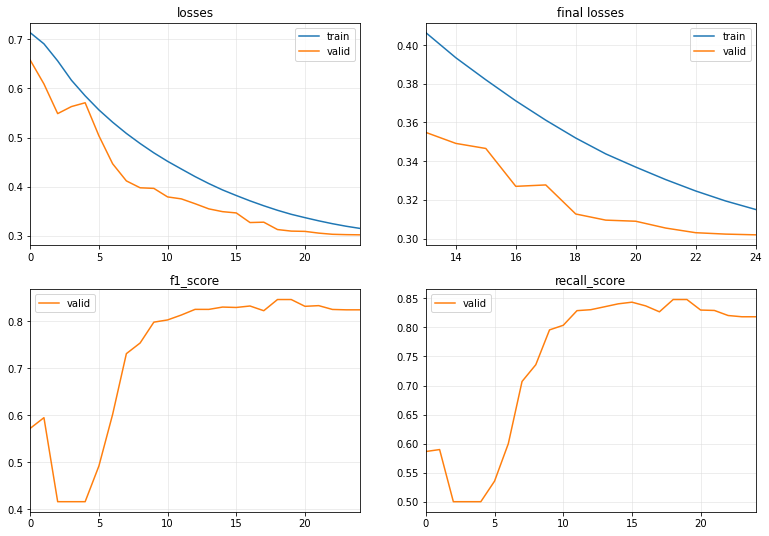

Training time: 27.2659 seconds


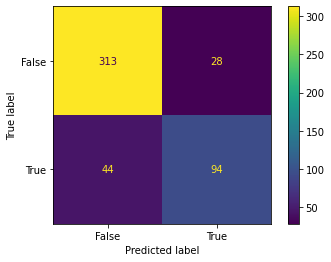

[I 2022-12-05 03:32:38,259] Trial 3 finished with value: 0.7230769230769231 and parameters: {'learning_rate': 0.00047620443055608545, 'batch_size': 512, 'pred_val': 99, 'num_epochs': 25, 'weight_decay': 0.00045462227036786987, 'normalization': False, 'window_length': 735}. Best is trial 1 with value: 0.8556692314196329.


0.7230769230769231


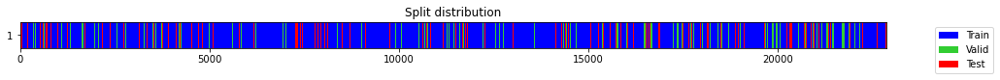

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.682479,0.663039,0.577425,0.607559,00:01
1,0.647346,0.613109,0.624761,0.645265,00:01
2,0.599183,0.557815,0.679739,0.672361,00:01
3,0.545889,0.504775,0.666330,0.650152,00:01
4,0.497000,0.466741,0.680393,0.661757,00:01
5,0.460709,0.435871,0.722081,0.703170,00:01
6,0.429939,0.405515,0.759062,0.740218,00:01
7,0.400551,0.374018,0.786696,0.770549,00:01
8,0.372939,0.351597,0.810911,0.800260,00:01
9,0.351752,0.338202,0.820562,0.818814,00:01


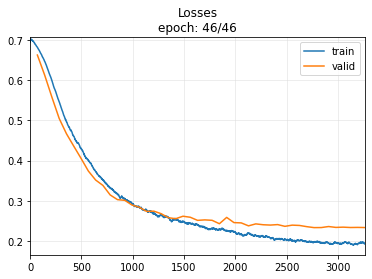

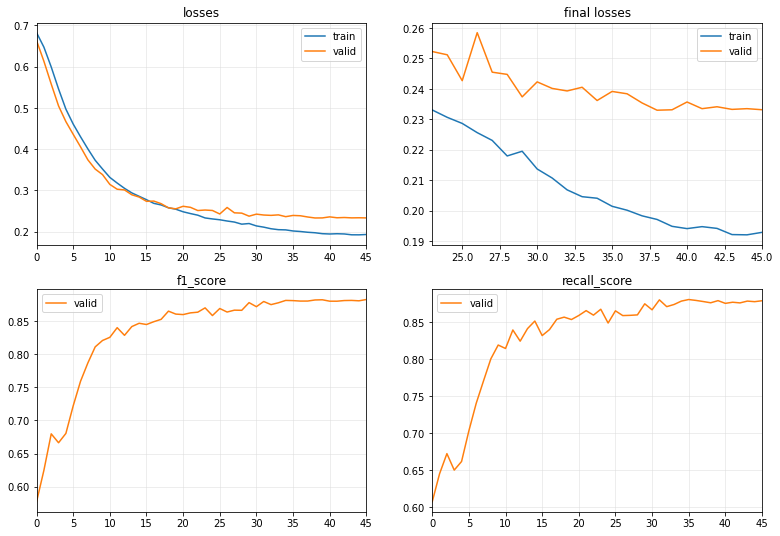

Training time: 74.479 seconds


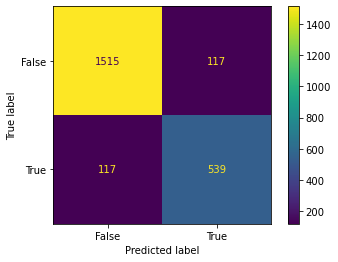

[I 2022-12-05 03:33:56,109] Trial 4 finished with value: 0.8216463414634146 and parameters: {'learning_rate': 0.0001385491634777354, 'batch_size': 256, 'pred_val': 50, 'num_epochs': 46, 'weight_decay': 0.00021472840848626304, 'normalization': True, 'window_length': 154}. Best is trial 1 with value: 0.8556692314196329.


0.8216463414634146


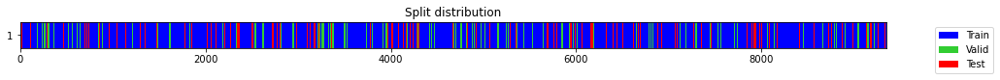

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.667331,0.624420,0.606415,0.628343,00:01
1,0.609398,0.553230,0.625321,0.616304,00:01
2,0.549142,0.504989,0.545882,0.561866,00:01
3,0.504455,0.473704,0.637178,0.625632,00:01
4,0.470978,0.440003,0.737798,0.721447,00:01
5,0.434564,0.395065,0.756562,0.740853,00:01
6,0.395490,0.370891,0.809985,0.807234,00:01
7,0.362670,0.351855,0.774661,0.753964,00:01
8,0.334073,0.321328,0.796423,0.783031,00:01
9,0.311458,0.292807,0.824143,0.811783,00:01


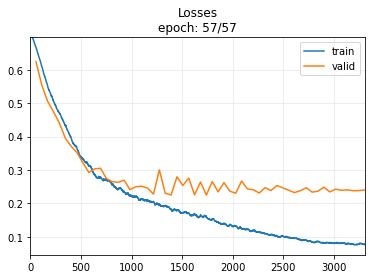

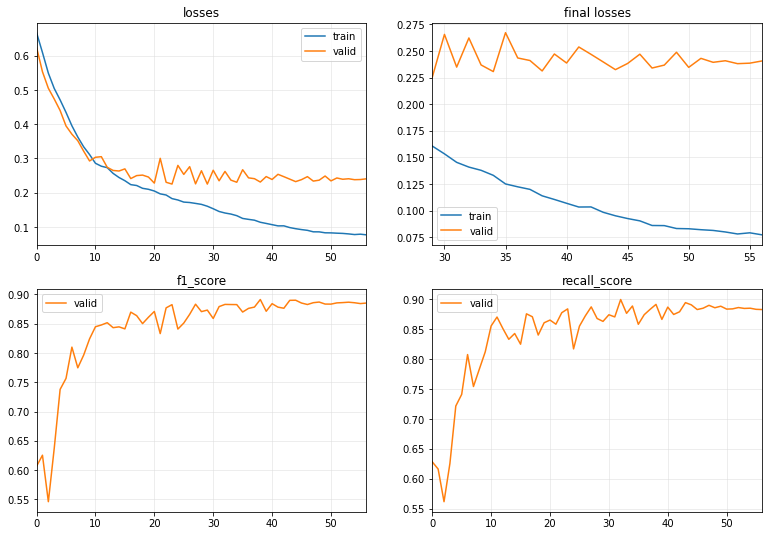

Training time: 78.3628 seconds


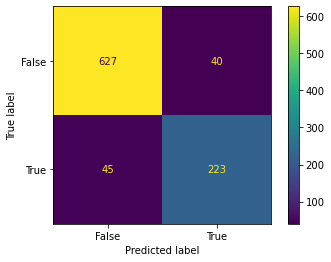

[I 2022-12-05 03:35:17,259] Trial 5 finished with value: 0.8399246704331449 and parameters: {'learning_rate': 0.00038411802191215804, 'batch_size': 128, 'pred_val': 246, 'num_epochs': 57, 'weight_decay': 0.0018839302749277507, 'normalization': True, 'window_length': 377}. Best is trial 1 with value: 0.8556692314196329.


0.8399246704331449


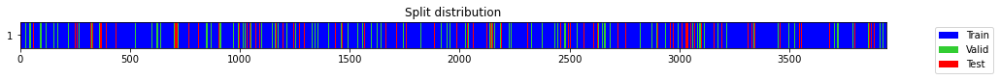

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.688904,0.676728,0.426007,0.447980,00:01
1,0.686936,0.674084,0.516228,0.518554,00:00
2,0.683374,0.667648,0.542789,0.545149,00:00
3,0.677688,0.656219,0.557355,0.560189,00:00
4,0.670887,0.640721,0.557964,0.564526,00:00
5,0.662832,0.621704,0.569317,0.575165,00:00
6,0.652254,0.601611,0.568559,0.576020,00:00
7,0.640805,0.580662,0.565697,0.575101,00:00
8,0.627848,0.560519,0.546779,0.563482,00:00
9,0.613275,0.543442,0.530185,0.555408,00:00


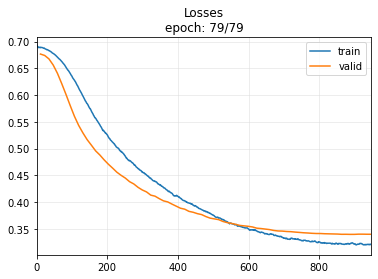

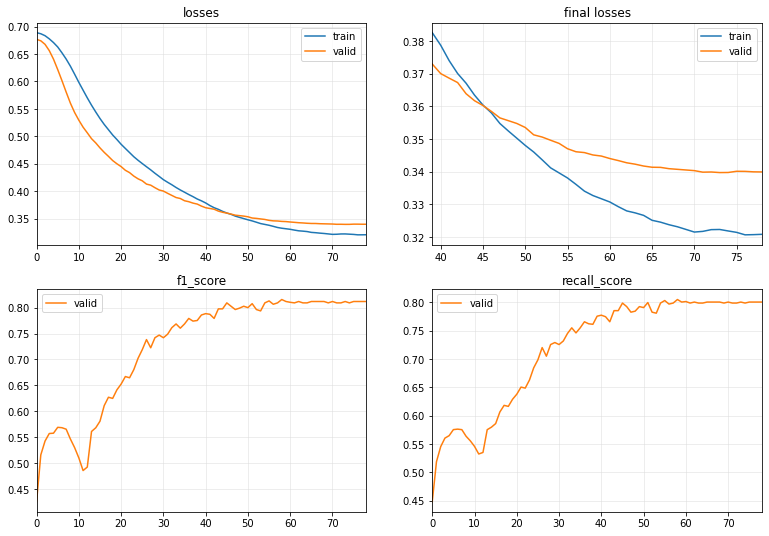

Training time: 86.7941 seconds


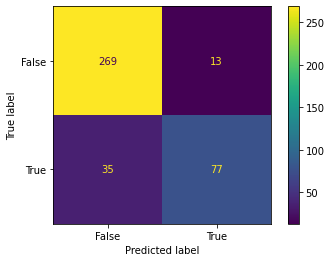

[I 2022-12-05 03:36:45,427] Trial 6 finished with value: 0.7623762376237624 and parameters: {'learning_rate': 5.443333454564684e-05, 'batch_size': 256, 'pred_val': 197, 'num_epochs': 79, 'weight_decay': 0.0013163442300346407, 'normalization': False, 'window_length': 894}. Best is trial 1 with value: 0.8556692314196329.


0.7623762376237624


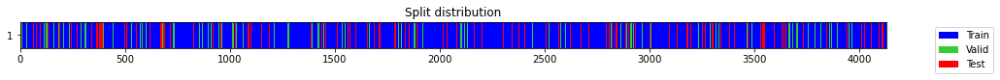

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.619294,0.586948,0.517425,0.548305,00:01
1,0.592823,0.549484,0.497900,0.538983,00:01
2,0.565060,0.527032,0.482271,0.530508,00:01
3,0.543020,0.511685,0.505552,0.543220,00:01
4,0.522425,0.492842,0.557779,0.572034,00:01
5,0.502127,0.470638,0.606875,0.603390,00:01
6,0.481780,0.444640,0.707985,0.689831,00:01
7,0.460079,0.418112,0.727132,0.709322,00:01
8,0.438412,0.404543,0.723107,0.710169,00:01
9,0.418017,0.375552,0.765915,0.756780,00:01


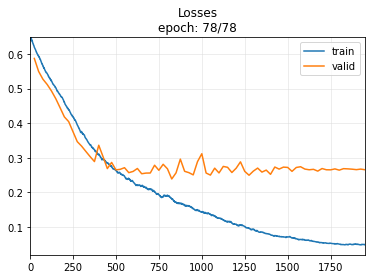

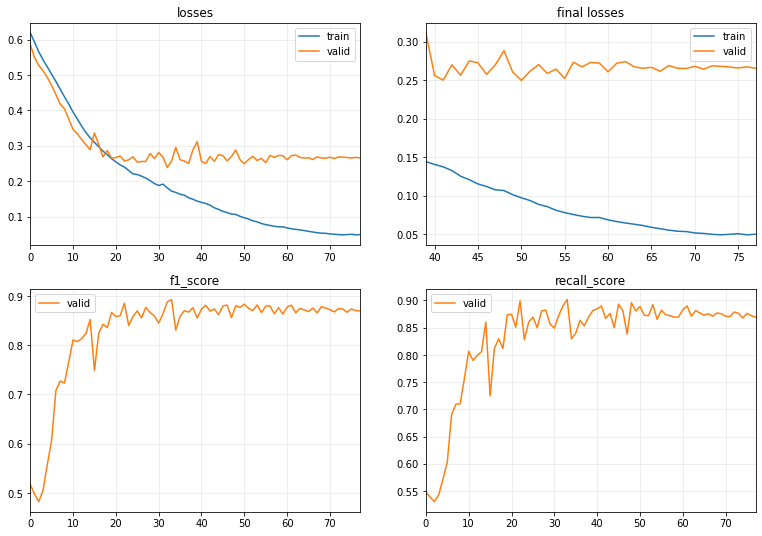

Training time: 93.3833 seconds


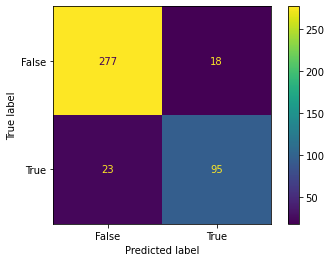

[I 2022-12-05 03:38:20,160] Trial 7 finished with value: 0.8225108225108225 and parameters: {'learning_rate': 0.0004598911697340379, 'batch_size': 128, 'pred_val': 197, 'num_epochs': 78, 'weight_decay': 0.0005309249779484502, 'normalization': False, 'window_length': 853}. Best is trial 1 with value: 0.8556692314196329.


0.8225108225108225


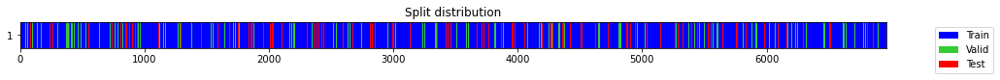

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.710541,0.672628,0.622542,0.665444,00:01
1,0.686802,0.628131,0.677993,0.697944,00:01
2,0.659763,0.582480,0.692435,0.678589,00:01
3,0.629219,0.539716,0.644268,0.631371,00:01
4,0.597743,0.507299,0.590176,0.593952,00:01
5,0.568286,0.484964,0.590176,0.593952,00:01
6,0.541044,0.462747,0.630722,0.621411,00:01
7,0.517358,0.441616,0.683847,0.663831,00:01
8,0.493572,0.420466,0.741089,0.717782,00:01
9,0.471222,0.396058,0.780767,0.759758,00:01


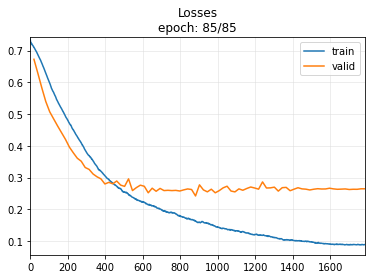

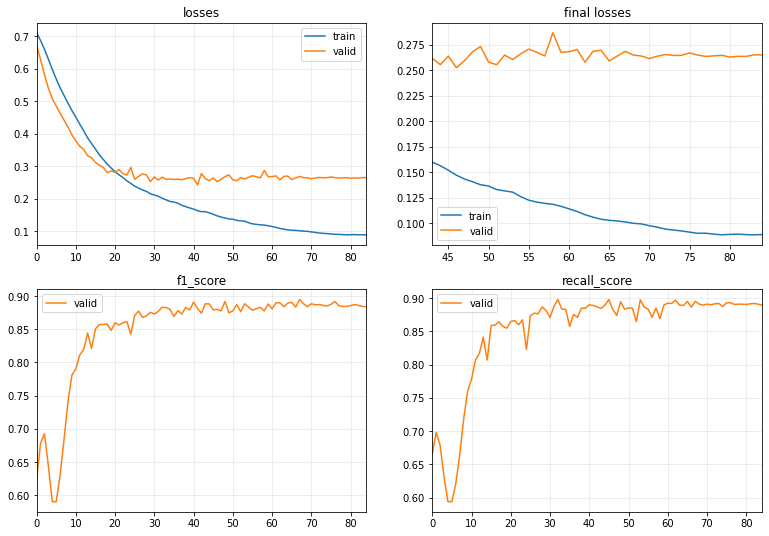

Training time: 103.5745 seconds


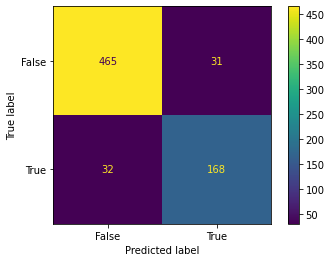

[I 2022-12-05 03:40:06,608] Trial 8 finished with value: 0.8421052631578947 and parameters: {'learning_rate': 0.0003212468782907117, 'batch_size': 256, 'pred_val': 295, 'num_epochs': 85, 'weight_decay': 0.00020421611542191853, 'normalization': True, 'window_length': 506}. Best is trial 1 with value: 0.8556692314196329.


0.8421052631578947


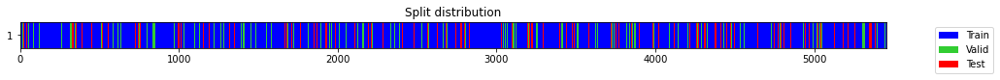

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.666814,0.615295,0.496533,0.531367,00:01
1,0.627536,0.550182,0.479264,0.529481,00:01
2,0.591966,0.513562,0.455364,0.517945,00:01
3,0.558796,0.501718,0.461689,0.521151,00:01
4,0.531762,0.466531,0.572924,0.582032,00:01
5,0.505248,0.435599,0.666726,0.650559,00:01
6,0.479185,0.408981,0.695090,0.680006,00:01
7,0.452431,0.378420,0.781087,0.774224,00:01
8,0.426030,0.367040,0.789306,0.783839,00:01
9,0.400287,0.335112,0.821166,0.826775,00:01


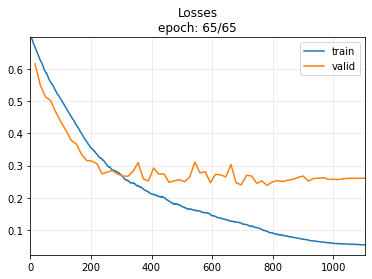

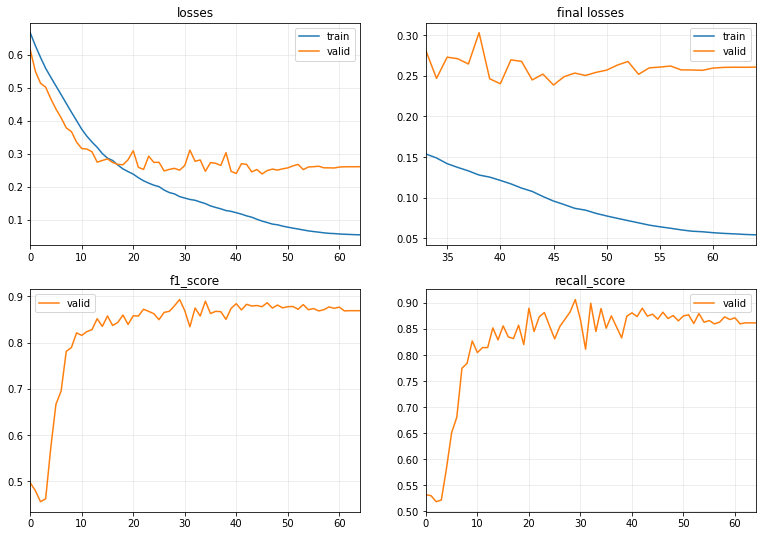

Training time: 76.2202 seconds


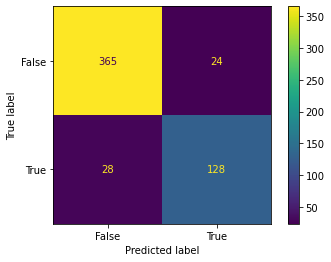

[I 2022-12-05 03:41:24,238] Trial 9 finished with value: 0.8311688311688312 and parameters: {'learning_rate': 0.0008558669546180201, 'batch_size': 256, 'pred_val': 246, 'num_epochs': 65, 'weight_decay': 0.0003362961627786459, 'normalization': False, 'window_length': 646}. Best is trial 1 with value: 0.8556692314196329.


0.8311688311688312


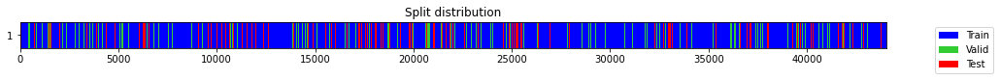

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.571180,0.554376,0.654810,0.644661,00:04
1,0.521610,0.503708,0.641750,0.629329,00:04
2,0.481450,0.473731,0.669227,0.651613,00:04
3,0.459846,0.446523,0.732273,0.712221,00:04
4,0.443443,0.415689,0.751919,0.729890,00:04
5,0.412038,0.389138,0.778178,0.761963,00:04
6,0.383676,0.367695,0.796115,0.785902,00:04
7,0.355890,0.341561,0.803521,0.791072,00:04
8,0.344103,0.326616,0.809087,0.796460,00:04
9,0.326866,0.320095,0.824942,0.819844,00:04


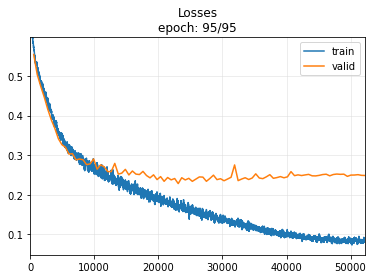

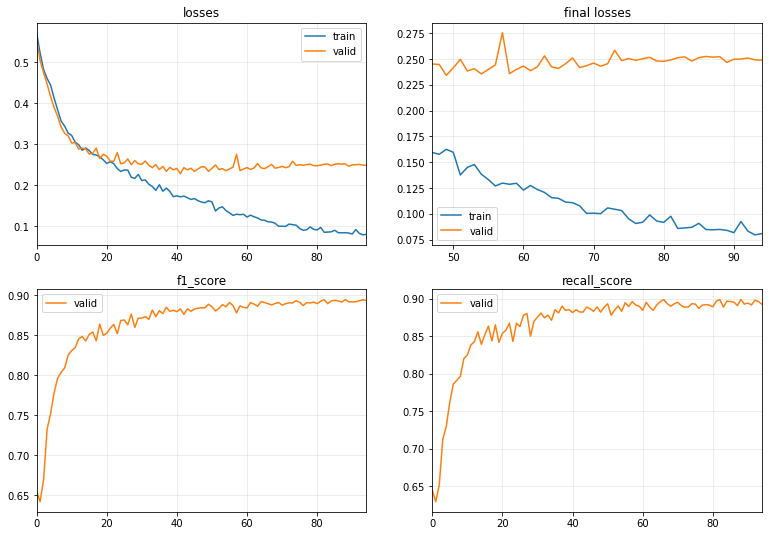

Training time: 565.439 seconds


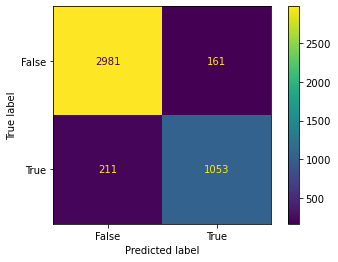

[I 2022-12-05 03:50:53,628] Trial 10 finished with value: 0.8498789346246973 and parameters: {'learning_rate': 0.0001690696799834763, 'batch_size': 64, 'pred_val': 442, 'num_epochs': 95, 'weight_decay': 5.093962790655846e-05, 'normalization': True, 'window_length': 80}. Best is trial 1 with value: 0.8556692314196329.


0.8498789346246973


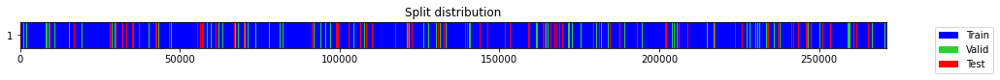

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.497632,0.487946,0.610153,0.605292,00:28
1,0.455255,0.445064,0.703873,0.684780,00:27
2,0.411943,0.413791,0.729927,0.710857,00:26
3,0.395648,0.386721,0.764824,0.750426,00:26
4,0.371458,0.364457,0.789099,0.781142,00:26
5,0.354030,0.347717,0.806676,0.802764,00:26
6,0.343928,0.336682,0.804920,0.796110,00:25
7,0.328211,0.322049,0.822799,0.820023,00:25
8,0.320436,0.309419,0.827986,0.819974,00:26
9,0.319140,0.296507,0.838406,0.835055,00:26


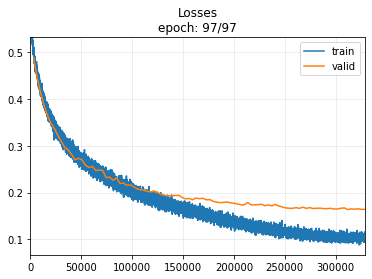

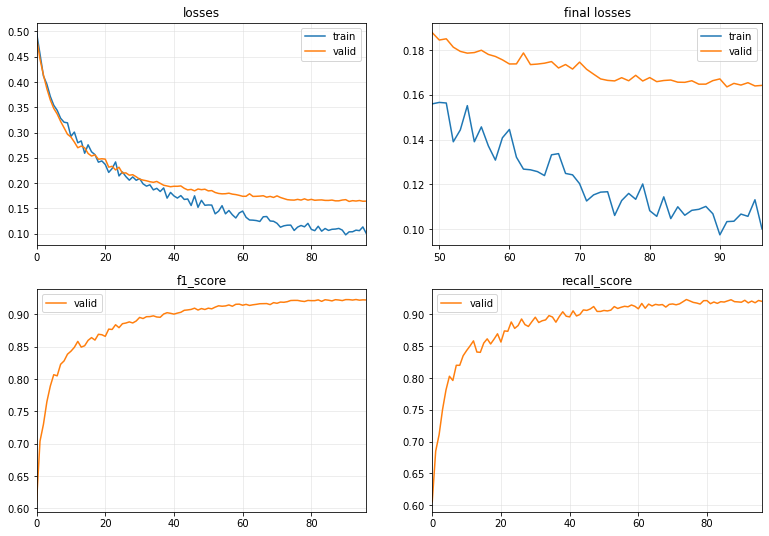

Training time: 3430.9829 seconds


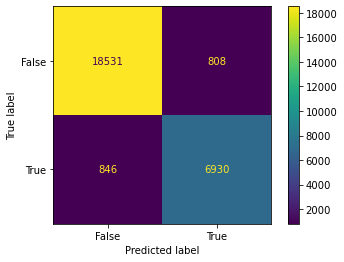

[I 2022-12-05 04:49:03,454] Trial 11 finished with value: 0.8933866185380946 and parameters: {'learning_rate': 0.0001415033467837296, 'batch_size': 64, 'pred_val': 442, 'num_epochs': 97, 'weight_decay': 5.172787804930835e-05, 'normalization': True, 'window_length': 13}. Best is trial 11 with value: 0.8933866185380946.


0.8933866185380946


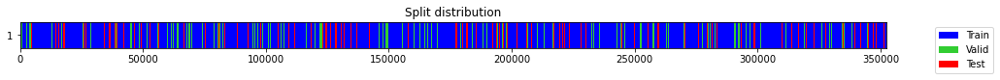

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.711358,0.709961,0.493122,0.621936,00:34
1,0.650550,0.644688,0.588089,0.653202,00:33
2,0.599338,0.591746,0.650285,0.669737,00:33
3,0.553856,0.544607,0.652875,0.642515,00:33
4,0.515699,0.508325,0.583346,0.586492,00:34
5,0.487246,0.488002,0.622333,0.614127,00:34
6,0.477003,0.469055,0.647197,0.633727,00:33
7,0.466241,0.451844,0.706900,0.689562,00:32
8,0.451481,0.434151,0.717376,0.698475,00:32
9,0.419057,0.416487,0.736107,0.717832,00:33


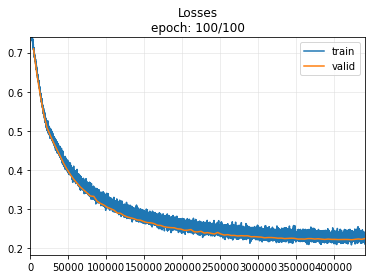

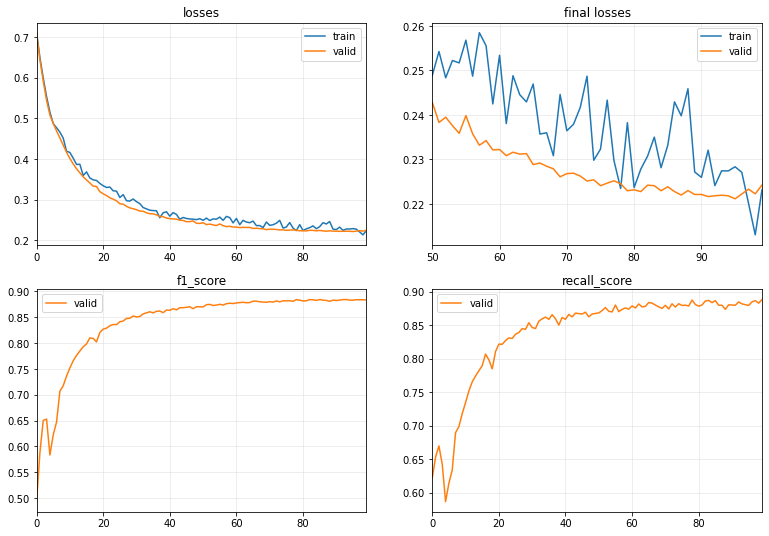

Training time: 4540.2684 seconds


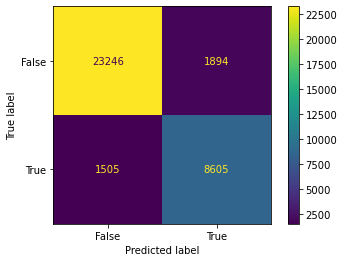

[I 2022-12-05 06:06:19,090] Trial 12 finished with value: 0.8350720558979088 and parameters: {'learning_rate': 1.19929897992677e-05, 'batch_size': 64, 'pred_val': 442, 'num_epochs': 100, 'weight_decay': 1.0765833339773604e-05, 'normalization': True, 'window_length': 10}. Best is trial 11 with value: 0.8933866185380946.


0.8350720558979088


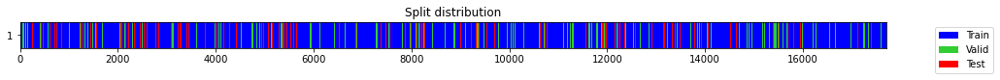

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.701722,0.684115,0.491213,0.491941,00:01
1,0.684635,0.651976,0.584578,0.583358,00:01
2,0.662734,0.614060,0.654226,0.653423,00:01
3,0.635675,0.574409,0.679368,0.667882,00:01
4,0.604830,0.538489,0.644647,0.631657,00:01
5,0.571443,0.507381,0.612198,0.607957,00:01
6,0.539350,0.482630,0.620324,0.613645,00:01
7,0.510592,0.458212,0.673726,0.655233,00:01
8,0.482122,0.434276,0.715039,0.695773,00:01
9,0.456465,0.411082,0.754257,0.736998,00:01


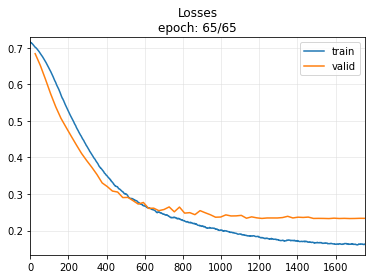

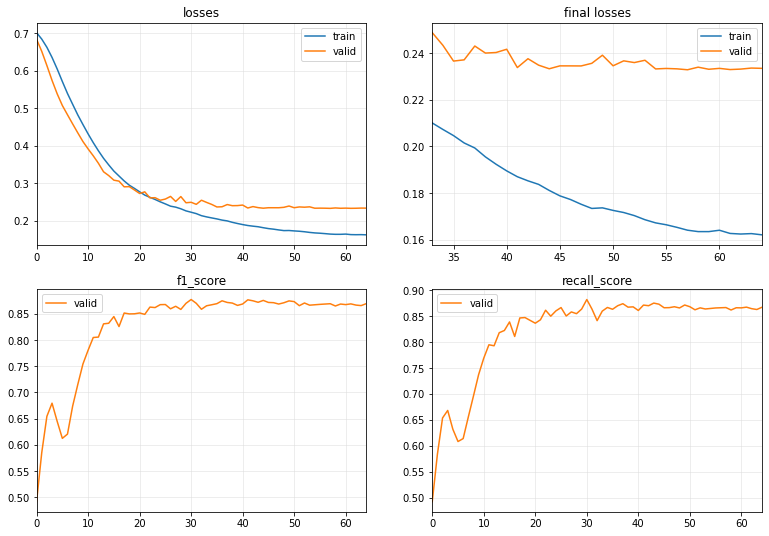

Training time: 78.6652 seconds


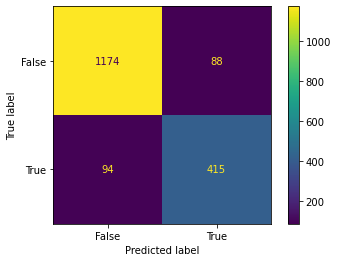

[I 2022-12-05 06:07:40,832] Trial 13 finished with value: 0.8201581027667985 and parameters: {'learning_rate': 0.00018853758392734863, 'batch_size': 512, 'pred_val': 344, 'num_epochs': 65, 'weight_decay': 6.38551210405898e-05, 'normalization': True, 'window_length': 199}. Best is trial 11 with value: 0.8933866185380946.


0.8201581027667985


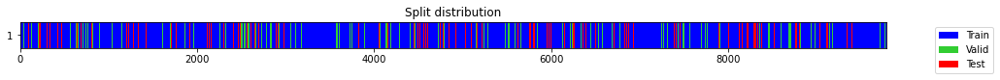

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.705241,0.707008,0.431261,0.548769,00:01
1,0.697052,0.670016,0.555762,0.608581,00:00
2,0.680865,0.621989,0.612578,0.624791,00:00
3,0.657271,0.577896,0.634602,0.623523,00:00
4,0.630457,0.549720,0.616874,0.609968,00:00
5,0.605128,0.530419,0.605134,0.602120,00:00
6,0.582174,0.516240,0.589931,0.591406,00:00
7,0.562139,0.506117,0.596754,0.596048,00:00
8,0.545299,0.498064,0.600947,0.598904,00:00
9,0.531270,0.492862,0.617092,0.610329,00:00


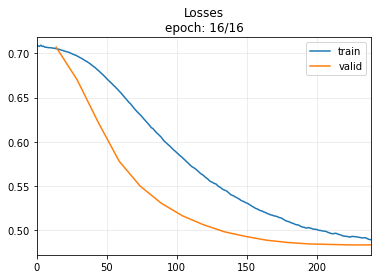

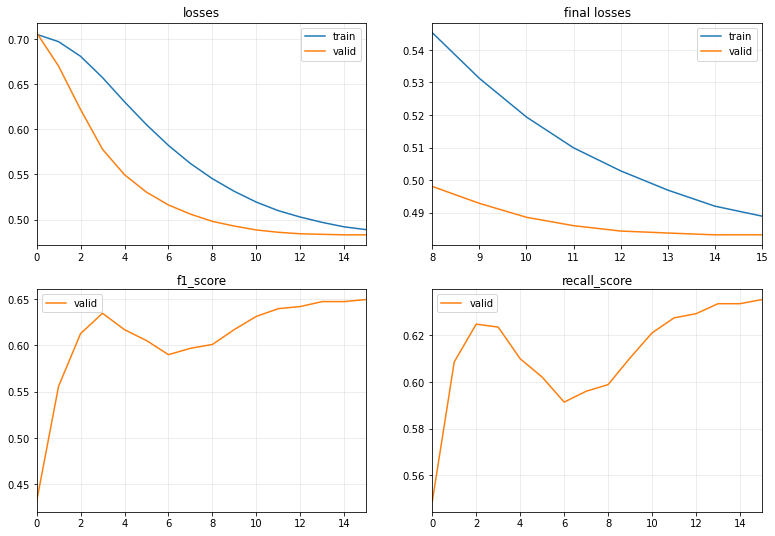

Training time: 17.5658 seconds


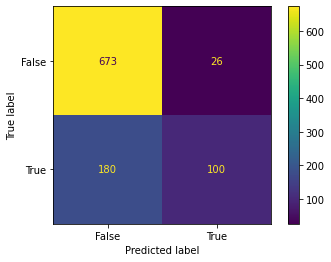

[I 2022-12-05 06:08:01,171] Trial 14 finished with value: 0.4926108374384237 and parameters: {'learning_rate': 4.511648378351935e-05, 'batch_size': 512, 'pred_val': 148, 'num_epochs': 16, 'weight_decay': 8.853798344074871e-05, 'normalization': True, 'window_length': 360}. Best is trial 11 with value: 0.8933866185380946.


0.4926108374384237


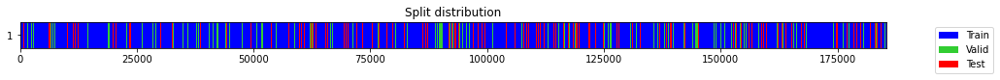

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.414540,0.393288,0.759960,0.749651,00:17
1,0.367293,0.343783,0.803294,0.798347,00:17
2,0.330643,0.321787,0.820923,0.815027,00:17
3,0.312623,0.320982,0.820848,0.821353,00:17
4,0.314199,0.293634,0.839236,0.830761,00:17
5,0.302091,0.284670,0.850136,0.855643,00:17
6,0.277288,0.275712,0.852104,0.854127,00:17
7,0.281231,0.262912,0.857274,0.850748,00:17
8,0.282015,0.256706,0.863993,0.860735,00:17
9,0.267026,0.252285,0.865139,0.865077,00:17


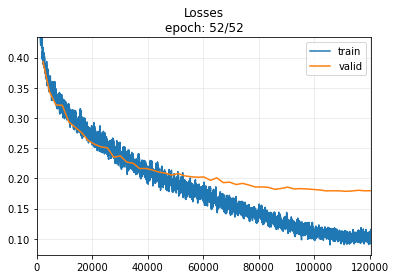

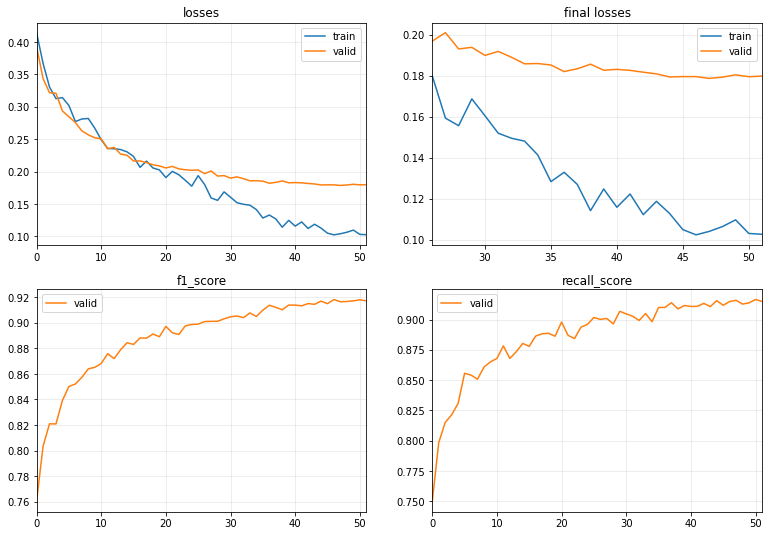

Training time: 1078.2769 seconds


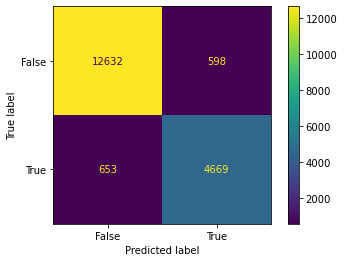

[I 2022-12-05 06:26:22,029] Trial 15 finished with value: 0.8818585324393238 and parameters: {'learning_rate': 0.0009884389845227512, 'batch_size': 64, 'pred_val': 393, 'num_epochs': 52, 'weight_decay': 0.006837692924236313, 'normalization': True, 'window_length': 19}. Best is trial 11 with value: 0.8933866185380946.


0.8818585324393238


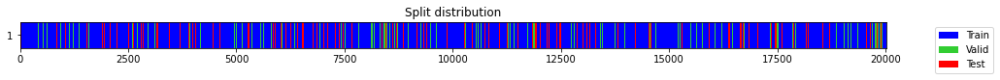

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.504780,0.471867,0.642275,0.629688,00:02
1,0.430820,0.407699,0.740169,0.722279,00:02
2,0.375435,0.364855,0.789067,0.787866,00:02
3,0.346764,0.347289,0.794898,0.788259,00:02
4,0.310458,0.342822,0.811477,0.805869,00:02
5,0.303287,0.338838,0.819293,0.832078,00:02
6,0.311071,0.301347,0.825304,0.818610,00:02
7,0.287387,0.293821,0.844806,0.847330,00:02
8,0.284563,0.304686,0.843783,0.858415,00:02
9,0.275251,0.310161,0.820054,0.810087,00:02


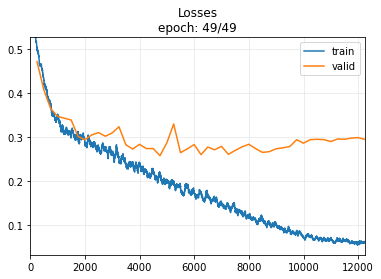

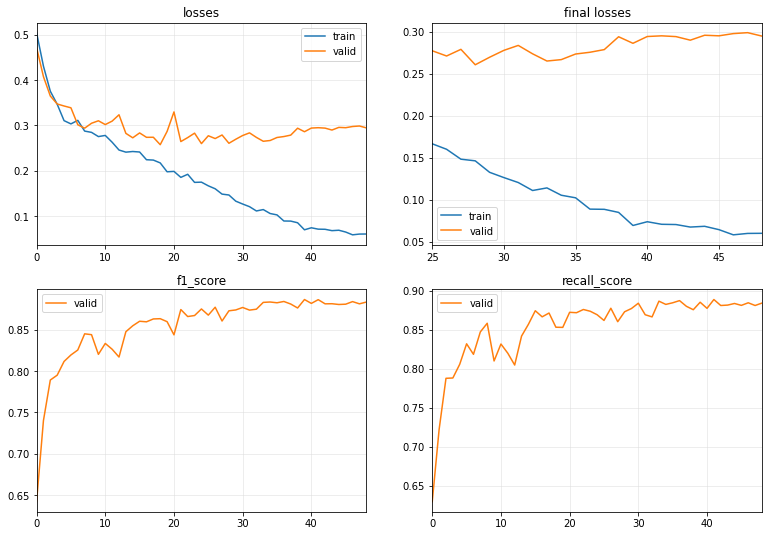

Training time: 122.7388 seconds


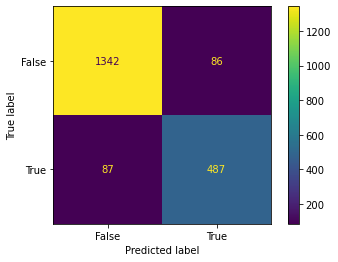

[I 2022-12-05 06:28:27,811] Trial 16 finished with value: 0.8491717523975588 and parameters: {'learning_rate': 0.0009524229320738139, 'batch_size': 64, 'pred_val': 393, 'num_epochs': 49, 'weight_decay': 0.009097877264943363, 'normalization': True, 'window_length': 176}. Best is trial 11 with value: 0.8933866185380946.


0.8491717523975588


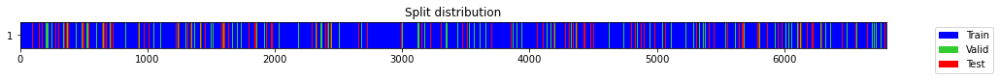

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.652456,0.644476,0.445325,0.496273,00:01
1,0.641766,0.629859,0.436037,0.507164,00:01
2,0.627788,0.610222,0.421241,0.501533,00:01
3,0.609776,0.588491,0.416309,0.500000,00:01
4,0.587904,0.563960,0.421241,0.501533,00:01
5,0.567470,0.542129,0.442477,0.511790,00:01
6,0.543676,0.523510,0.499158,0.539466,00:01
7,0.530479,0.506307,0.548925,0.567142,00:01
8,0.515110,0.487860,0.588993,0.592784,00:01
9,0.503887,0.471098,0.635151,0.624557,00:01


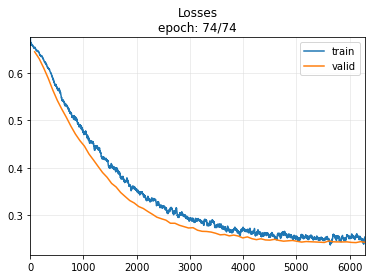

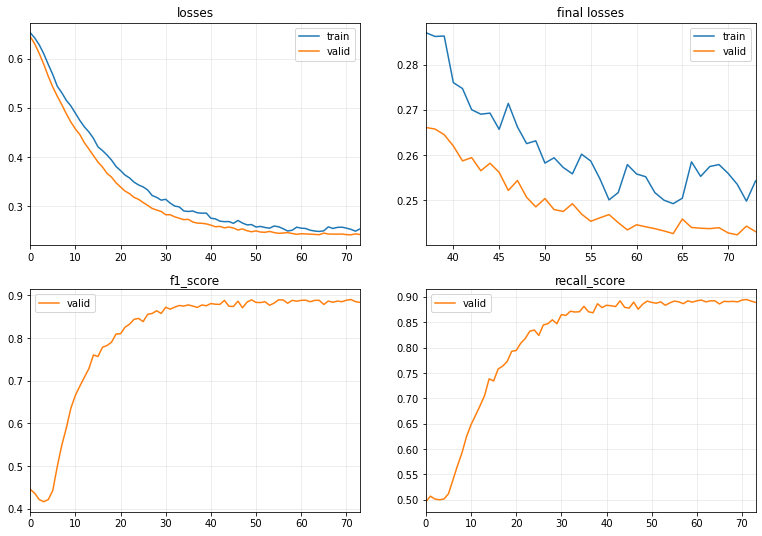

Training time: 113.2944 seconds


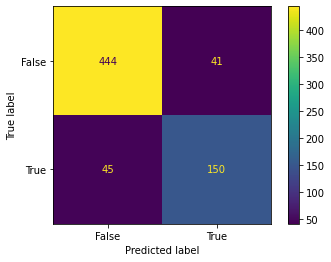

[I 2022-12-05 06:30:23,856] Trial 17 finished with value: 0.7772020725388602 and parameters: {'learning_rate': 3.221580034271797e-05, 'batch_size': 64, 'pred_val': 344, 'num_epochs': 74, 'weight_decay': 0.008705139933060005, 'normalization': True, 'window_length': 518}. Best is trial 11 with value: 0.8933866185380946.


0.7772020725388602


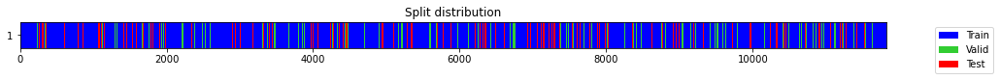

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.666471,0.647037,0.623157,0.678534,00:01
1,0.629607,0.604658,0.680275,0.697267,00:01
2,0.588527,0.568182,0.700932,0.692276,00:01
3,0.552327,0.528779,0.660174,0.644963,00:01
4,0.521850,0.497319,0.639983,0.627920,00:01
5,0.502671,0.475558,0.653397,0.638533,00:01
6,0.480202,0.456301,0.692480,0.671559,00:01
7,0.454440,0.433181,0.718864,0.698060,00:01
8,0.436488,0.410290,0.748098,0.728425,00:01
9,0.416301,0.388815,0.774905,0.757619,00:01


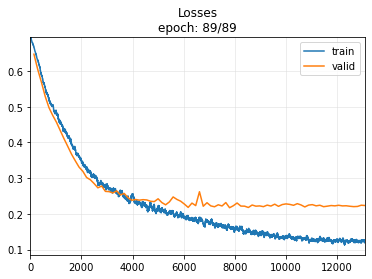

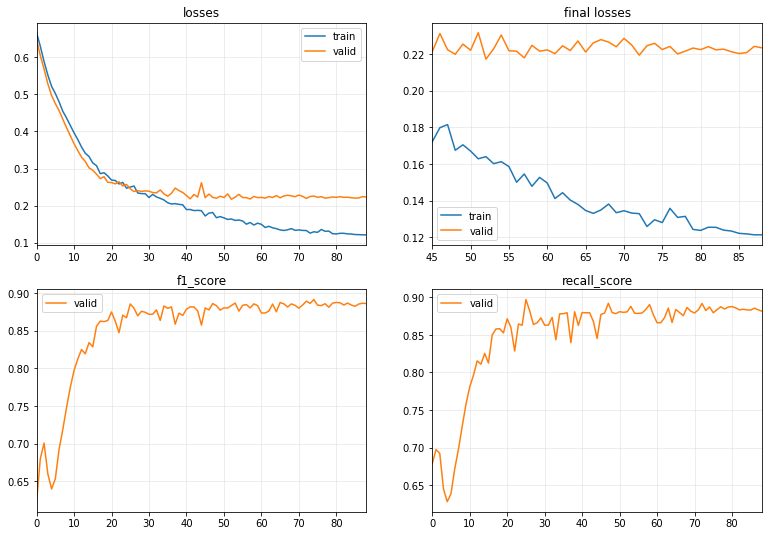

Training time: 173.4566 seconds


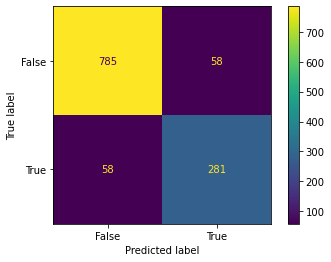

[I 2022-12-05 06:33:20,138] Trial 18 finished with value: 0.8289085545722714 and parameters: {'learning_rate': 9.48696552494314e-05, 'batch_size': 64, 'pred_val': 393, 'num_epochs': 89, 'weight_decay': 0.003373443786915508, 'normalization': True, 'window_length': 298}. Best is trial 11 with value: 0.8933866185380946.


0.8289085545722714


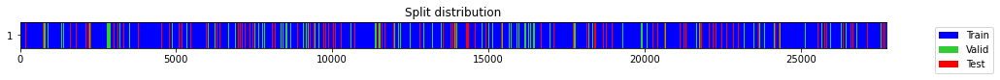

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.654301,0.653534,0.532722,0.537427,00:02
1,0.636845,0.629349,0.576822,0.575322,00:02
2,0.607715,0.601018,0.648947,0.641425,00:02
3,0.577077,0.566245,0.662387,0.651306,00:02
4,0.542921,0.536240,0.661763,0.647390,00:02
5,0.517462,0.509967,0.628067,0.618593,00:02
6,0.492693,0.491397,0.641731,0.629278,00:02
7,0.489407,0.470787,0.652707,0.638065,00:02
8,0.459003,0.454279,0.703185,0.683734,00:02
9,0.445631,0.436048,0.706240,0.686376,00:02


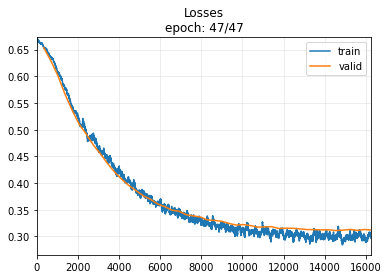

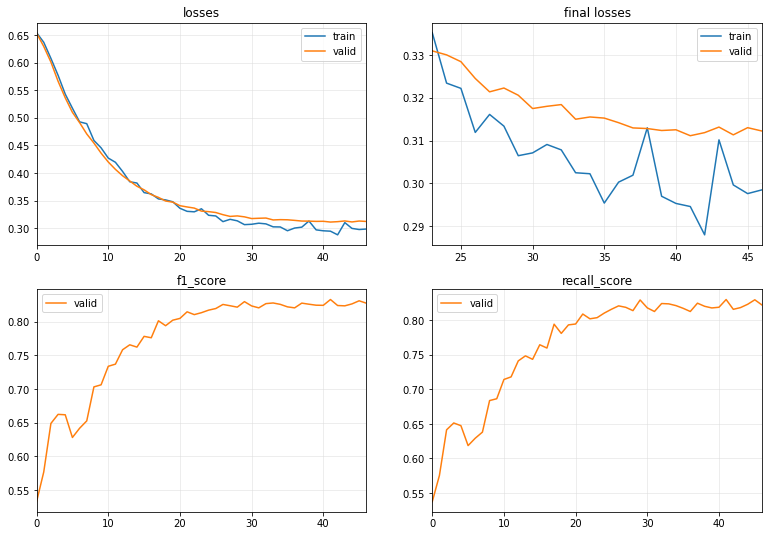

Training time: 151.7653 seconds


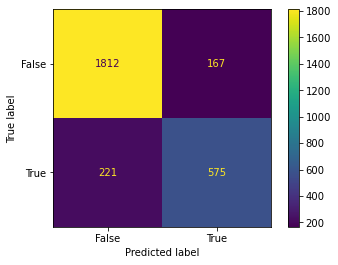

[I 2022-12-05 06:35:55,000] Trial 19 finished with value: 0.7477243172951885 and parameters: {'learning_rate': 1.4369077035518614e-05, 'batch_size': 64, 'pred_val': 344, 'num_epochs': 47, 'weight_decay': 0.00011488112100621542, 'normalization': True, 'window_length': 127}. Best is trial 11 with value: 0.8933866185380946.


0.7477243172951885


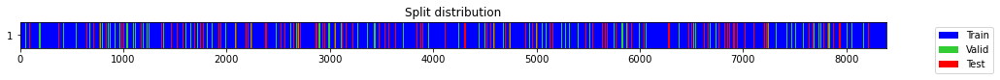

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.573845,0.527914,0.452019,0.513742,00:01
1,0.521085,0.486756,0.534580,0.557485,00:01
2,0.477705,0.447560,0.667316,0.650372,00:01
3,0.437843,0.408450,0.719712,0.697868,00:01
4,0.402760,0.364026,0.783352,0.762865,00:01
5,0.363230,0.329488,0.826762,0.819515,00:01
6,0.333240,0.311249,0.825502,0.818680,00:01
7,0.312896,0.301206,0.866107,0.889065,00:01
8,0.300009,0.308795,0.818556,0.805774,00:01
9,0.288351,0.270644,0.845130,0.835361,00:01


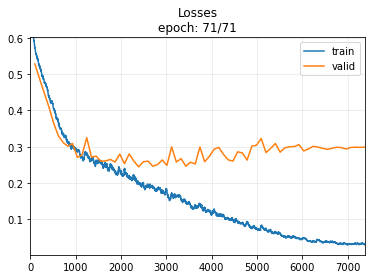

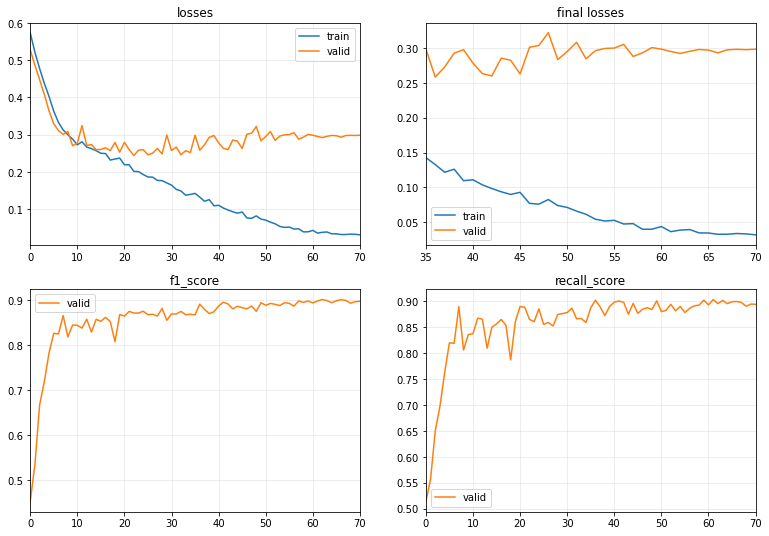

Training time: 113.631 seconds


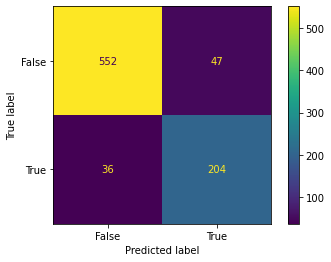

[I 2022-12-05 06:37:51,672] Trial 20 finished with value: 0.8309572301425662 and parameters: {'learning_rate': 0.0006622018138713016, 'batch_size': 64, 'pred_val': 442, 'num_epochs': 71, 'weight_decay': 0.0010773155723947942, 'normalization': True, 'window_length': 420}. Best is trial 11 with value: 0.8933866185380946.


0.8309572301425662


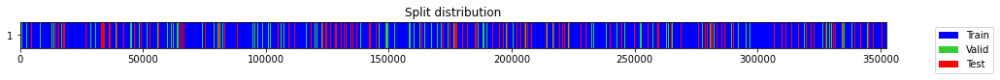

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.540406,0.527090,0.654844,0.641504,00:05
1,0.469688,0.463459,0.682099,0.664179,00:04
2,0.421836,0.414951,0.736454,0.717143,00:04
3,0.382396,0.378476,0.775404,0.762384,00:04
4,0.352888,0.347878,0.792941,0.778654,00:04
5,0.328565,0.329368,0.809213,0.797161,00:04
6,0.310085,0.315994,0.820125,0.811375,00:04
7,0.298143,0.300976,0.834938,0.832463,00:05
8,0.290082,0.293469,0.833406,0.821226,00:04
9,0.276920,0.284713,0.844613,0.845032,00:04


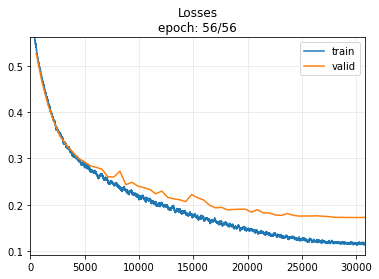

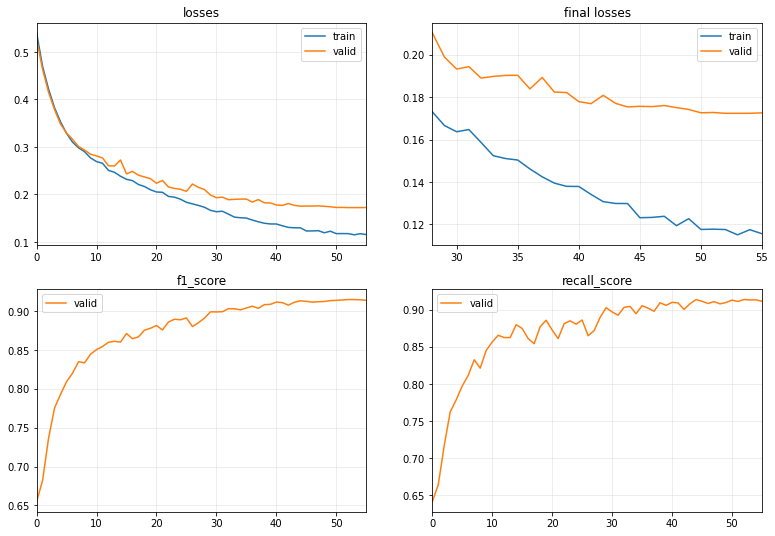

Training time: 330.2798 seconds


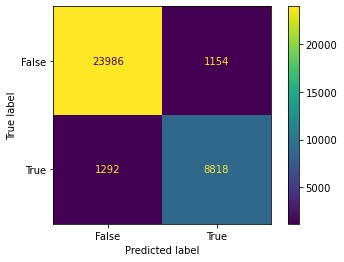

[I 2022-12-05 06:44:55,835] Trial 21 finished with value: 0.8781993825316203 and parameters: {'learning_rate': 0.000254228674258767, 'batch_size': 512, 'pred_val': 148, 'num_epochs': 56, 'weight_decay': 2.6013505754510777e-05, 'normalization': True, 'window_length': 10}. Best is trial 11 with value: 0.8933866185380946.


0.8781993825316203


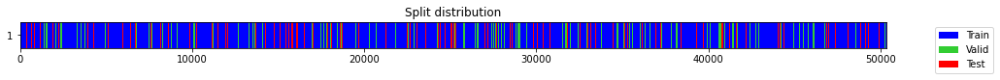

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.771831,0.741886,0.417279,0.573301,00:01
1,0.722443,0.677663,0.541543,0.638140,00:01
2,0.656915,0.605980,0.660684,0.704755,00:01
3,0.579964,0.528912,0.715759,0.710431,00:01
4,0.505850,0.470278,0.693966,0.676730,00:01
5,0.454690,0.433479,0.726500,0.708104,00:01
6,0.414175,0.403146,0.768980,0.753179,00:01
7,0.382086,0.372529,0.798482,0.792879,00:01
8,0.354961,0.347046,0.808885,0.796404,00:01
9,0.330887,0.329609,0.817822,0.809544,00:01


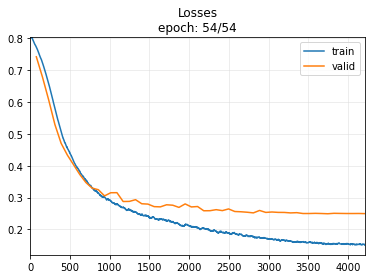

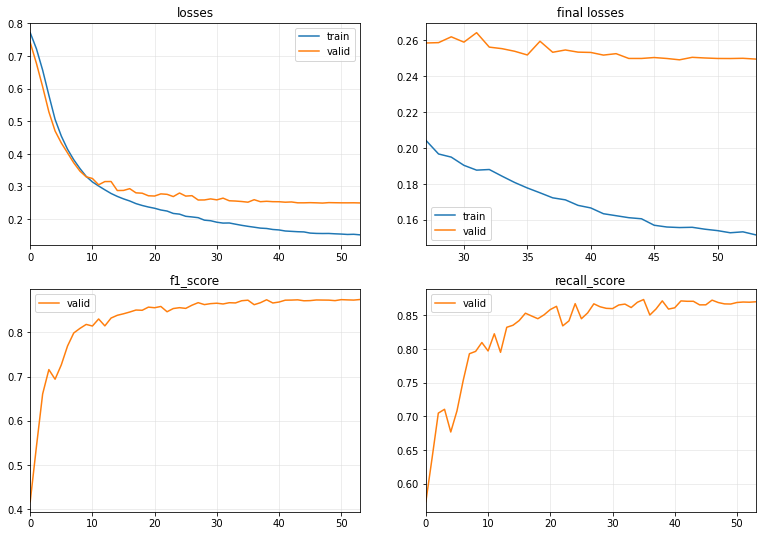

Training time: 93.6654 seconds


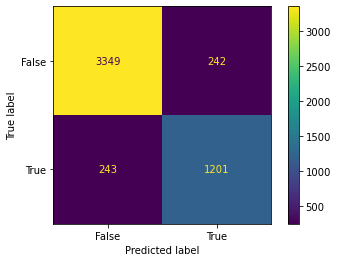

[I 2022-12-05 06:46:33,313] Trial 22 finished with value: 0.8320055420852095 and parameters: {'learning_rate': 0.0002103934138774901, 'batch_size': 512, 'pred_val': 393, 'num_epochs': 54, 'weight_decay': 3.723661698825608e-05, 'normalization': True, 'window_length': 70}. Best is trial 11 with value: 0.8933866185380946.


0.8320055420852095


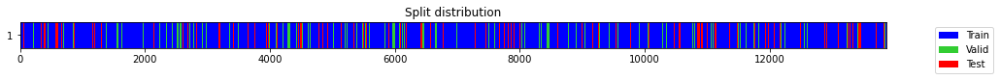

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.685561,0.660679,0.587628,0.656315,00:01
1,0.605304,0.576957,0.690841,0.691712,00:01
2,0.524953,0.503049,0.630189,0.620357,00:01
3,0.479275,0.461814,0.687510,0.667941,00:01
4,0.442562,0.424990,0.731992,0.712252,00:01
5,0.409682,0.386962,0.789078,0.780985,00:01
6,0.370304,0.341149,0.813858,0.801417,00:01
7,0.336478,0.322339,0.844049,0.848490,00:01
8,0.326422,0.315130,0.821454,0.814753,00:01
9,0.301409,0.295408,0.829155,0.821562,00:01


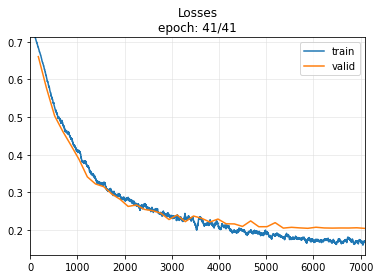

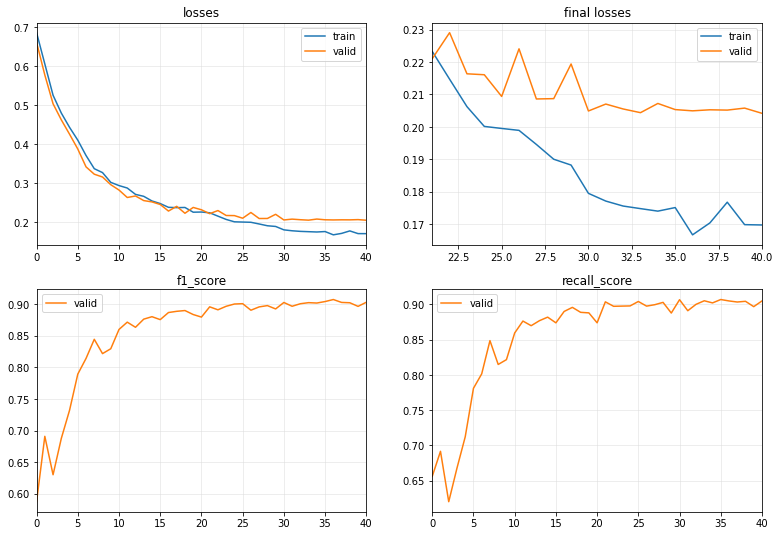

Training time: 80.0989 seconds


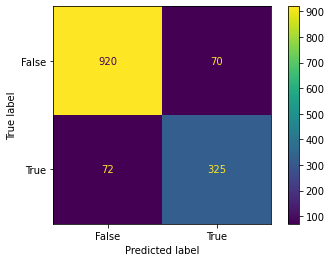

[I 2022-12-05 06:47:56,304] Trial 23 finished with value: 0.8207070707070707 and parameters: {'learning_rate': 0.00012569099285259088, 'batch_size': 64, 'pred_val': 295, 'num_epochs': 41, 'weight_decay': 2.7423286942479947e-05, 'normalization': True, 'window_length': 254}. Best is trial 11 with value: 0.8933866185380946.


0.8207070707070707


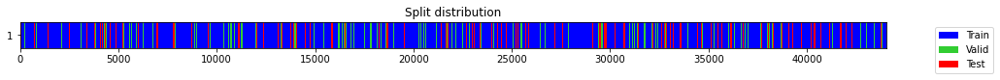

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.718832,0.690803,0.530822,0.620192,00:01
1,0.677518,0.642020,0.598251,0.649435,00:01
2,0.630895,0.589912,0.663922,0.685733,00:01
3,0.577697,0.533311,0.696045,0.685232,00:01
4,0.523407,0.481171,0.682169,0.664841,00:01
5,0.477208,0.442415,0.711731,0.691458,00:01
6,0.442656,0.408235,0.759461,0.740373,00:01
7,0.411158,0.375134,0.786974,0.770457,00:01
8,0.381389,0.358684,0.802629,0.795587,00:01
9,0.357977,0.332255,0.820184,0.811688,00:01


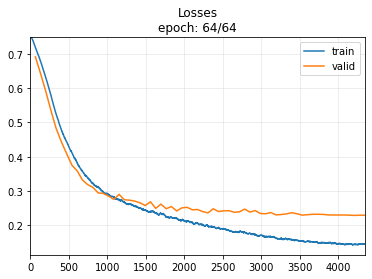

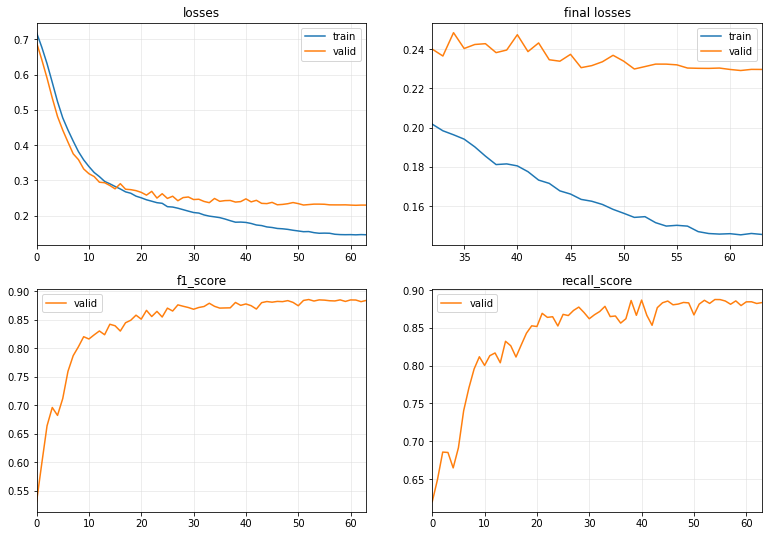

Training time: 103.4293 seconds


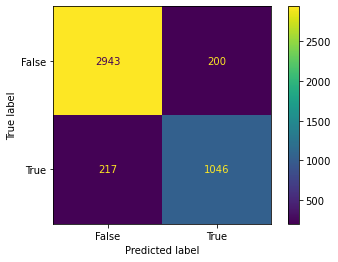

[I 2022-12-05 06:49:43,219] Trial 24 finished with value: 0.8337983260263053 and parameters: {'learning_rate': 0.0002514322726729685, 'batch_size': 512, 'pred_val': 1, 'num_epochs': 64, 'weight_decay': 0.00010886837341734804, 'normalization': True, 'window_length': 80}. Best is trial 11 with value: 0.8933866185380946.


0.8337983260263053


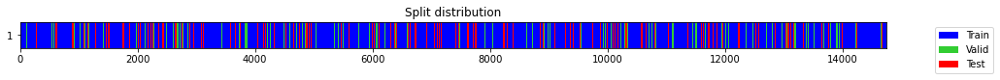

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.568071,0.524642,0.563455,0.573183,00:01
1,0.486133,0.468708,0.671080,0.653758,00:01
2,0.436579,0.417382,0.721960,0.700883,00:01
3,0.382163,0.360649,0.827563,0.825499,00:01
4,0.342839,0.354027,0.789319,0.769982,00:01
5,0.320871,0.302488,0.849778,0.854730,00:01
6,0.296162,0.299614,0.832962,0.825339,00:01
7,0.289879,0.318086,0.839591,0.859268,00:01
8,0.282886,0.301753,0.837091,0.834025,00:01
9,0.265086,0.269235,0.864254,0.864254,00:01


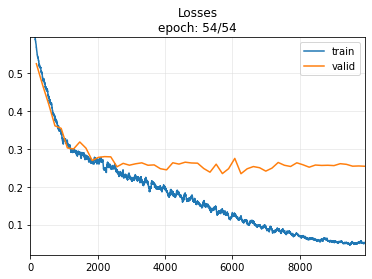

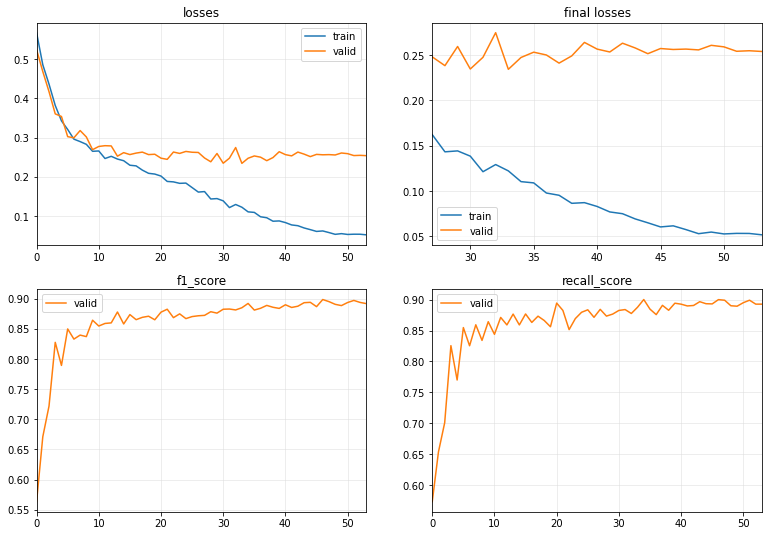

Training time: 112.8325 seconds


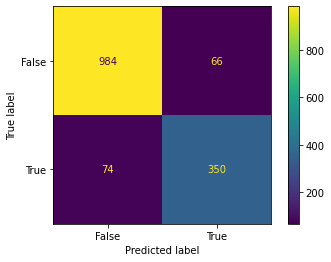

[I 2022-12-05 06:51:38,859] Trial 25 finished with value: 0.8333333333333334 and parameters: {'learning_rate': 0.0006317932783674893, 'batch_size': 64, 'pred_val': 148, 'num_epochs': 54, 'weight_decay': 0.004525471661678056, 'normalization': True, 'window_length': 239}. Best is trial 11 with value: 0.8933866185380946.


0.8333333333333334


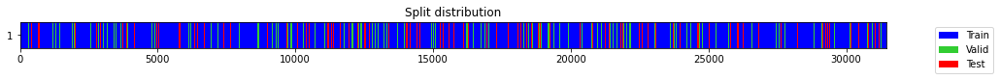

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.655996,0.638654,0.621250,0.655069,00:03
1,0.552664,0.539098,0.659559,0.648520,00:03
2,0.485095,0.476684,0.645813,0.632588,00:03
3,0.438851,0.431268,0.725786,0.709010,00:03
4,0.402454,0.388436,0.773825,0.760998,00:03
5,0.360170,0.354943,0.795802,0.785502,00:02
6,0.329331,0.329511,0.808857,0.798266,00:02
7,0.311076,0.321097,0.817928,0.813540,00:03
8,0.306269,0.308900,0.829020,0.817692,00:03
9,0.285832,0.304187,0.836167,0.834832,00:03


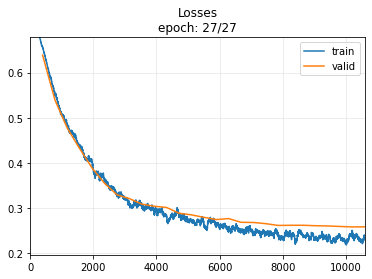

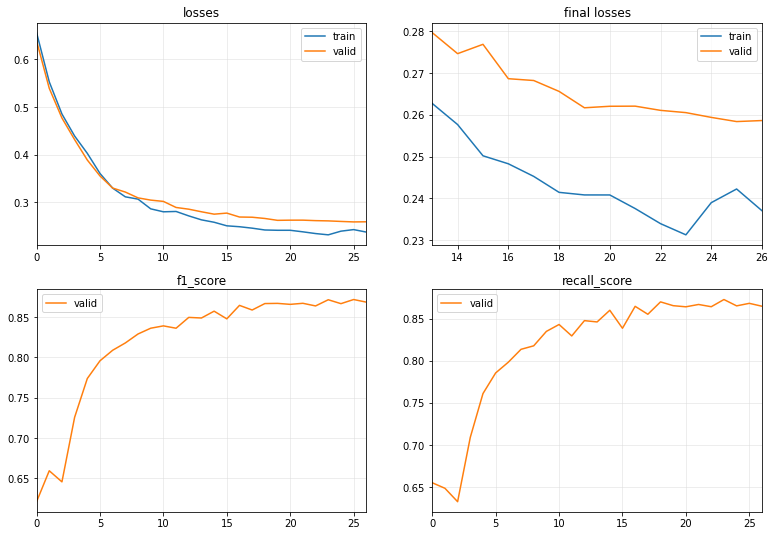

Training time: 93.4457 seconds


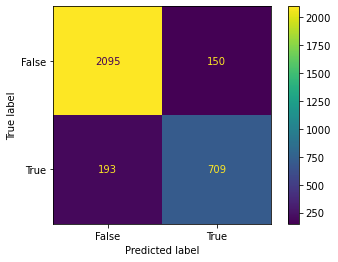

[I 2022-12-05 06:53:14,039] Trial 26 finished with value: 0.8052243043725156 and parameters: {'learning_rate': 7.130916263050801e-05, 'batch_size': 64, 'pred_val': 295, 'num_epochs': 27, 'weight_decay': 1.9500391972739202e-05, 'normalization': False, 'window_length': 112}. Best is trial 11 with value: 0.8933866185380946.


0.8052243043725156


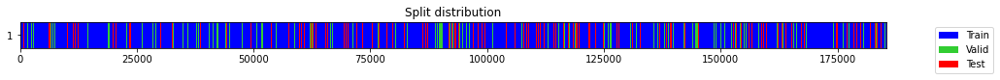

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.644089,0.632906,0.626965,0.661033,00:03
1,0.594340,0.584863,0.665493,0.673610,00:02
2,0.547446,0.534578,0.678032,0.665308,00:02
3,0.503251,0.491298,0.678046,0.660712,00:02
4,0.464228,0.454586,0.703302,0.683048,00:03
5,0.430072,0.423572,0.738353,0.719702,00:03
6,0.403394,0.395362,0.765919,0.752804,00:02
7,0.376459,0.371177,0.783124,0.771765,00:02
8,0.359701,0.354235,0.792751,0.782888,00:02
9,0.341113,0.338456,0.804193,0.794047,00:03


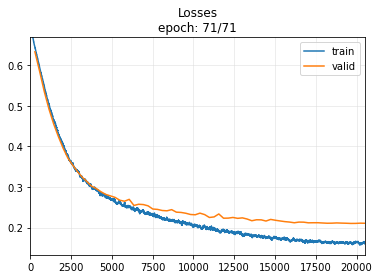

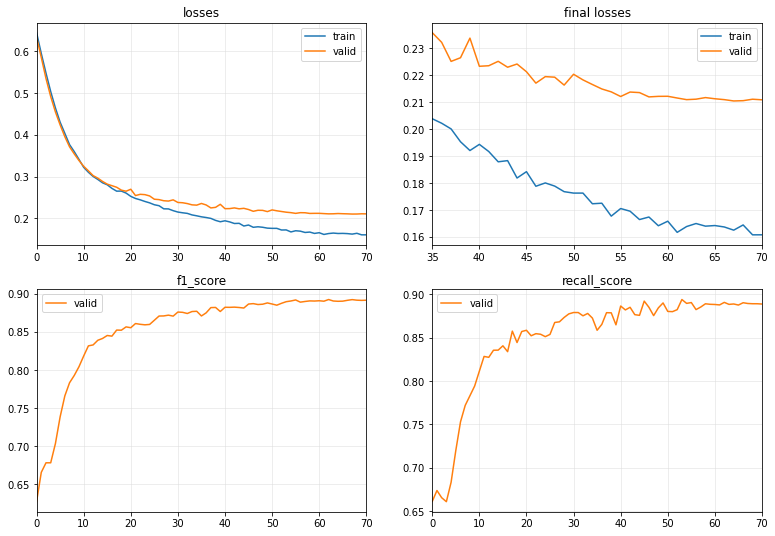

Training time: 257.4742 seconds


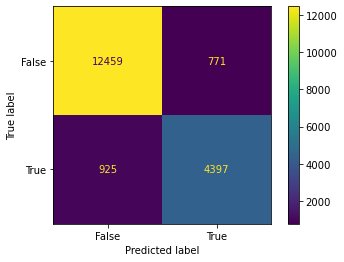

[I 2022-12-05 06:57:54,000] Trial 27 finished with value: 0.838322211630124 and parameters: {'learning_rate': 0.0001117112413438293, 'batch_size': 512, 'pred_val': 393, 'num_epochs': 71, 'weight_decay': 0.00018686704245924677, 'normalization': True, 'window_length': 19}. Best is trial 11 with value: 0.8933866185380946.


0.838322211630124


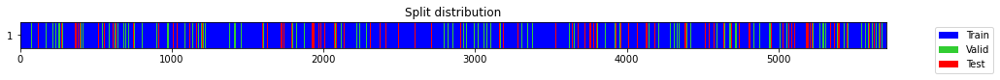

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.608820,0.565963,0.426374,0.501184,00:01
1,0.556551,0.530373,0.493186,0.537177,00:01
2,0.518455,0.504419,0.601721,0.601157,00:01
3,0.494317,0.476710,0.656888,0.642431,00:01
4,0.461787,0.446830,0.700056,0.686208,00:01
5,0.427176,0.417505,0.719151,0.702725,00:01
6,0.395780,0.396401,0.716766,0.702680,00:01
7,0.368129,0.375728,0.775936,0.773941,00:01
8,0.348576,0.371488,0.784389,0.784907,00:01
9,0.325569,0.377152,0.781232,0.789095,00:01


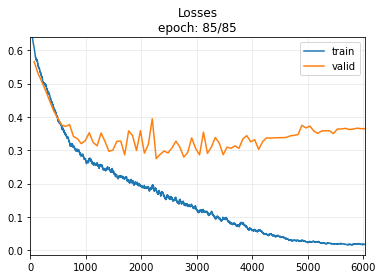

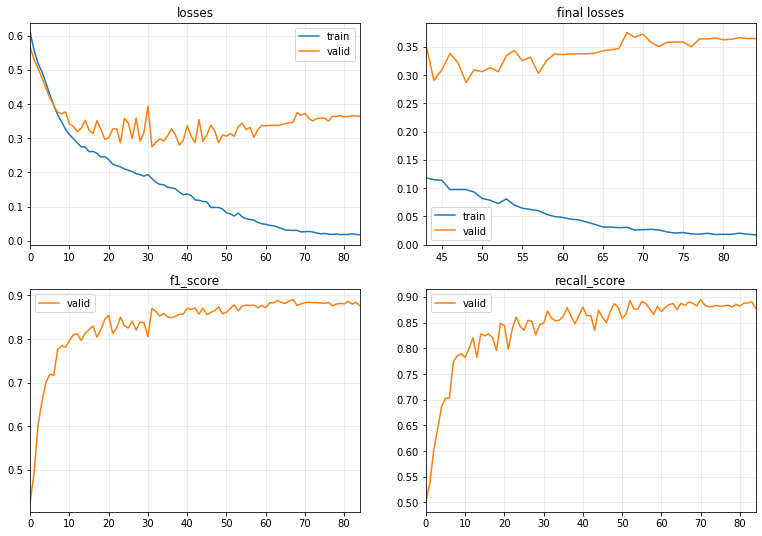

Training time: 124.2983 seconds


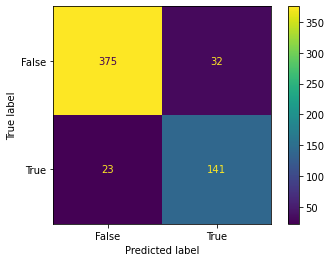

[I 2022-12-05 07:00:00,932] Trial 28 finished with value: 0.8367952522255193 and parameters: {'learning_rate': 0.0006109557918189444, 'batch_size': 64, 'pred_val': 442, 'num_epochs': 85, 'weight_decay': 1.0312622750551333e-05, 'normalization': True, 'window_length': 617}. Best is trial 11 with value: 0.8933866185380946.


0.8367952522255193


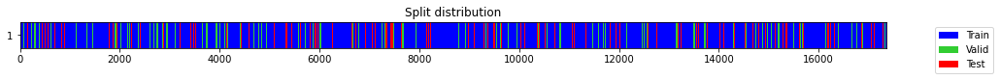

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.759548,0.737318,0.428278,0.573974,00:01
1,0.704319,0.666374,0.580559,0.646817,00:01
2,0.618756,0.568592,0.684002,0.683235,00:01
3,0.531557,0.495616,0.666828,0.650051,00:01
4,0.481680,0.456885,0.692941,0.673132,00:01
5,0.444497,0.424379,0.722905,0.700644,00:01
6,0.412653,0.395097,0.764647,0.749161,00:01
7,0.385140,0.370235,0.782856,0.768445,00:01
8,0.363952,0.352337,0.801610,0.787140,00:01
9,0.340302,0.341635,0.830397,0.826459,00:01


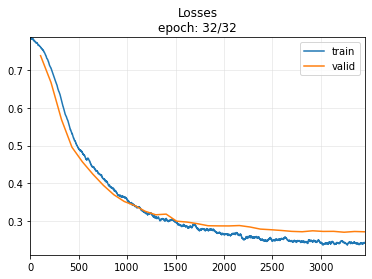

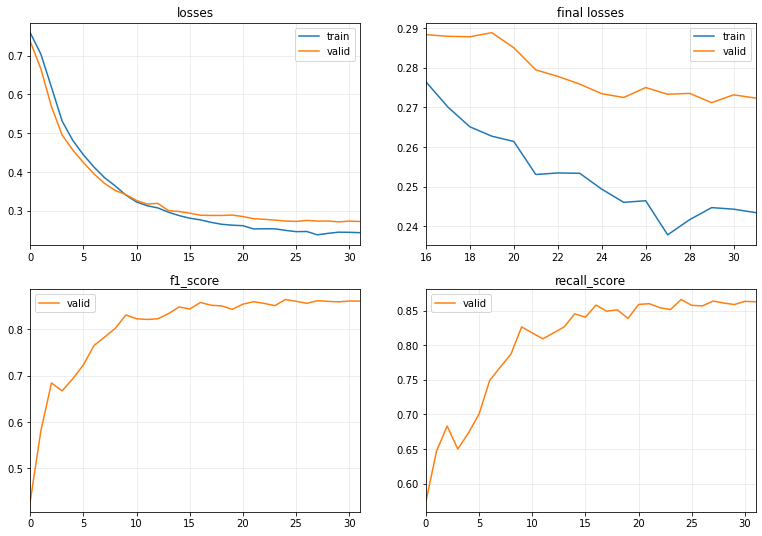

Training time: 51.6607 seconds


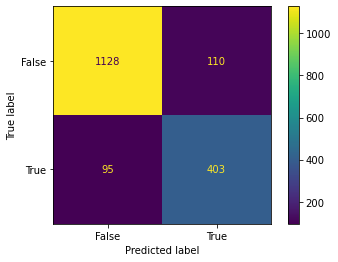

[I 2022-12-05 07:00:55,496] Trial 29 finished with value: 0.7972304648862513 and parameters: {'learning_rate': 7.660368667232494e-05, 'batch_size': 128, 'pred_val': 99, 'num_epochs': 32, 'weight_decay': 3.419269027835096e-05, 'normalization': True, 'window_length': 203}. Best is trial 11 with value: 0.8933866185380946.


0.7972304648862513


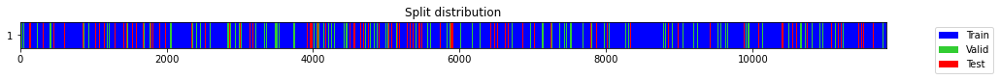

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.706337,0.674003,0.587527,0.612289,00:01
1,0.686362,0.631481,0.650766,0.670913,00:01
2,0.657562,0.573169,0.673787,0.658767,00:00
3,0.621453,0.520758,0.568592,0.578108,00:01
4,0.582565,0.489970,0.538478,0.558934,00:01
5,0.547288,0.459960,0.607676,0.604657,00:00
6,0.516900,0.430276,0.723876,0.703944,00:01
7,0.487761,0.401411,0.794420,0.782372,00:01
8,0.459225,0.376510,0.808295,0.799767,00:01
9,0.432453,0.351345,0.825977,0.825402,00:01


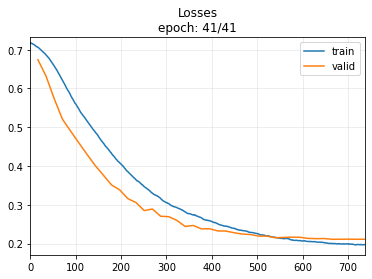

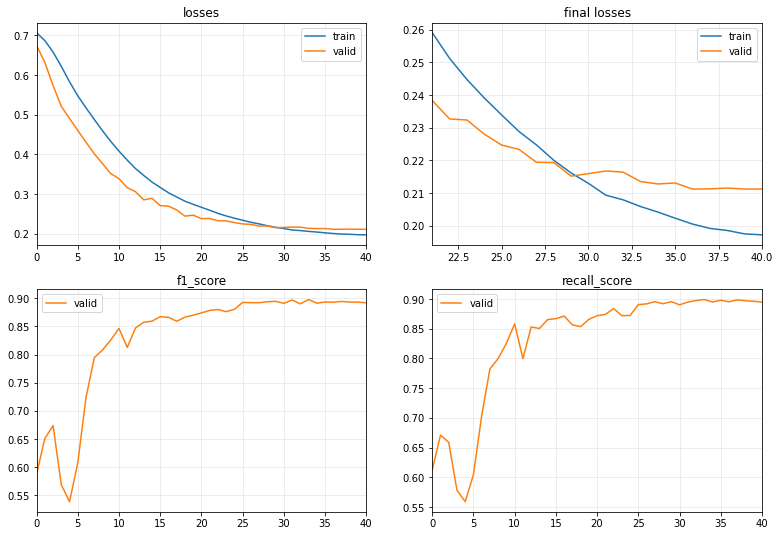

Training time: 46.8778 seconds


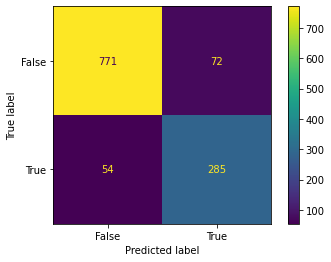

[I 2022-12-05 07:01:45,176] Trial 30 finished with value: 0.8189655172413793 and parameters: {'learning_rate': 0.00027827810958185175, 'batch_size': 512, 'pred_val': 99, 'num_epochs': 41, 'weight_decay': 7.043362740620125e-05, 'normalization': True, 'window_length': 298}. Best is trial 11 with value: 0.8933866185380946.


0.8189655172413793


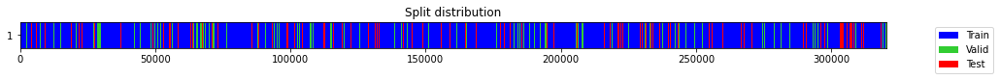

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.536311,0.525343,0.657052,0.643812,00:04
1,0.463173,0.457941,0.701041,0.682302,00:04
2,0.409999,0.406399,0.755214,0.740495,00:04
3,0.370050,0.370586,0.773893,0.760410,00:04
4,0.343267,0.348526,0.790974,0.778740,00:04
5,0.324669,0.323333,0.813017,0.800851,00:04
6,0.305692,0.310160,0.829665,0.829290,00:04
7,0.293475,0.296551,0.834487,0.827446,00:04
8,0.281180,0.291250,0.831632,0.812184,00:04
9,0.277939,0.280083,0.849570,0.847360,00:04


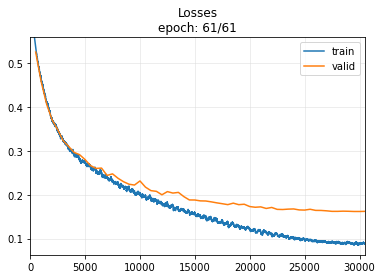

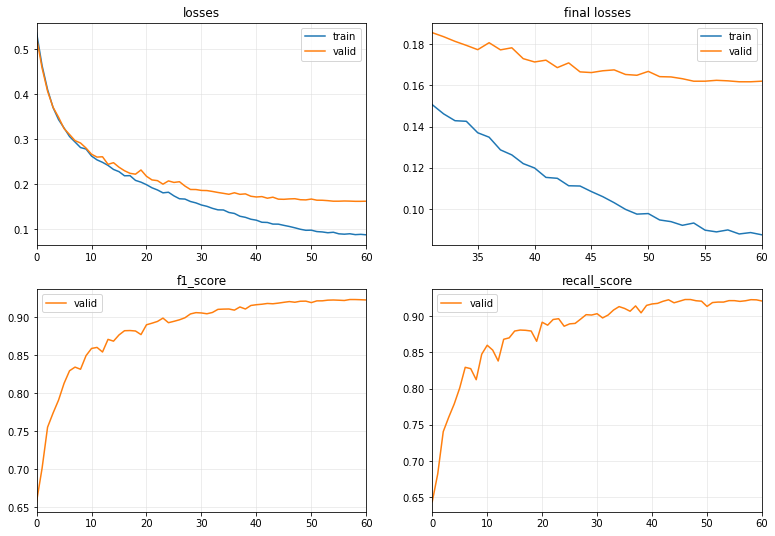

Training time: 334.9907 seconds


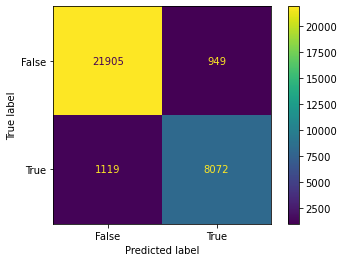

[I 2022-12-05 07:08:37,845] Trial 31 finished with value: 0.8864484954974742 and parameters: {'learning_rate': 0.0003604470319394795, 'batch_size': 512, 'pred_val': 148, 'num_epochs': 61, 'weight_decay': 2.2770287707326818e-05, 'normalization': True, 'window_length': 11}. Best is trial 11 with value: 0.8933866185380946.


0.8864484954974742


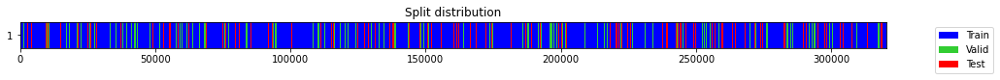

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.539551,0.524228,0.683149,0.671431,00:04
1,0.456252,0.446767,0.706217,0.686963,00:04
2,0.401156,0.394559,0.760185,0.744814,00:04
3,0.361188,0.358520,0.786610,0.774523,00:04
4,0.334709,0.330849,0.815312,0.811275,00:04
5,0.315631,0.315073,0.826691,0.823364,00:04
6,0.302480,0.299274,0.826060,0.810260,00:04
7,0.287185,0.285911,0.846152,0.846253,00:04
8,0.277000,0.278680,0.849761,0.855204,00:04
9,0.263820,0.264863,0.856371,0.850482,00:04


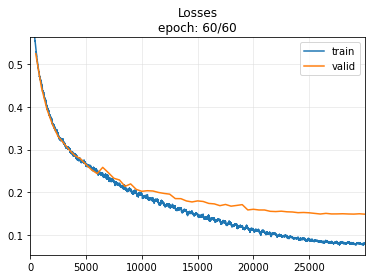

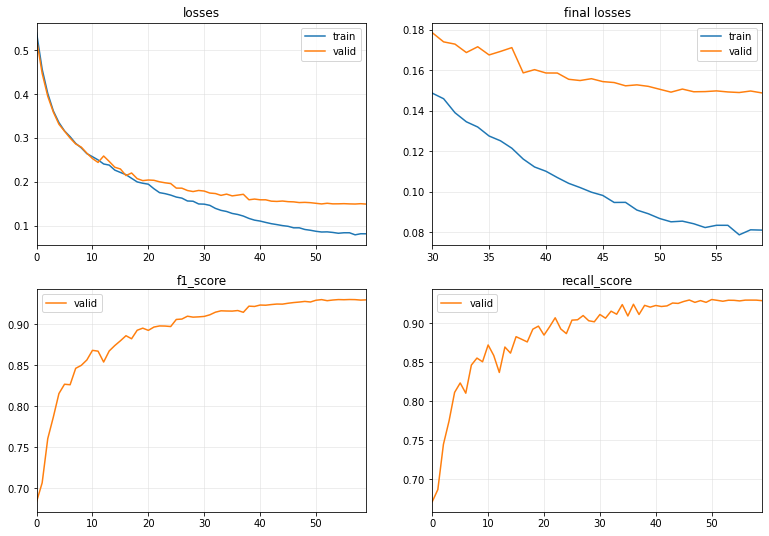

Training time: 328.8165 seconds


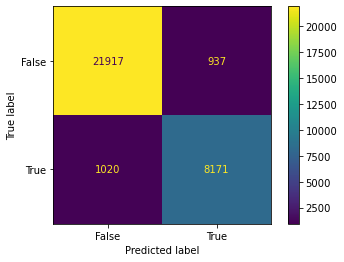

[I 2022-12-05 07:15:24,277] Trial 32 finished with value: 0.8930542652603967 and parameters: {'learning_rate': 0.000419093696330987, 'batch_size': 512, 'pred_val': 197, 'num_epochs': 60, 'weight_decay': 2.234868970457348e-05, 'normalization': True, 'window_length': 11}. Best is trial 11 with value: 0.8933866185380946.


0.8930542652603967


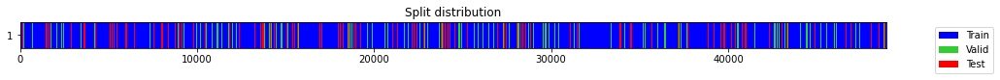

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.626590,0.573499,0.659477,0.673304,00:01
1,0.556978,0.508119,0.667050,0.650281,00:01
2,0.494800,0.451347,0.681425,0.662397,00:01
3,0.445944,0.407865,0.757048,0.739320,00:01
4,0.400399,0.368002,0.765974,0.746466,00:01
5,0.362364,0.343413,0.815243,0.818283,00:01
6,0.334831,0.320318,0.827817,0.829919,00:01
7,0.312278,0.311430,0.820163,0.812380,00:01
8,0.300672,0.291135,0.844778,0.839534,00:01
9,0.285656,0.298919,0.825481,0.806198,00:01


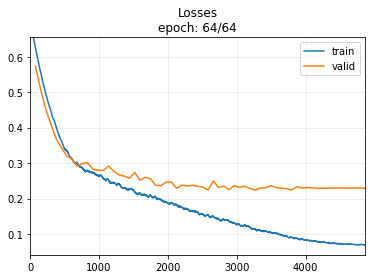

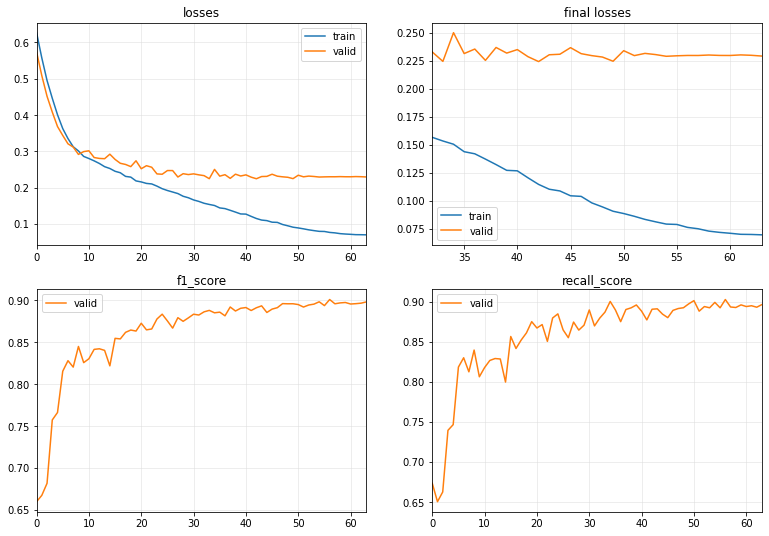

Training time: 108.1249 seconds


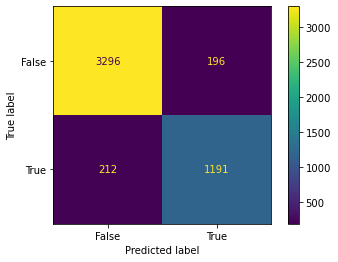

[I 2022-12-05 07:17:16,110] Trial 33 finished with value: 0.853763440860215 and parameters: {'learning_rate': 0.000780697601924747, 'batch_size': 512, 'pred_val': 197, 'num_epochs': 64, 'weight_decay': 1.712862659007799e-05, 'normalization': True, 'window_length': 72}. Best is trial 11 with value: 0.8933866185380946.


0.853763440860215


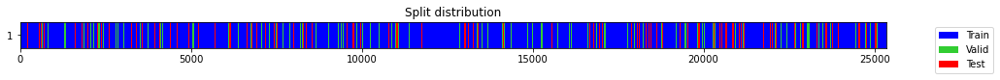

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.648575,0.612914,0.624954,0.626840,00:01
1,0.610713,0.560742,0.642756,0.633269,00:01
2,0.566503,0.510766,0.610659,0.605541,00:01
3,0.520201,0.472782,0.620226,0.612985,00:01
4,0.477509,0.437992,0.711604,0.694981,00:01
5,0.437768,0.397074,0.777221,0.771406,00:01
6,0.400548,0.376866,0.795530,0.801204,00:01
7,0.365545,0.327743,0.818569,0.809439,00:01
8,0.336837,0.315573,0.829582,0.821960,00:01
9,0.316029,0.302053,0.834137,0.828419,00:01


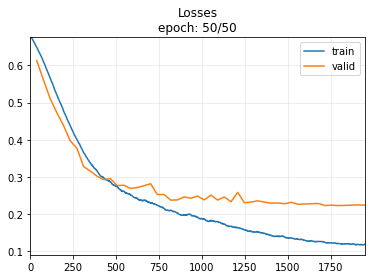

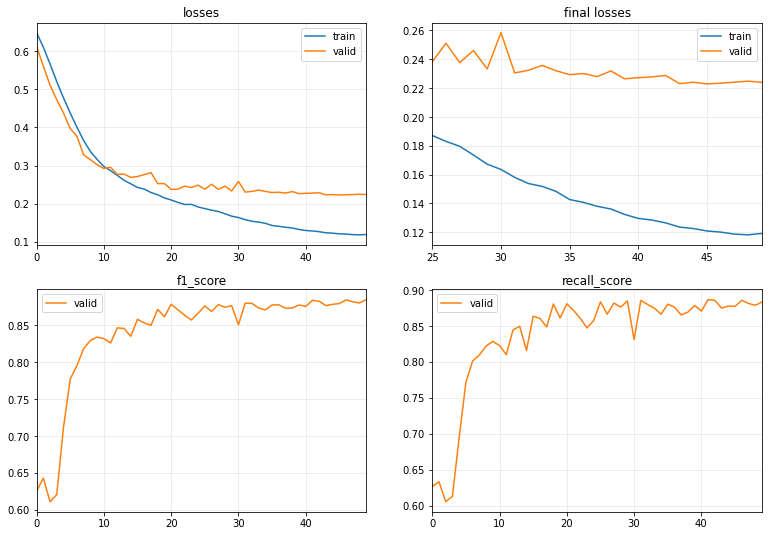

Training time: 69.1487 seconds


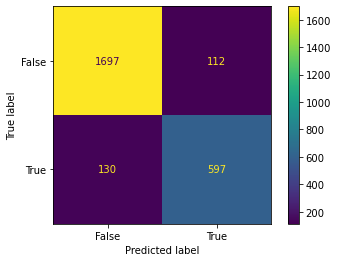

[I 2022-12-05 07:18:28,320] Trial 34 finished with value: 0.8314763231197771 and parameters: {'learning_rate': 0.00047004438844504704, 'batch_size': 512, 'pred_val': 246, 'num_epochs': 50, 'weight_decay': 1.6647484871513113e-05, 'normalization': True, 'window_length': 139}. Best is trial 11 with value: 0.8933866185380946.


0.8314763231197771


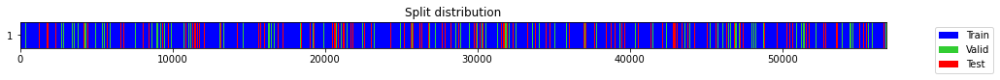

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.619028,0.583299,0.644979,0.640097,00:01
1,0.560927,0.521099,0.668168,0.652813,00:01
2,0.499620,0.464287,0.707714,0.688635,00:01
3,0.448314,0.416329,0.771533,0.758234,00:01
4,0.401770,0.374012,0.794497,0.789704,00:01
5,0.361427,0.338414,0.815333,0.810642,00:01
6,0.331155,0.313084,0.832982,0.827961,00:01
7,0.312784,0.305728,0.838976,0.843542,00:01
8,0.294066,0.304230,0.829325,0.825251,00:01
9,0.284912,0.278239,0.853510,0.854808,00:01


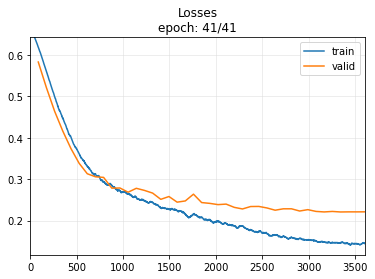

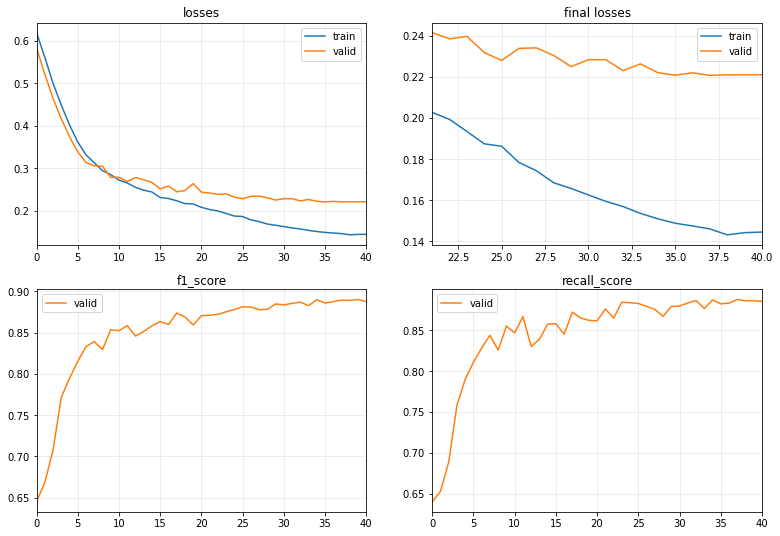

Training time: 73.1543 seconds


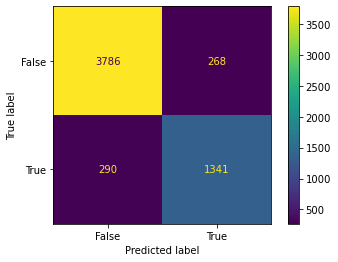

[I 2022-12-05 07:19:43,890] Trial 35 finished with value: 0.8277777777777778 and parameters: {'learning_rate': 0.0003703845456269848, 'batch_size': 512, 'pred_val': 197, 'num_epochs': 41, 'weight_decay': 4.588514525302202e-05, 'normalization': False, 'window_length': 62}. Best is trial 11 with value: 0.8933866185380946.


0.8277777777777778


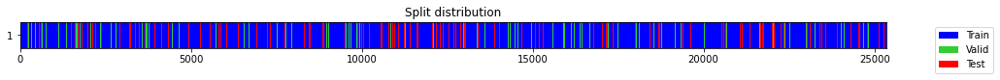

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.562149,0.534008,0.606127,0.601813,00:01
1,0.502000,0.481480,0.596173,0.596080,00:01
2,0.455375,0.437884,0.690609,0.670981,00:01
3,0.406613,0.390096,0.760951,0.743832,00:01
4,0.360477,0.355031,0.787185,0.771760,00:01
5,0.333173,0.338219,0.795497,0.783162,00:01
6,0.316005,0.313192,0.803934,0.784320,00:01
7,0.299012,0.303278,0.837058,0.837058,00:01
8,0.293720,0.292180,0.837223,0.831723,00:01
9,0.283329,0.310390,0.824103,0.819871,00:01


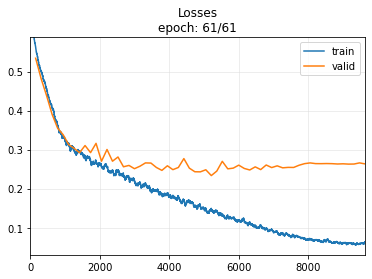

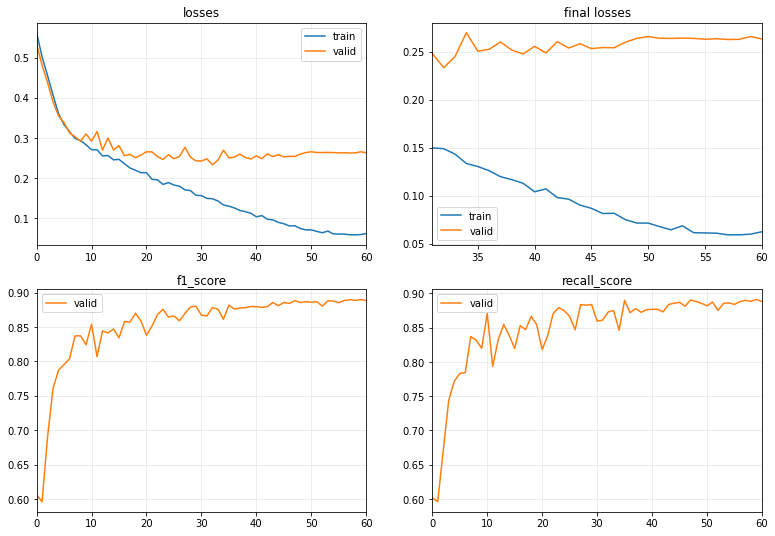

Training time: 121.5383 seconds


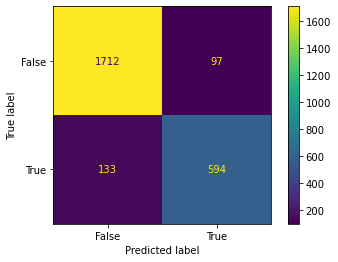

[I 2022-12-05 07:21:48,466] Trial 36 finished with value: 0.8377997179125529 and parameters: {'learning_rate': 0.0005404575520775763, 'batch_size': 128, 'pred_val': 99, 'num_epochs': 61, 'weight_decay': 0.0006339121314587838, 'normalization': True, 'window_length': 139}. Best is trial 11 with value: 0.8933866185380946.


0.8377997179125529


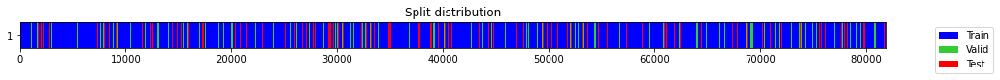

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.605901,0.572720,0.655103,0.648500,00:02
1,0.521650,0.489381,0.663392,0.647927,00:01
2,0.450224,0.424831,0.741315,0.726969,00:01
3,0.390159,0.376971,0.778796,0.765906,00:01
4,0.354951,0.347487,0.794098,0.778745,00:01
5,0.327267,0.342734,0.798850,0.780560,00:01
6,0.311618,0.312532,0.835612,0.834548,00:01
7,0.296288,0.303839,0.835122,0.829006,00:01
8,0.285993,0.310487,0.829467,0.823130,00:01
9,0.273984,0.291897,0.845849,0.849296,00:01


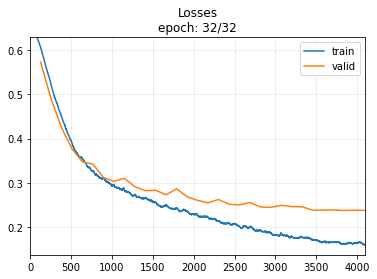

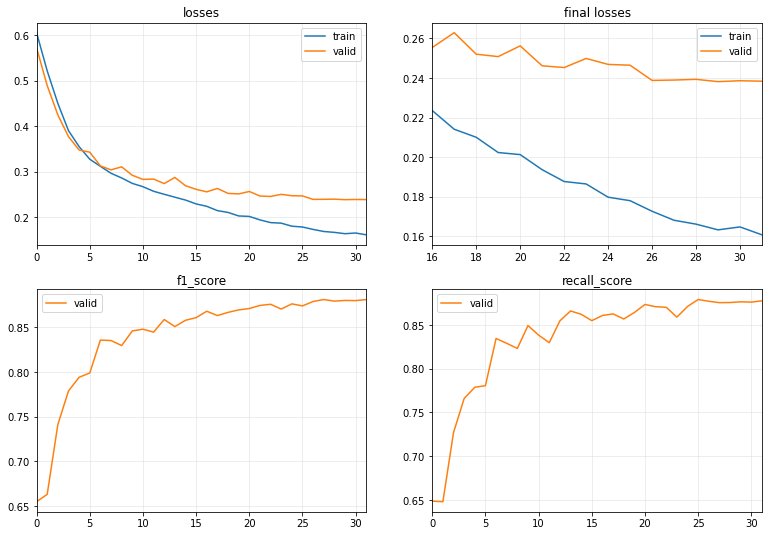

Training time: 67.257 seconds


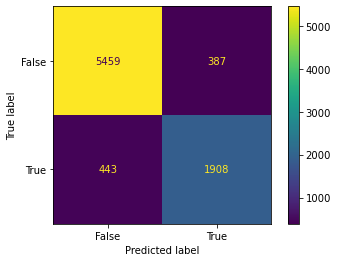

[I 2022-12-05 07:23:00,684] Trial 37 finished with value: 0.82135170038743 and parameters: {'learning_rate': 0.00041599761406892514, 'batch_size': 512, 'pred_val': 50, 'num_epochs': 32, 'weight_decay': 2.6884510074572402e-05, 'normalization': True, 'window_length': 43}. Best is trial 11 with value: 0.8933866185380946.


0.82135170038743


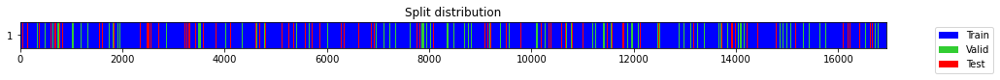

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.659979,0.582476,0.664243,0.669286,00:01
1,0.577212,0.511343,0.626377,0.617477,00:01
2,0.518036,0.471326,0.638612,0.626915,00:01
3,0.471380,0.434171,0.715839,0.696407,00:01
4,0.430715,0.392818,0.768962,0.753038,00:01
5,0.388376,0.365955,0.777295,0.760657,00:01
6,0.351981,0.353317,0.801991,0.802176,00:01
7,0.331707,0.331266,0.811319,0.792358,00:01
8,0.309912,0.345114,0.784228,0.764205,00:01
9,0.294416,0.307329,0.824871,0.809992,00:01


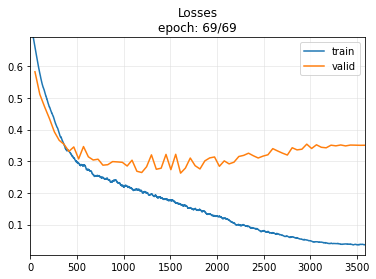

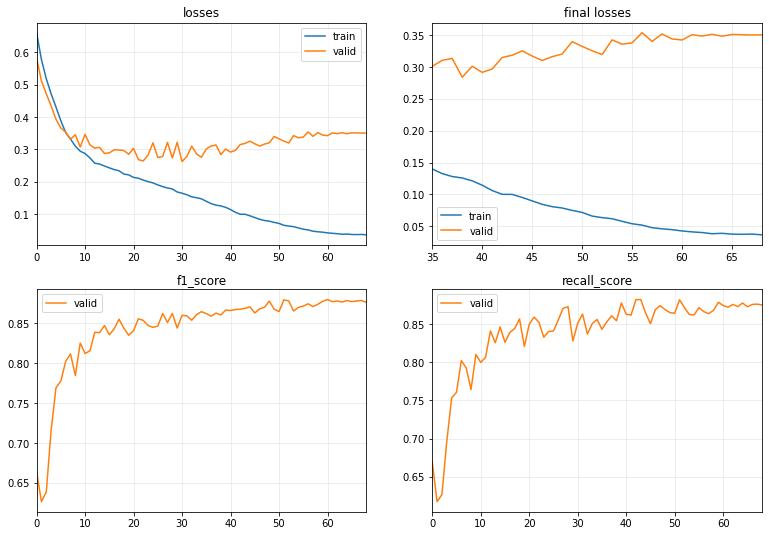

Training time: 94.0315 seconds


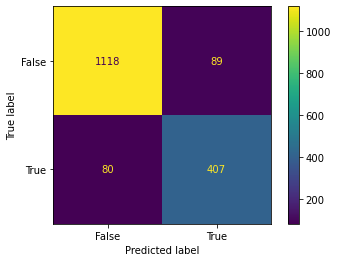

[I 2022-12-05 07:24:36,212] Trial 38 finished with value: 0.8280773143438455 and parameters: {'learning_rate': 0.0009950840190131496, 'batch_size': 256, 'pred_val': 1, 'num_epochs': 69, 'weight_decay': 4.7025122936621696e-05, 'normalization': False, 'window_length': 208}. Best is trial 11 with value: 0.8933866185380946.


0.8280773143438455


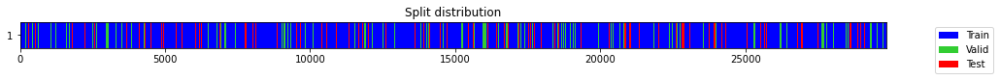

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.586430,0.576938,0.651685,0.641501,00:03
1,0.538122,0.525013,0.641642,0.629291,00:02
2,0.507768,0.493917,0.645839,0.632588,00:02
3,0.473146,0.464470,0.684901,0.666100,00:02
4,0.449670,0.437987,0.725633,0.706483,00:02
5,0.416062,0.409856,0.747523,0.731611,00:02
6,0.383951,0.384295,0.771714,0.758408,00:02
7,0.362373,0.358741,0.800581,0.791390,00:02
8,0.339550,0.340270,0.810706,0.805472,00:02
9,0.334995,0.323458,0.825834,0.825042,00:02


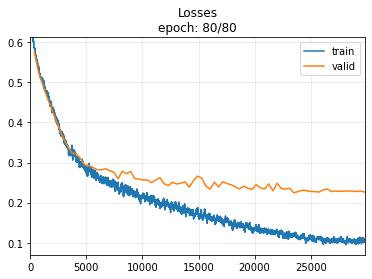

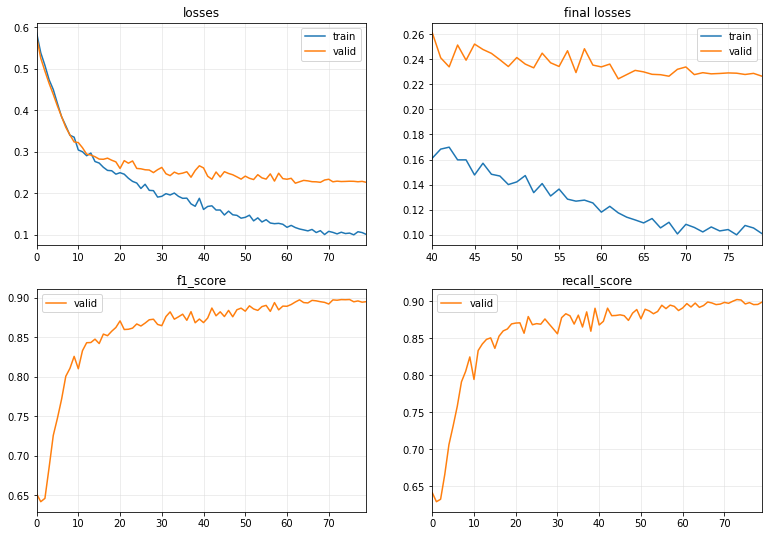

Training time: 306.2366 seconds


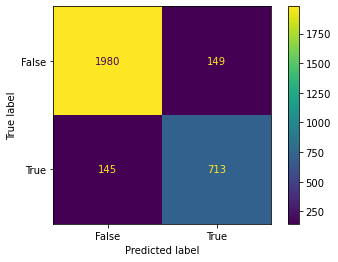

[I 2022-12-05 07:29:45,655] Trial 39 finished with value: 0.8290697674418606 and parameters: {'learning_rate': 0.00014258608964809146, 'batch_size': 64, 'pred_val': 246, 'num_epochs': 80, 'weight_decay': 0.00015961091655319795, 'normalization': True, 'window_length': 118}. Best is trial 11 with value: 0.8933866185380946.


0.8290697674418606


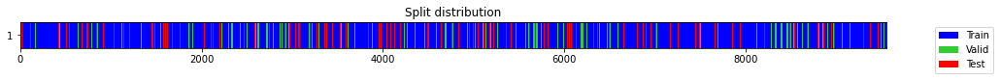

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.642711,0.627217,0.494645,0.522687,00:01
1,0.630187,0.604098,0.507415,0.531479,00:00
2,0.613418,0.571417,0.502566,0.535153,00:00
3,0.592284,0.538156,0.453257,0.512815,00:00
4,0.570058,0.516884,0.453257,0.512815,00:00
5,0.547428,0.504443,0.479686,0.526001,00:00
6,0.526359,0.482507,0.589991,0.591196,00:00
7,0.504853,0.459970,0.644519,0.631481,00:00
8,0.483883,0.437878,0.717790,0.701798,00:00
9,0.461996,0.423674,0.741901,0.731827,00:00


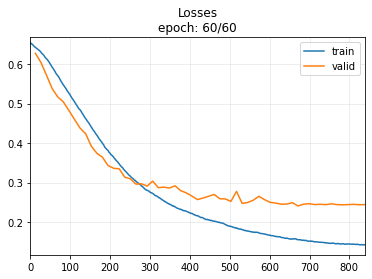

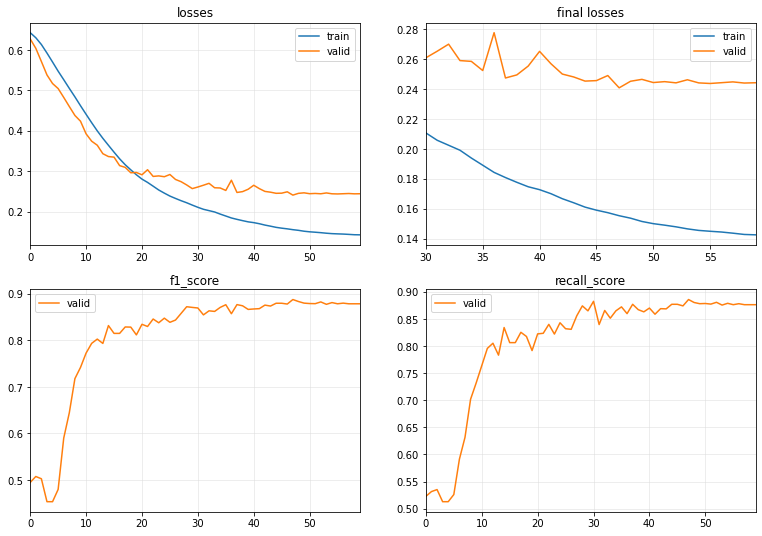

Training time: 66.0398 seconds


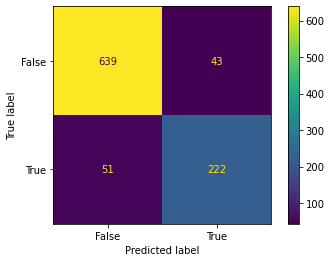

[I 2022-12-05 07:30:53,144] Trial 40 finished with value: 0.825278810408922 and parameters: {'learning_rate': 0.0003555120453347487, 'batch_size': 512, 'pred_val': 148, 'num_epochs': 60, 'weight_decay': 1.2981716355482159e-05, 'normalization': False, 'window_length': 369}. Best is trial 11 with value: 0.8933866185380946.


0.825278810408922


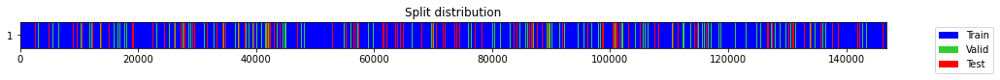

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.607832,0.587497,0.650564,0.656794,00:02
1,0.545784,0.527836,0.680173,0.669139,00:02
2,0.488930,0.472736,0.694873,0.676494,00:02
3,0.442616,0.429593,0.731711,0.713500,00:02
4,0.405953,0.389237,0.775597,0.764018,00:02
5,0.371424,0.357628,0.793070,0.779436,00:02
6,0.345082,0.338257,0.796345,0.778548,00:02
7,0.330369,0.318781,0.821480,0.815753,00:02
8,0.312626,0.311905,0.822697,0.810671,00:02
9,0.298398,0.308002,0.819528,0.799664,00:02


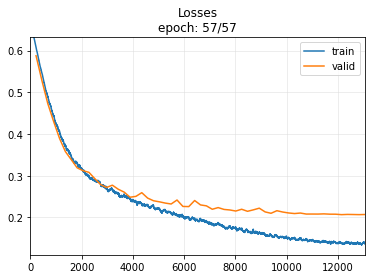

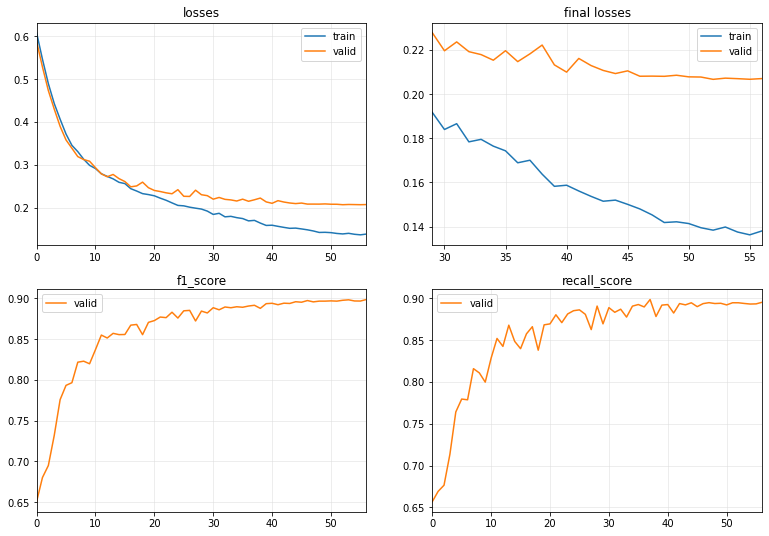

Training time: 171.1681 seconds


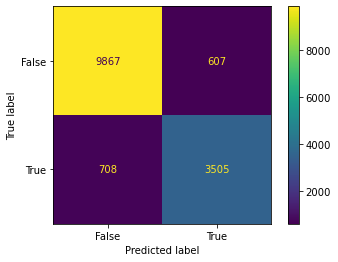

[I 2022-12-05 07:33:55,280] Trial 41 finished with value: 0.842042042042042 and parameters: {'learning_rate': 0.00023059810996902723, 'batch_size': 512, 'pred_val': 148, 'num_epochs': 57, 'weight_decay': 2.541596490154837e-05, 'normalization': True, 'window_length': 24}. Best is trial 11 with value: 0.8933866185380946.


0.842042042042042


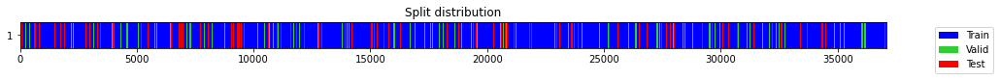

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.702820,0.666804,0.572523,0.647890,00:01
1,0.665061,0.612134,0.636841,0.679471,00:01
2,0.615415,0.554329,0.679505,0.677920,00:01
3,0.557050,0.496822,0.672517,0.655749,00:01
4,0.503093,0.452749,0.683665,0.664886,00:01
5,0.462654,0.422076,0.746171,0.732640,00:01
6,0.422632,0.383445,0.772221,0.757392,00:01
7,0.388923,0.349940,0.806516,0.794715,00:01
8,0.358444,0.327103,0.823281,0.819494,00:01
9,0.334405,0.311040,0.824076,0.821088,00:01


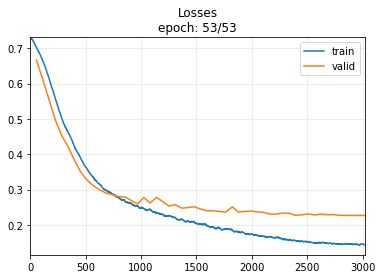

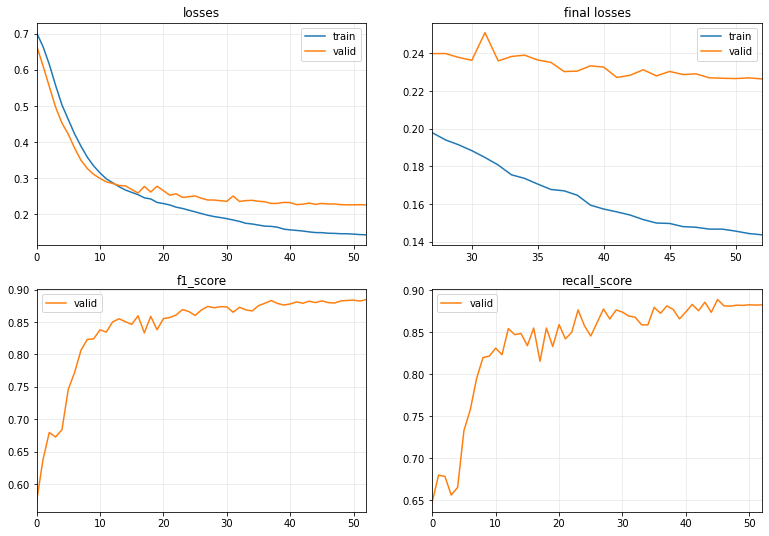

Training time: 81.4556 seconds


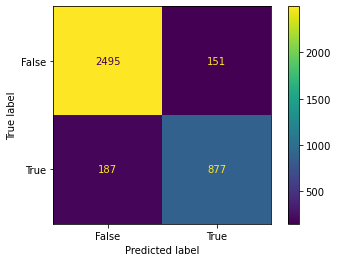

[I 2022-12-05 07:35:20,311] Trial 42 finished with value: 0.8384321223709369 and parameters: {'learning_rate': 0.00028433076306441516, 'batch_size': 512, 'pred_val': 148, 'num_epochs': 53, 'weight_decay': 2.0542392362343883e-05, 'normalization': True, 'window_length': 95}. Best is trial 11 with value: 0.8933866185380946.


0.8384321223709369


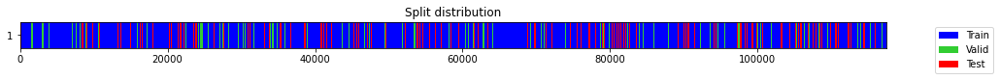

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.686525,0.662520,0.563660,0.634317,00:02
1,0.612900,0.585804,0.663653,0.688182,00:02
2,0.532627,0.508367,0.687270,0.671778,00:02
3,0.469642,0.450970,0.707283,0.686488,00:02
4,0.423251,0.405084,0.771412,0.758129,00:02
5,0.381759,0.365089,0.796459,0.784966,00:02
6,0.349214,0.335621,0.804577,0.790367,00:02
7,0.325589,0.318211,0.819904,0.809379,00:02
8,0.314659,0.305622,0.825957,0.817002,00:02
9,0.300657,0.298112,0.831953,0.824714,00:02


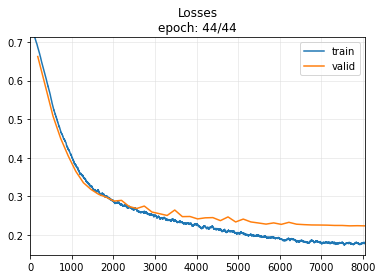

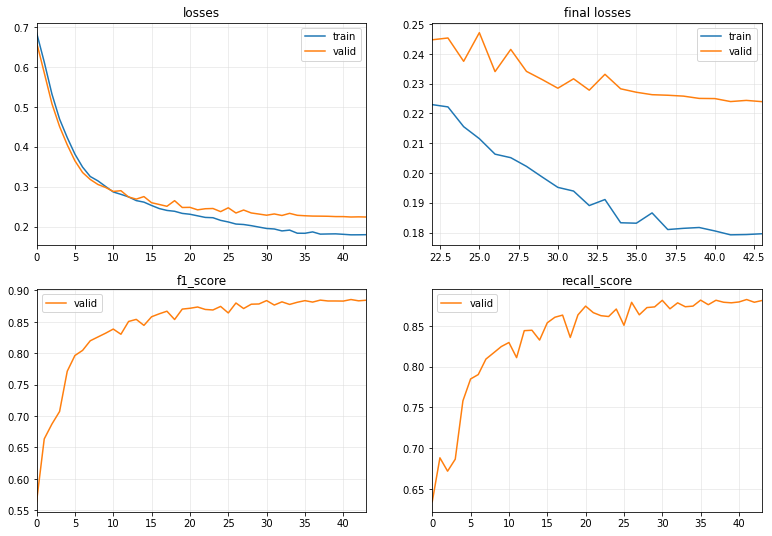

Training time: 112.6503 seconds


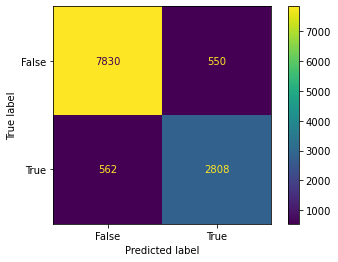

[I 2022-12-05 07:37:19,154] Trial 43 finished with value: 0.8347205707491083 and parameters: {'learning_rate': 0.0001728904802844317, 'batch_size': 512, 'pred_val': 197, 'num_epochs': 44, 'weight_decay': 3.4028331562407575e-05, 'normalization': True, 'window_length': 30}. Best is trial 11 with value: 0.8933866185380946.


0.8347205707491083


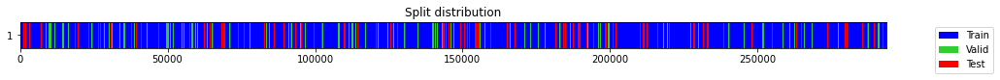

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.500708,0.487736,0.616993,0.610399,00:07
1,0.420374,0.410361,0.749509,0.732387,00:07
2,0.369517,0.357191,0.790010,0.777660,00:07
3,0.334621,0.340279,0.800476,0.790178,00:07
4,0.314538,0.304696,0.833559,0.827156,00:07
5,0.296930,0.303487,0.823884,0.807907,00:07
6,0.287192,0.292637,0.833055,0.817823,00:07
7,0.276805,0.270224,0.852198,0.846938,00:07
8,0.263133,0.267184,0.853087,0.848679,00:07
9,0.252044,0.258101,0.858546,0.853615,00:07


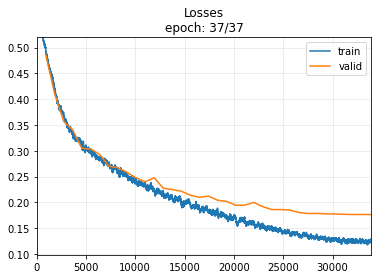

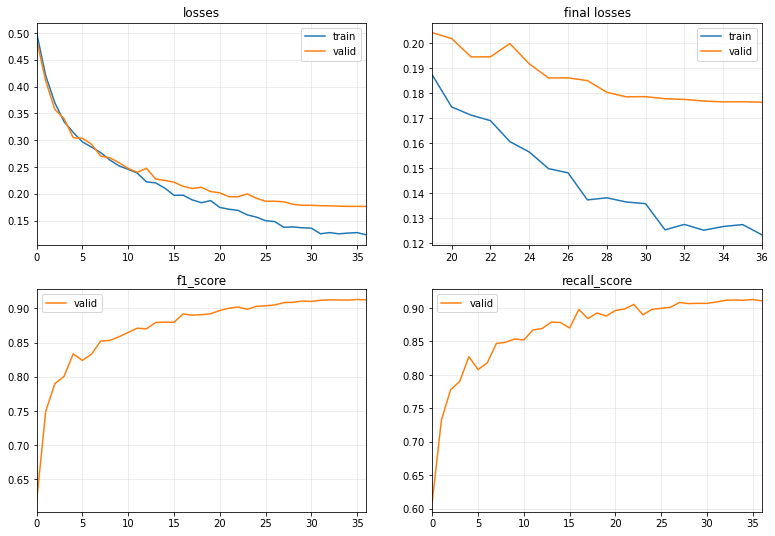

Training time: 316.5991 seconds


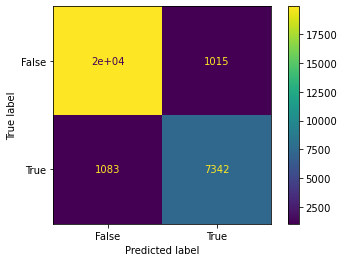

[I 2022-12-05 07:43:40,515] Trial 44 finished with value: 0.8749851030866403 and parameters: {'learning_rate': 0.00031653929654549645, 'batch_size': 256, 'pred_val': 99, 'num_epochs': 37, 'weight_decay': 0.00031187114912579274, 'normalization': True, 'window_length': 12}. Best is trial 11 with value: 0.8933866185380946.


0.8749851030866403


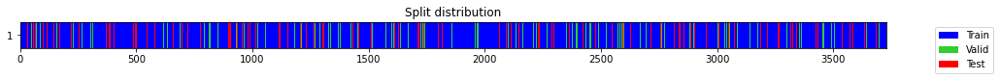

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.642390,0.628797,0.424185,0.500913,00:01
1,0.632306,0.605185,0.416275,0.500000,00:00
2,0.616665,0.578524,0.416275,0.500000,00:00
3,0.597774,0.552687,0.416275,0.500000,00:00
4,0.577821,0.529724,0.416275,0.500000,00:00
5,0.560144,0.513155,0.435931,0.509346,00:00
6,0.542713,0.494411,0.521574,0.552315,00:00
7,0.526605,0.479371,0.575622,0.585026,00:00
8,0.510737,0.463466,0.626573,0.618649,00:00
9,0.495046,0.449219,0.667688,0.650341,00:00


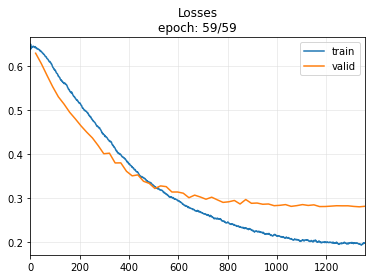

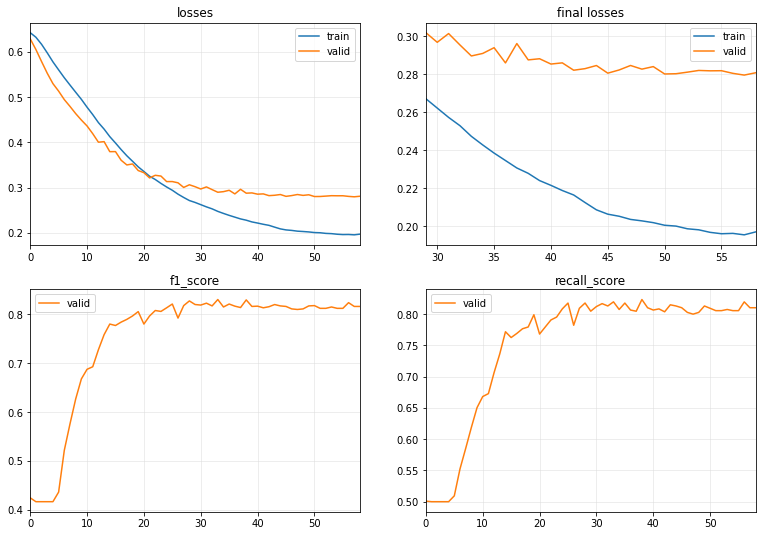

Training time: 66.9877 seconds


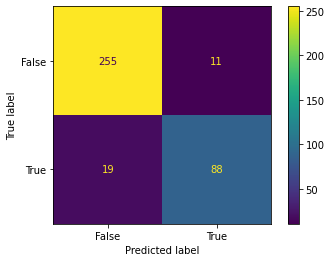

[I 2022-12-05 07:44:50,125] Trial 45 finished with value: 0.8543689320388348 and parameters: {'learning_rate': 0.00014510894545362099, 'batch_size': 128, 'pred_val': 197, 'num_epochs': 59, 'weight_decay': 6.327394379152291e-05, 'normalization': True, 'window_length': 945}. Best is trial 11 with value: 0.8933866185380946.


0.8543689320388348


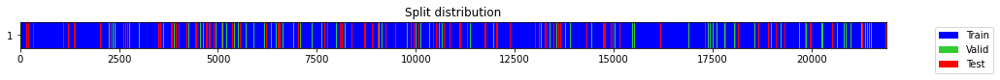

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.658801,0.624623,0.600111,0.594552,00:01
1,0.628697,0.581893,0.663419,0.651126,00:01
2,0.598752,0.543303,0.656724,0.641134,00:01
3,0.567312,0.511141,0.616508,0.610751,00:01
4,0.537390,0.483703,0.607256,0.604226,00:01
5,0.509769,0.460393,0.627975,0.619024,00:01
6,0.484871,0.435244,0.693516,0.672789,00:01
7,0.460178,0.406737,0.752635,0.733234,00:01
8,0.433776,0.379625,0.792896,0.779229,00:01
9,0.406421,0.358131,0.793149,0.778442,00:01


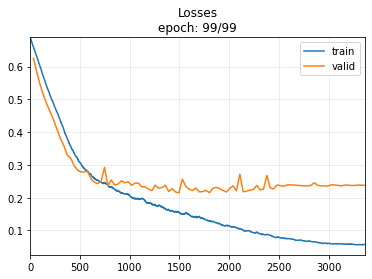

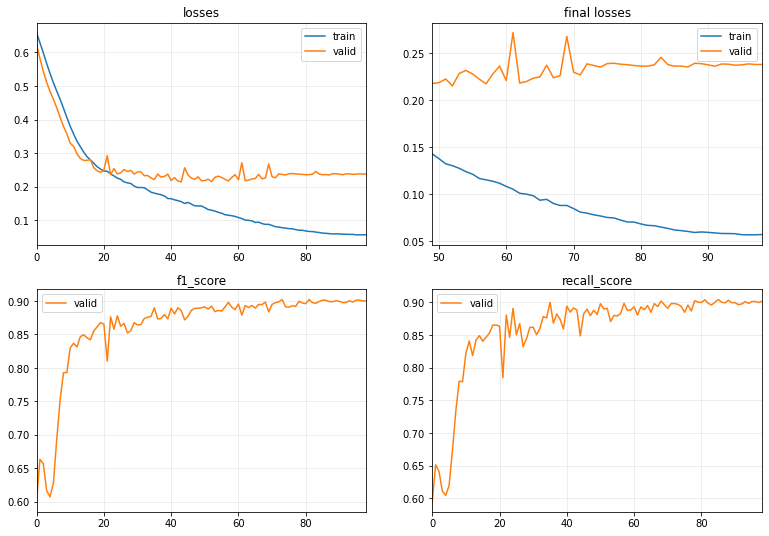

Training time: 133.3643 seconds


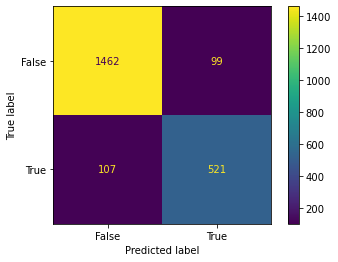

[I 2022-12-05 07:47:06,486] Trial 46 finished with value: 0.8349358974358975 and parameters: {'learning_rate': 0.0004921552600852937, 'batch_size': 512, 'pred_val': 295, 'num_epochs': 99, 'weight_decay': 1.318647810971999e-05, 'normalization': True, 'window_length': 161}. Best is trial 11 with value: 0.8933866185380946.


0.8349358974358975


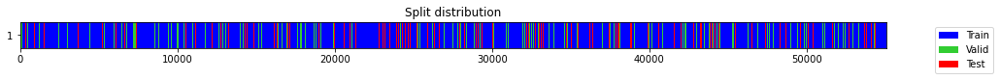

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.593402,0.552669,0.665978,0.653919,00:01
1,0.529831,0.492300,0.672386,0.654660,00:01
2,0.473330,0.441162,0.721376,0.701568,00:01
3,0.420931,0.389269,0.778366,0.770520,00:01
4,0.373930,0.355131,0.795021,0.788068,00:01
5,0.335980,0.321528,0.809196,0.794729,00:01
6,0.314840,0.316007,0.820927,0.812923,00:01
7,0.297804,0.301327,0.838397,0.843494,00:01
8,0.287180,0.293317,0.839420,0.832751,00:01
9,0.276999,0.295317,0.850939,0.859193,00:01


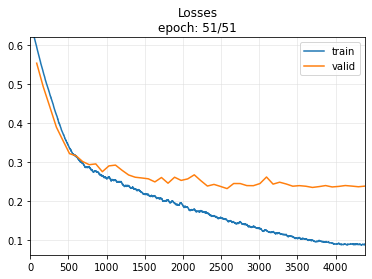

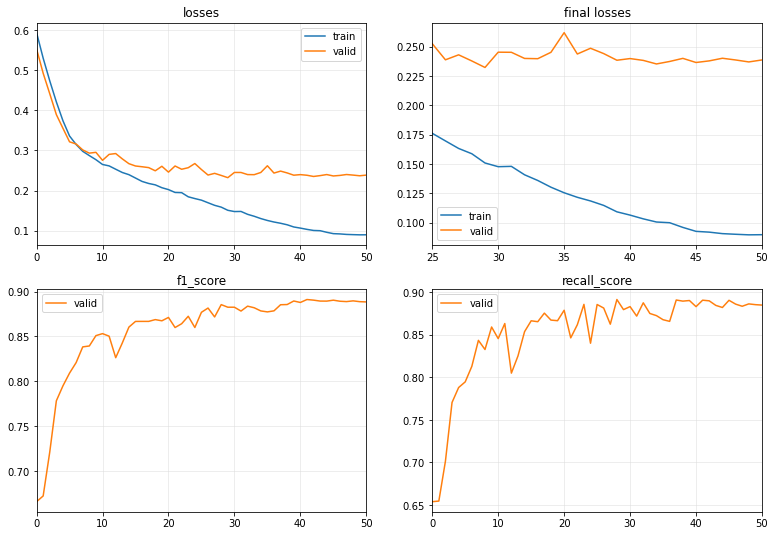

Training time: 89.0997 seconds


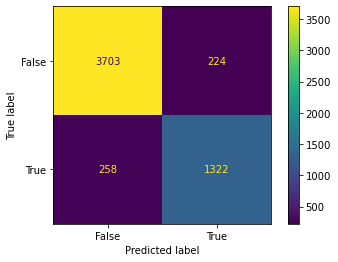

[I 2022-12-05 07:48:39,460] Trial 47 finished with value: 0.8458093410108766 and parameters: {'learning_rate': 0.0007096574339402991, 'batch_size': 512, 'pred_val': 246, 'num_epochs': 51, 'weight_decay': 0.0010311721535076986, 'normalization': True, 'window_length': 64}. Best is trial 11 with value: 0.8933866185380946.


0.8458093410108766


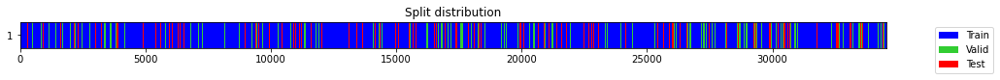

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.629393,0.613163,0.630809,0.665827,00:03
1,0.529809,0.521625,0.631750,0.621352,00:03
2,0.485502,0.480519,0.640532,0.628328,00:03
3,0.455539,0.443235,0.719853,0.702198,00:03
4,0.418309,0.407825,0.752048,0.739589,00:03
5,0.382006,0.377193,0.774781,0.762716,00:03
6,0.354090,0.349153,0.787994,0.777150,00:03
7,0.344019,0.337694,0.798812,0.789062,00:03
8,0.328573,0.330112,0.818500,0.821593,00:03
9,0.315682,0.324899,0.822145,0.828240,00:03


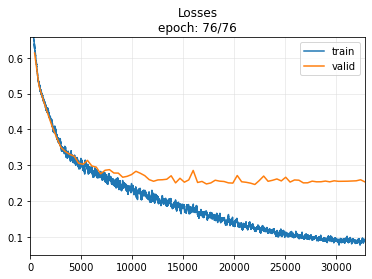

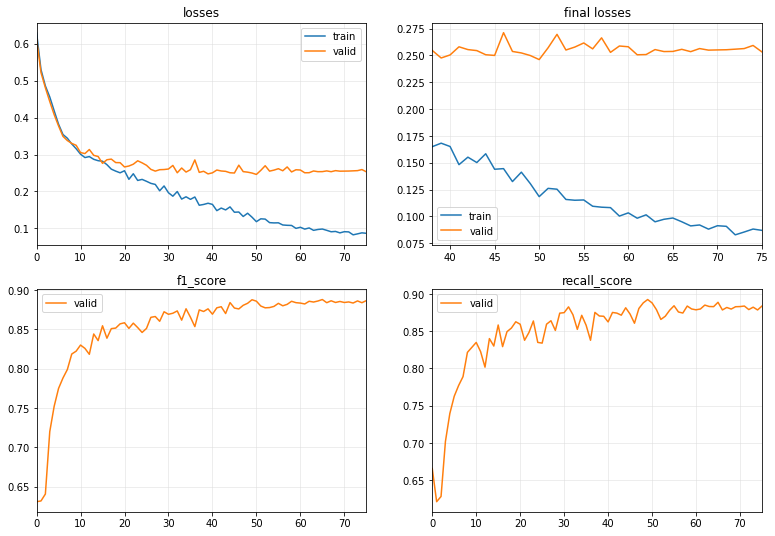

Training time: 331.3585 seconds


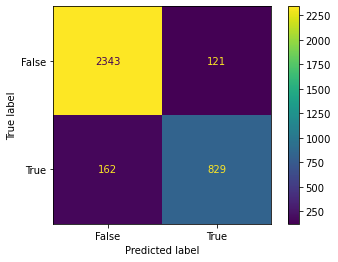

[I 2022-12-05 07:54:14,171] Trial 48 finished with value: 0.8541988665636271 and parameters: {'learning_rate': 0.00021004527585777267, 'batch_size': 64, 'pred_val': 50, 'num_epochs': 76, 'weight_decay': 0.0018156129693129301, 'normalization': True, 'window_length': 102}. Best is trial 11 with value: 0.8933866185380946.


0.8541988665636271


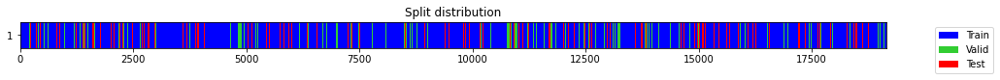

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.642555,0.600614,0.623635,0.626762,00:01
1,0.596273,0.545227,0.654559,0.642030,00:01
2,0.548719,0.496243,0.639378,0.627392,00:01
3,0.507408,0.461865,0.628445,0.619034,00:01
4,0.475433,0.430341,0.710412,0.689654,00:01
5,0.444837,0.400632,0.763504,0.747166,00:01
6,0.413152,0.364629,0.785537,0.768318,00:01
7,0.382263,0.338063,0.824180,0.815838,00:01
8,0.353513,0.312212,0.826159,0.813498,00:01
9,0.330568,0.298453,0.843471,0.836437,00:01


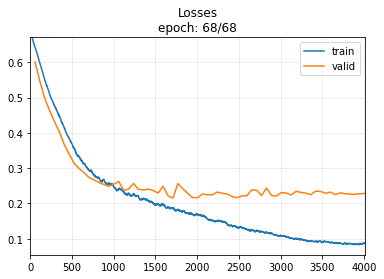

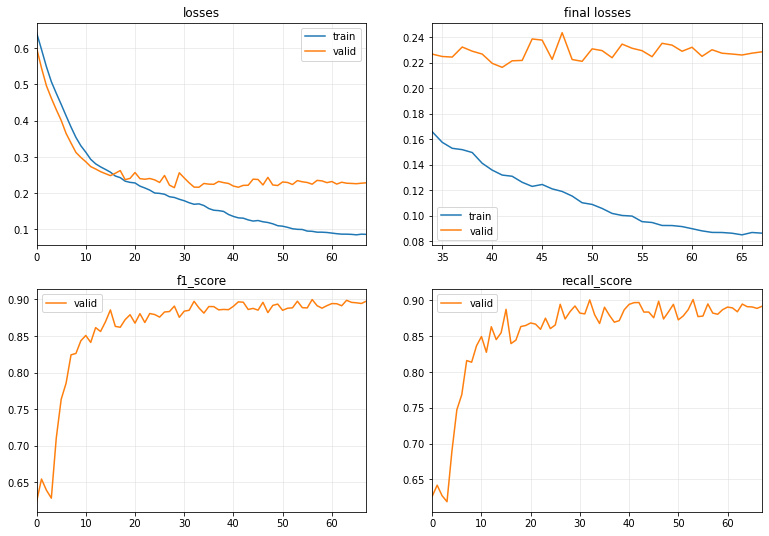

Training time: 95.9182 seconds


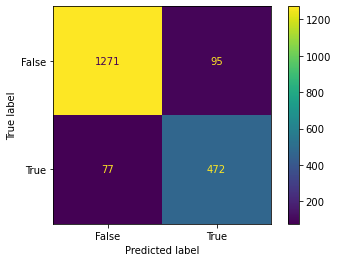

[I 2022-12-05 07:55:51,600] Trial 49 finished with value: 0.8458781362007168 and parameters: {'learning_rate': 0.0003848808111604646, 'batch_size': 256, 'pred_val': 442, 'num_epochs': 68, 'weight_decay': 8.197270356873396e-05, 'normalization': False, 'window_length': 184}. Best is trial 11 with value: 0.8933866185380946.


0.8458781362007168


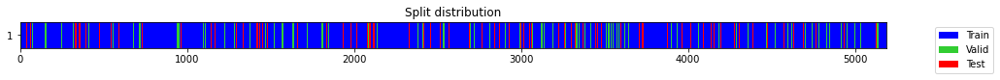

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.779249,0.763799,0.226733,0.495991,00:01
1,0.756863,0.739620,0.266415,0.479394,00:01
2,0.732229,0.710114,0.489281,0.589779,00:01
3,0.700498,0.676424,0.597297,0.650862,00:01
4,0.663752,0.635482,0.599111,0.614357,00:01
5,0.626183,0.599104,0.617423,0.611545,00:01
6,0.587276,0.561714,0.603065,0.597696,00:01
7,0.553804,0.536187,0.584881,0.587112,00:01
8,0.530127,0.516949,0.584626,0.587811,00:01
9,0.515037,0.501993,0.587934,0.589815,00:01


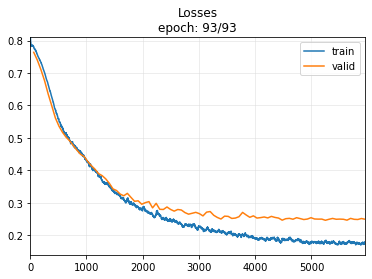

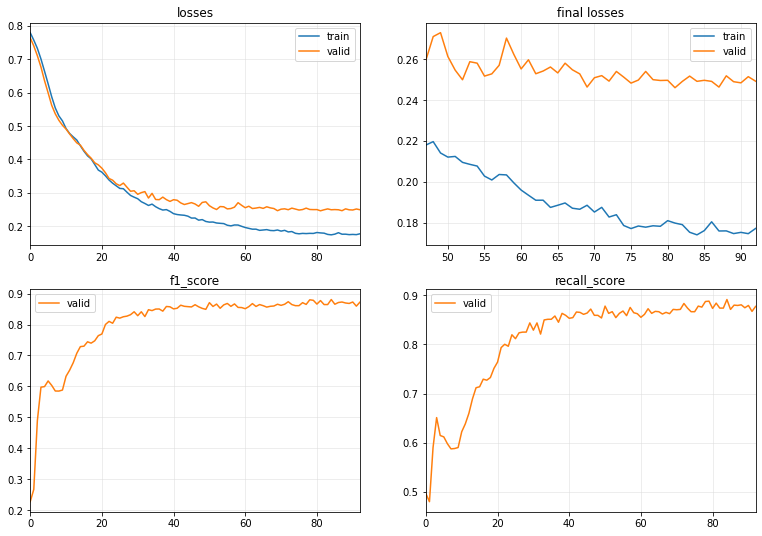

Training time: 131.5398 seconds


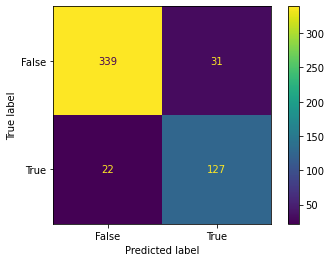

[I 2022-12-05 07:58:05,781] Trial 50 finished with value: 0.8273615635179153 and parameters: {'learning_rate': 5.958420566949576e-05, 'batch_size': 64, 'pred_val': 148, 'num_epochs': 93, 'weight_decay': 0.003403556560150947, 'normalization': True, 'window_length': 679}. Best is trial 11 with value: 0.8933866185380946.


0.8273615635179153


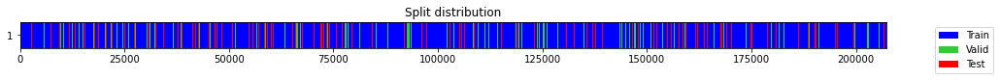

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.497749,0.486451,0.659955,0.644425,00:05
1,0.395399,0.389415,0.769482,0.756641,00:05
2,0.352130,0.354070,0.806220,0.806728,00:05
3,0.324632,0.313609,0.832195,0.829221,00:05
4,0.307640,0.300659,0.832574,0.821154,00:05
5,0.281696,0.286769,0.839245,0.829492,00:05
6,0.267498,0.267931,0.857229,0.855884,00:05
7,0.258356,0.267232,0.854056,0.848070,00:05
8,0.249504,0.258812,0.866990,0.872726,00:05
9,0.237330,0.244092,0.871345,0.867053,00:05


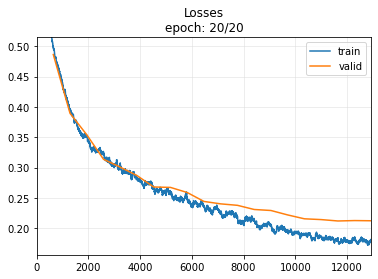

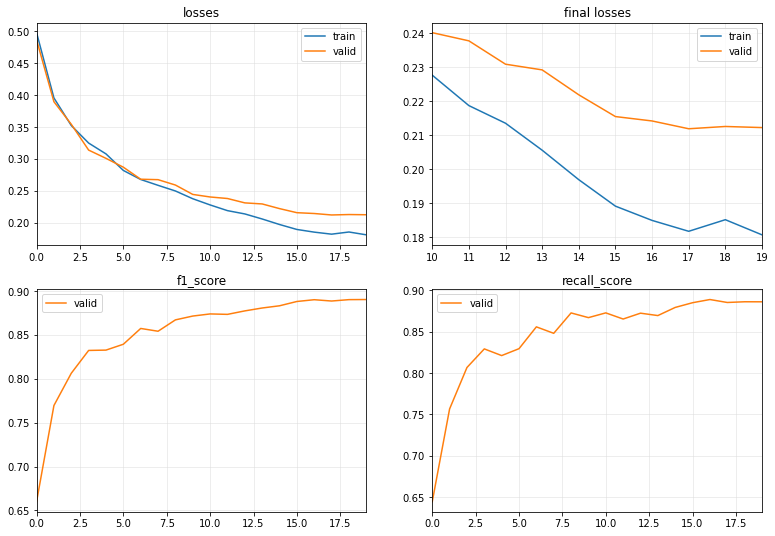

Training time: 112.2607 seconds


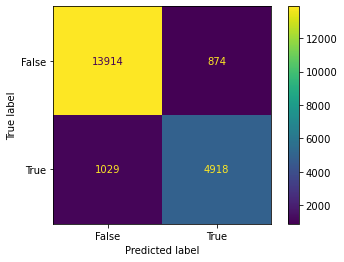

[I 2022-12-05 08:00:27,532] Trial 51 finished with value: 0.8378907913791636 and parameters: {'learning_rate': 0.0003109335778905741, 'batch_size': 256, 'pred_val': 99, 'num_epochs': 20, 'weight_decay': 0.0003277647120976834, 'normalization': True, 'window_length': 17}. Best is trial 11 with value: 0.8933866185380946.


0.8378907913791636


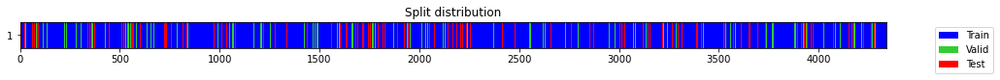

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.653143,0.617760,0.470768,0.519055,00:01
1,0.637096,0.591487,0.441005,0.512000,00:00
2,0.613992,0.546195,0.457161,0.520000,00:00
3,0.587367,0.518137,0.470495,0.524764,00:00
4,0.561890,0.505791,0.478086,0.528764,00:00
5,0.539183,0.482335,0.518592,0.549528,00:00
6,0.519869,0.454325,0.620316,0.612492,00:00
7,0.499677,0.432264,0.709149,0.691547,00:00
8,0.478863,0.412693,0.758403,0.745074,00:00
9,0.458770,0.398237,0.772668,0.757929,00:00


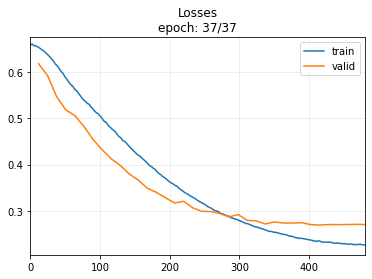

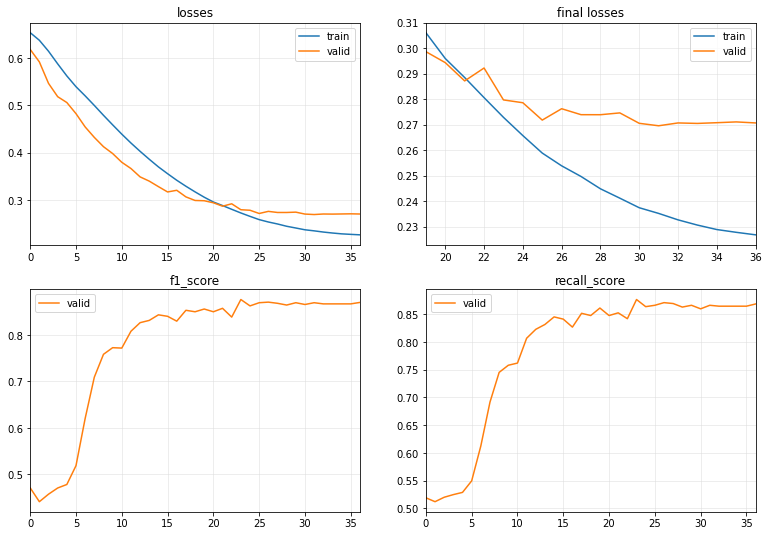

Training time: 37.8419 seconds


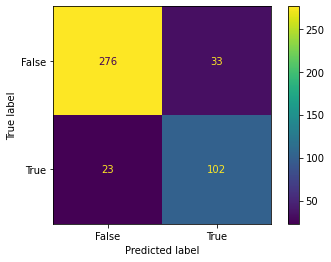

[I 2022-12-05 08:01:08,044] Trial 52 finished with value: 0.7846153846153846 and parameters: {'learning_rate': 0.0002528969877371537, 'batch_size': 256, 'pred_val': 148, 'num_epochs': 37, 'weight_decay': 2.20509714421312e-05, 'normalization': True, 'window_length': 812}. Best is trial 11 with value: 0.8933866185380946.


0.7846153846153846


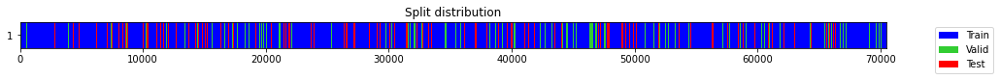

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.690474,0.675687,0.545632,0.618290,00:02
1,0.621882,0.602460,0.646101,0.674512,00:02
2,0.544390,0.525259,0.696900,0.683544,00:02
3,0.481556,0.467292,0.682307,0.663502,00:02
4,0.433280,0.425224,0.741086,0.721909,00:02
5,0.398916,0.386213,0.772068,0.755773,00:02
6,0.366497,0.357579,0.795865,0.785864,00:02
7,0.348718,0.335707,0.803158,0.791621,00:02
8,0.329441,0.323392,0.810165,0.796099,00:02
9,0.324079,0.317775,0.824671,0.820480,00:02


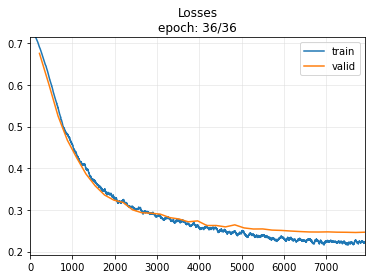

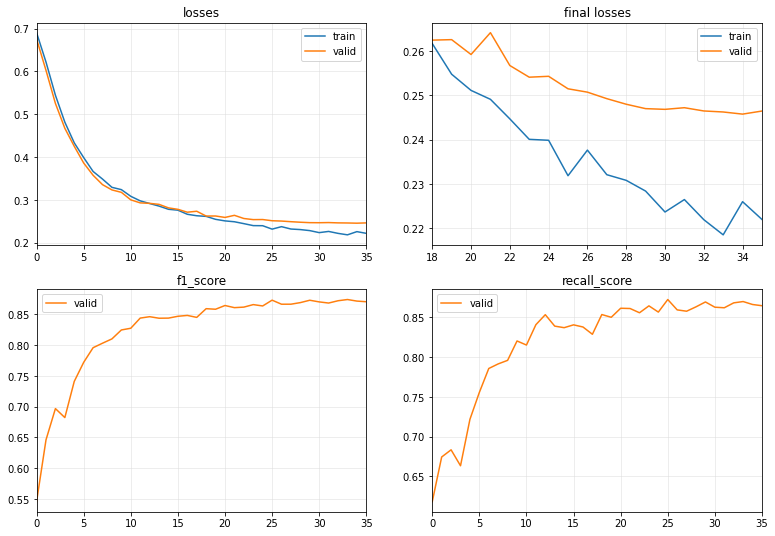

Training time: 89.3421 seconds


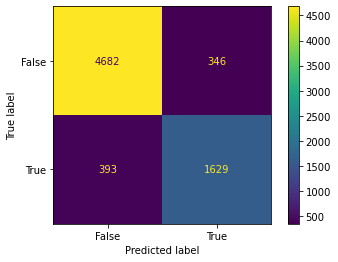

[I 2022-12-05 08:02:41,884] Trial 53 finished with value: 0.8151113335001251 and parameters: {'learning_rate': 9.57712931000172e-05, 'batch_size': 256, 'pred_val': 99, 'num_epochs': 36, 'weight_decay': 0.0004159828886435367, 'normalization': True, 'window_length': 50}. Best is trial 11 with value: 0.8933866185380946.


0.8151113335001251


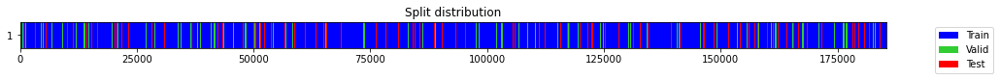

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.538837,0.529477,0.668803,0.656855,00:04
1,0.459804,0.453105,0.695393,0.676925,00:04
2,0.402673,0.397709,0.752976,0.738843,00:04
3,0.358794,0.359663,0.793072,0.787350,00:04
4,0.332724,0.328749,0.812747,0.803265,00:04
5,0.313258,0.332298,0.810764,0.806835,00:04
6,0.299959,0.298220,0.832692,0.822336,00:04
7,0.286766,0.289709,0.836840,0.824272,00:04
8,0.278285,0.286309,0.841296,0.830825,00:04
9,0.262713,0.294201,0.827775,0.809057,00:04


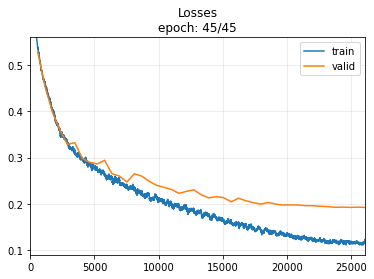

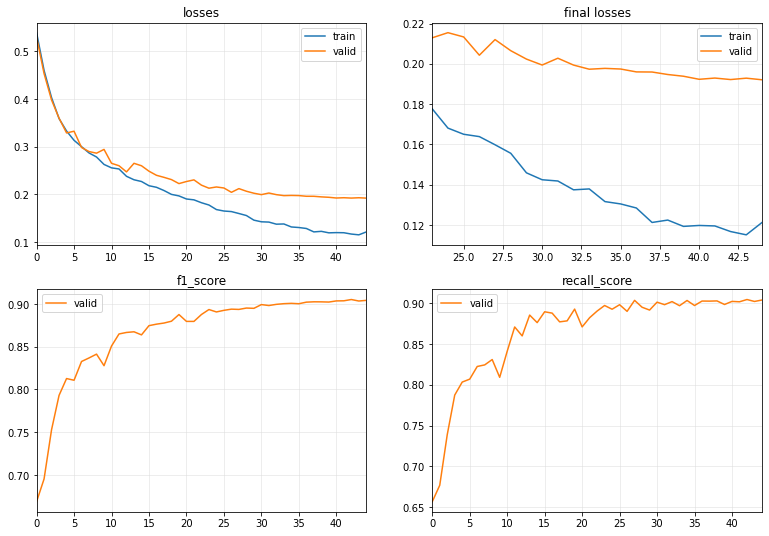

Training time: 242.2661 seconds


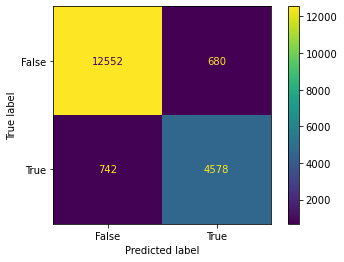

[I 2022-12-05 08:07:07,080] Trial 54 finished with value: 0.8655700510493476 and parameters: {'learning_rate': 0.0003146478056455488, 'batch_size': 256, 'pred_val': 197, 'num_epochs': 45, 'weight_decay': 0.00011868979584398578, 'normalization': True, 'window_length': 19}. Best is trial 11 with value: 0.8933866185380946.


0.8655700510493476


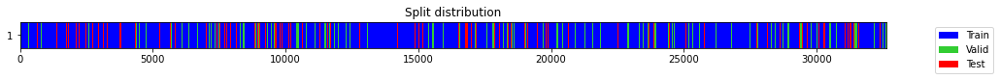

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.629762,0.603440,0.632040,0.625424,00:01
1,0.591019,0.560520,0.667511,0.654419,00:01
2,0.546945,0.516334,0.651258,0.636940,00:01
3,0.505303,0.478395,0.673885,0.655741,00:01
4,0.467405,0.444454,0.704421,0.683286,00:01
5,0.435222,0.410134,0.752945,0.733139,00:01
6,0.399581,0.377433,0.774714,0.758437,00:01
7,0.367752,0.350510,0.790946,0.774161,00:01
8,0.344966,0.329215,0.813506,0.804574,00:01
9,0.326130,0.319736,0.822668,0.817063,00:01


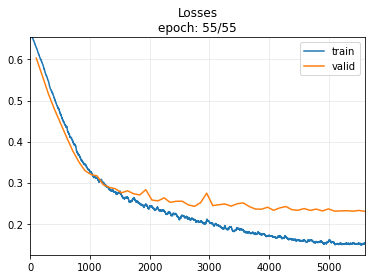

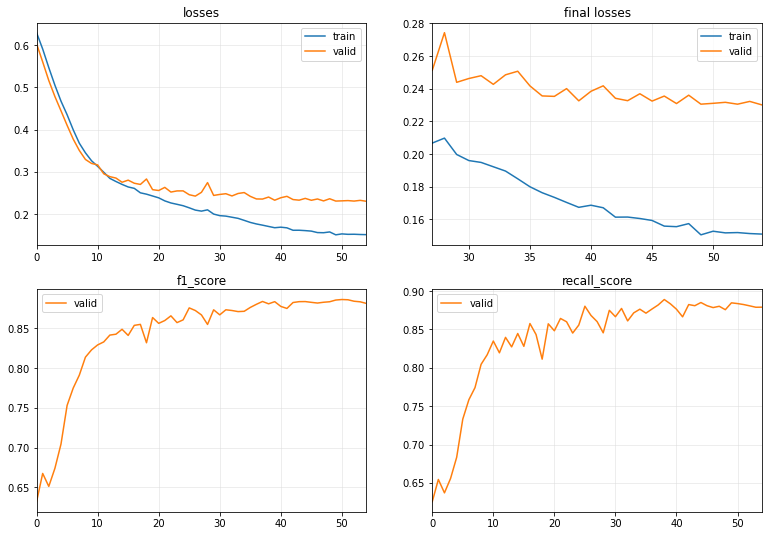

Training time: 92.9578 seconds


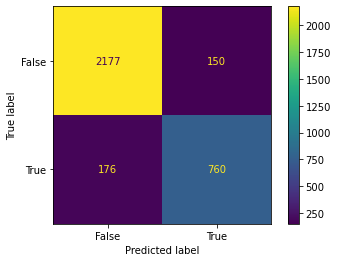

[I 2022-12-05 08:08:43,281] Trial 55 finished with value: 0.8234019501625136 and parameters: {'learning_rate': 0.0001845655645372235, 'batch_size': 256, 'pred_val': 99, 'num_epochs': 55, 'weight_decay': 0.000640941944157384, 'normalization': True, 'window_length': 108}. Best is trial 11 with value: 0.8933866185380946.


0.8234019501625136


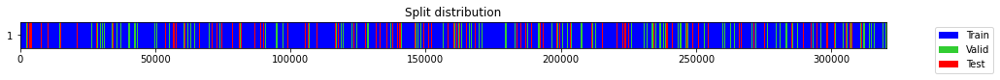

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.420822,0.413435,0.748611,0.733056,00:29
1,0.380532,0.367235,0.784372,0.774863,00:29
2,0.351986,0.336533,0.801959,0.791086,00:29
3,0.341407,0.319111,0.819880,0.811331,00:29
4,0.322645,0.306269,0.832762,0.826826,00:29
5,0.309836,0.291911,0.836710,0.832090,00:29
6,0.290465,0.281100,0.852154,0.857345,00:29
7,0.269825,0.281202,0.837941,0.821469,00:29
8,0.275913,0.255340,0.863090,0.858287,00:29
9,0.267688,0.249228,0.866409,0.860842,00:29


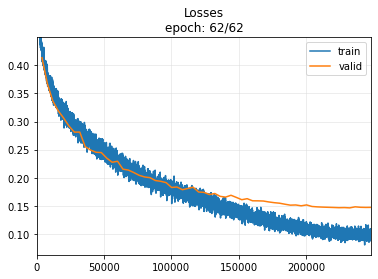

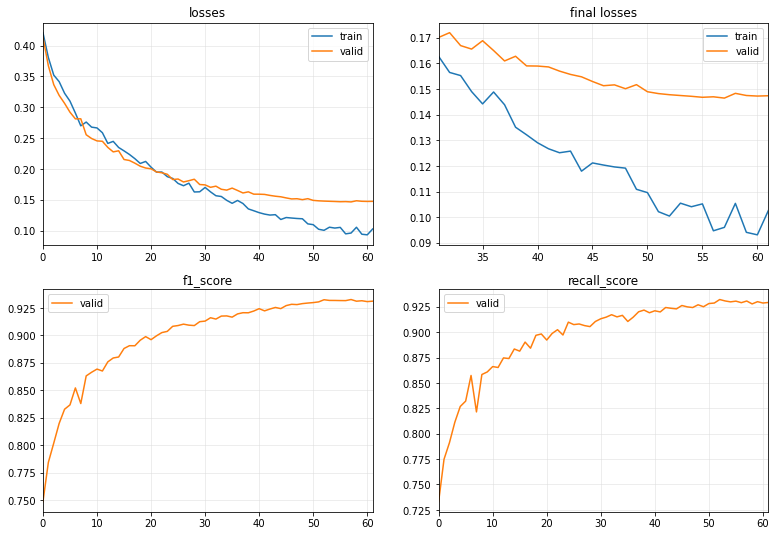

Training time: 2289.1464 seconds


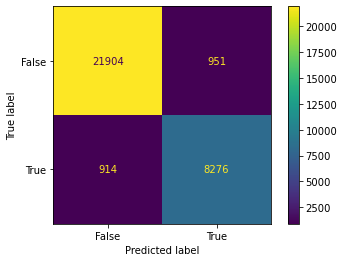

[I 2022-12-05 08:48:09,047] Trial 56 finished with value: 0.8987348645273389 and parameters: {'learning_rate': 0.0005561849542053388, 'batch_size': 64, 'pred_val': 50, 'num_epochs': 62, 'weight_decay': 0.0002491961714966168, 'normalization': True, 'window_length': 11}. Best is trial 56 with value: 0.8987348645273389.


0.8987348645273389


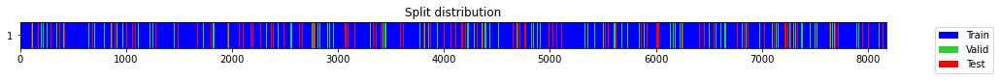

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.579060,0.520756,0.503644,0.542496,00:01
1,0.511865,0.472531,0.583669,0.588861,00:01
2,0.473547,0.433040,0.736940,0.719851,00:01
3,0.426338,0.395732,0.752788,0.739608,00:01
4,0.389605,0.363593,0.791227,0.788987,00:01
5,0.349039,0.333178,0.802445,0.788509,00:01
6,0.319916,0.328337,0.828907,0.834907,00:01
7,0.305465,0.298660,0.838303,0.839177,00:01
8,0.296428,0.310758,0.829655,0.825434,00:01
9,0.272837,0.358991,0.788531,0.777368,00:01


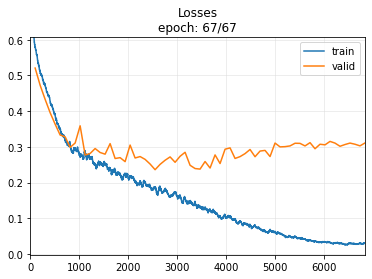

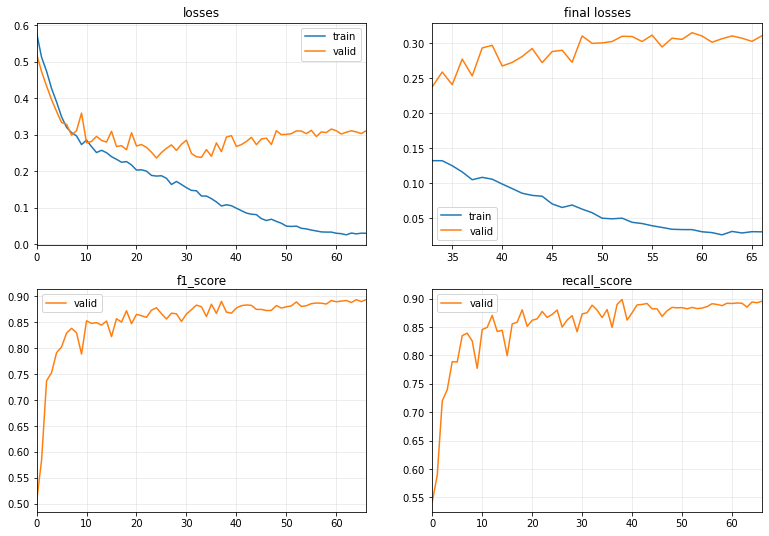

Training time: 108.667 seconds


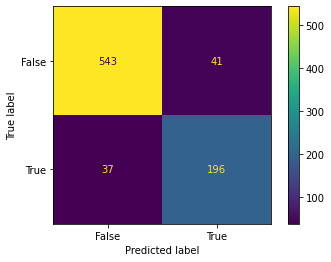

[I 2022-12-05 08:50:00,465] Trial 57 finished with value: 0.8340425531914895 and parameters: {'learning_rate': 0.0007572668483841128, 'batch_size': 64, 'pred_val': 344, 'num_epochs': 67, 'weight_decay': 3.903300197895863e-05, 'normalization': True, 'window_length': 431}. Best is trial 56 with value: 0.8987348645273389.


0.8340425531914895


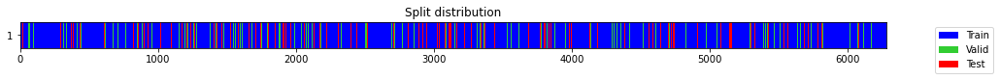

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.579063,0.539245,0.434547,0.508380,00:01
1,0.528352,0.506188,0.508387,0.542484,00:01
2,0.492181,0.478829,0.634809,0.623546,00:01
3,0.453663,0.443454,0.690633,0.672749,00:01
4,0.415722,0.406397,0.797076,0.794596,00:01
5,0.379652,0.372145,0.740560,0.728105,00:01
6,0.338547,0.338842,0.829794,0.833136,00:01
7,0.314580,0.306412,0.834729,0.840403,00:01
8,0.296720,0.304021,0.828690,0.833702,00:01
9,0.281361,0.307233,0.817405,0.815810,00:01


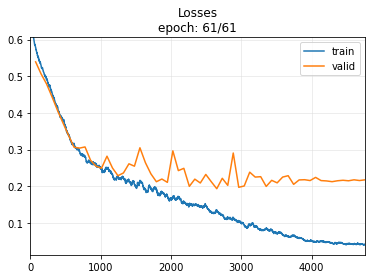

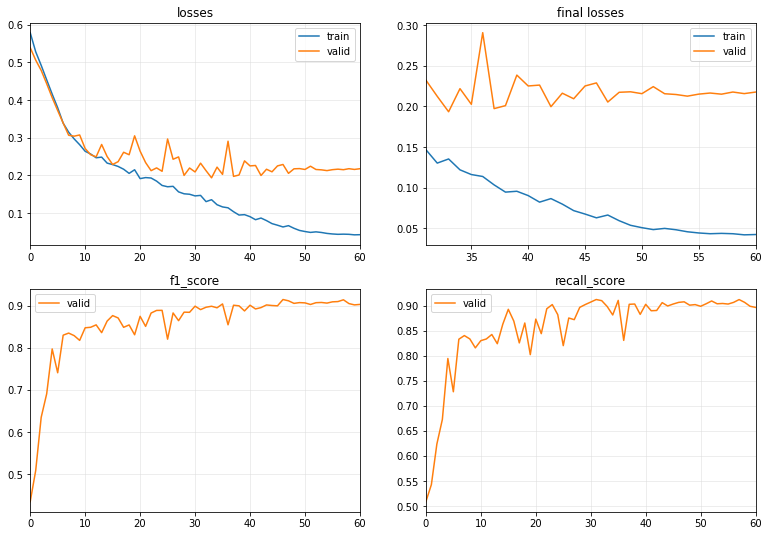

Training time: 88.7491 seconds


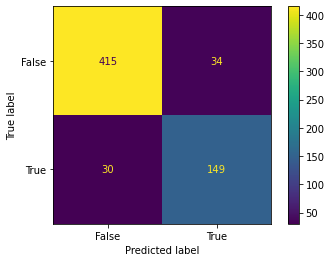

[I 2022-12-05 08:51:31,886] Trial 58 finished with value: 0.8232044198895027 and parameters: {'learning_rate': 0.0005718421726396083, 'batch_size': 64, 'pred_val': 50, 'num_epochs': 61, 'weight_decay': 0.005360831839354721, 'normalization': True, 'window_length': 561}. Best is trial 56 with value: 0.8987348645273389.


0.8232044198895027


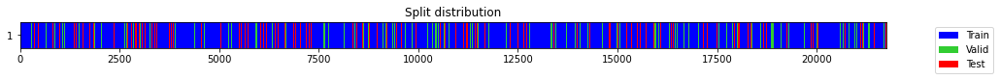

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.555596,0.538369,0.637417,0.626066,00:02
1,0.491720,0.482815,0.641387,0.629023,00:02
2,0.447117,0.435472,0.731365,0.714971,00:02
3,0.396391,0.386513,0.776225,0.766382,00:02
4,0.351509,0.350779,0.797299,0.795035,00:02
5,0.322868,0.336195,0.788173,0.774285,00:02
6,0.312221,0.316755,0.825724,0.833155,00:02
7,0.292790,0.308499,0.817610,0.806032,00:02
8,0.287710,0.292942,0.826019,0.812627,00:02
9,0.280392,0.346659,0.767567,0.739481,00:02


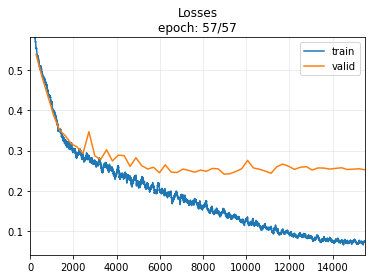

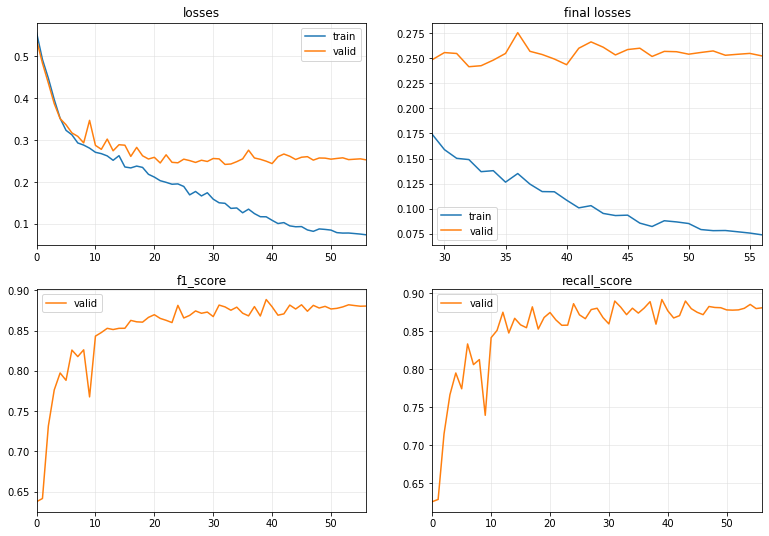

Training time: 159.9985 seconds


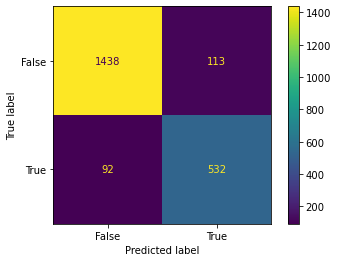

[I 2022-12-05 08:54:14,874] Trial 59 finished with value: 0.838455476753349 and parameters: {'learning_rate': 0.00043766558822074897, 'batch_size': 64, 'pred_val': 393, 'num_epochs': 57, 'weight_decay': 5.457137679524817e-05, 'normalization': True, 'window_length': 162}. Best is trial 56 with value: 0.8987348645273389.


0.838455476753349


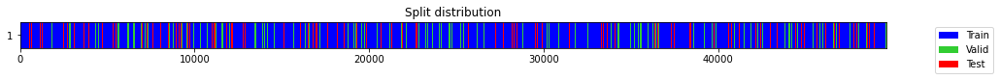

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.488207,0.473101,0.638723,0.626895,00:04
1,0.423097,0.418552,0.725370,0.706113,00:04
2,0.394132,0.382033,0.767221,0.754375,00:04
3,0.361216,0.352288,0.795192,0.786186,00:04
4,0.336906,0.342676,0.799657,0.790686,00:04
5,0.336557,0.336316,0.795115,0.780265,00:04
6,0.324909,0.337457,0.824216,0.838389,00:04
7,0.317007,0.316415,0.821608,0.817856,00:04
8,0.317394,0.325480,0.815671,0.816202,00:04
9,0.307727,0.307197,0.828720,0.818961,00:04


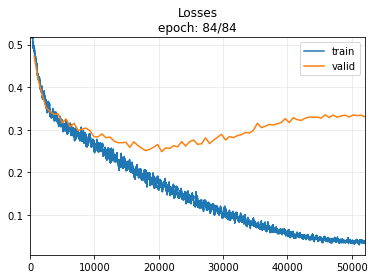

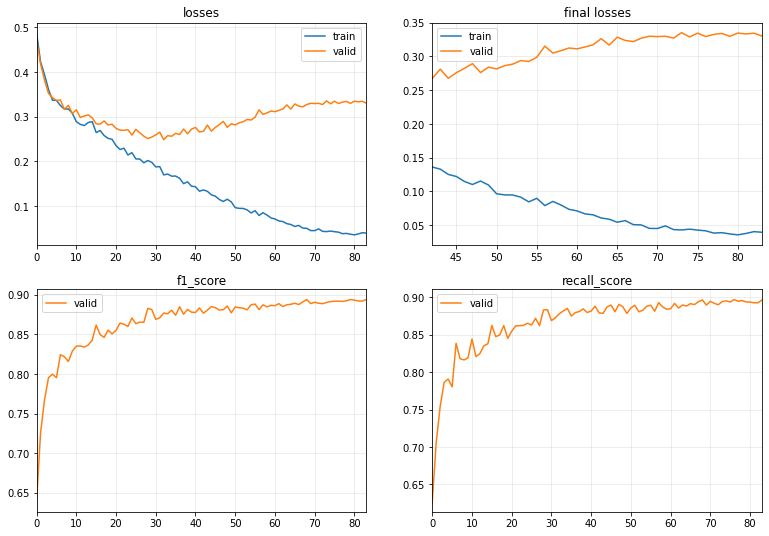

Training time: 525.424 seconds


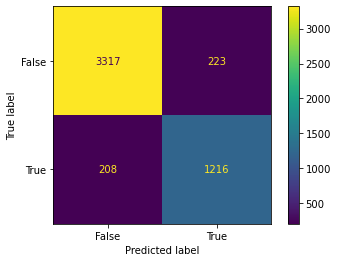

[I 2022-12-05 09:03:04,433] Trial 60 finished with value: 0.8494586098498078 and parameters: {'learning_rate': 0.0008121800216976998, 'batch_size': 64, 'pred_val': 1, 'num_epochs': 84, 'weight_decay': 2.8445199155771182e-05, 'normalization': True, 'window_length': 71}. Best is trial 56 with value: 0.8987348645273389.


0.8494586098498078


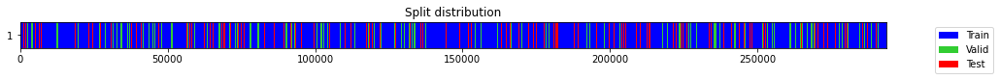

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.404944,0.403154,0.755015,0.742328,00:27
1,0.363010,0.352121,0.799244,0.793325,00:27
2,0.334190,0.334174,0.804996,0.797546,00:27
3,0.316252,0.300201,0.827811,0.817429,00:27
4,0.301803,0.286356,0.846902,0.853850,00:27
5,0.284362,0.282133,0.844358,0.838208,00:27
6,0.266661,0.272222,0.858483,0.866304,00:27
7,0.260258,0.245112,0.869817,0.863833,00:27
8,0.236198,0.236984,0.875812,0.875585,00:27
9,0.244957,0.226792,0.878904,0.874367,00:27


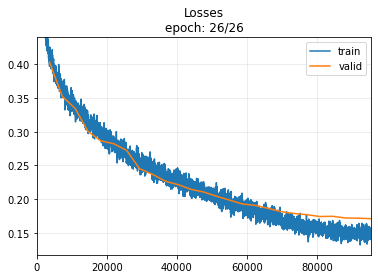

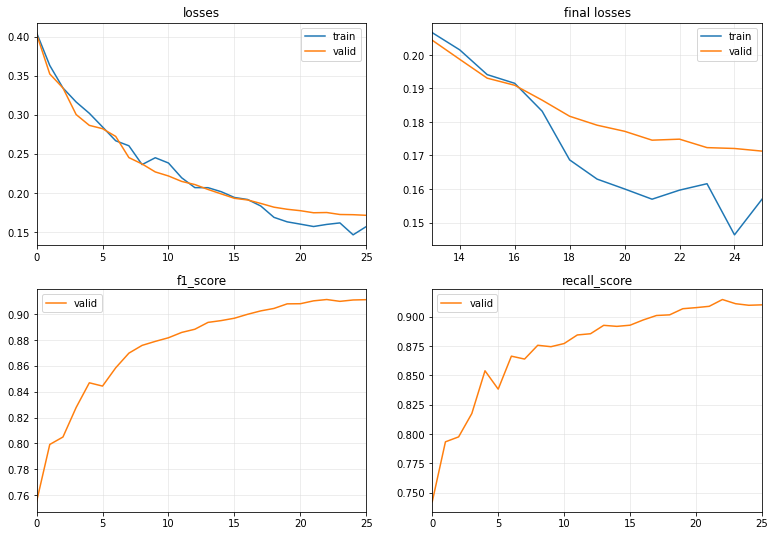

Training time: 782.9805 seconds


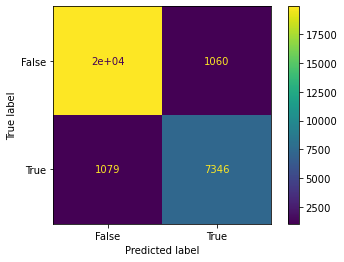

[I 2022-12-05 09:17:11,596] Trial 61 finished with value: 0.8729130770601866 and parameters: {'learning_rate': 0.0005036462575295105, 'batch_size': 64, 'pred_val': 50, 'num_epochs': 26, 'weight_decay': 0.00022606837215335192, 'normalization': True, 'window_length': 12}. Best is trial 56 with value: 0.8987348645273389.


0.8729130770601866


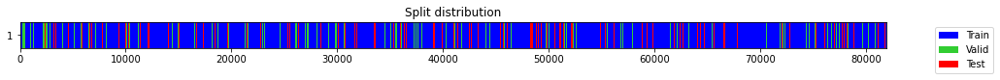

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.524044,0.515014,0.600376,0.598236,00:04
1,0.473391,0.467602,0.659428,0.643441,00:04
2,0.436780,0.425870,0.723526,0.703724,00:04
3,0.395511,0.388250,0.767121,0.754367,00:04
4,0.368042,0.358271,0.784304,0.770176,00:04
5,0.340764,0.336021,0.807208,0.795068,00:04
6,0.323920,0.321316,0.815984,0.809290,00:04
7,0.315167,0.315412,0.826384,0.822430,00:04
8,0.307547,0.298495,0.827149,0.820534,00:03
9,0.306714,0.318052,0.823246,0.834706,00:04


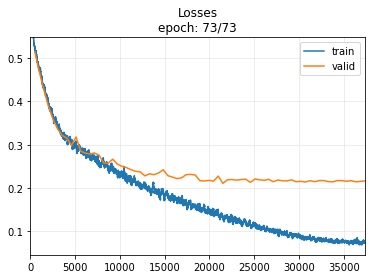

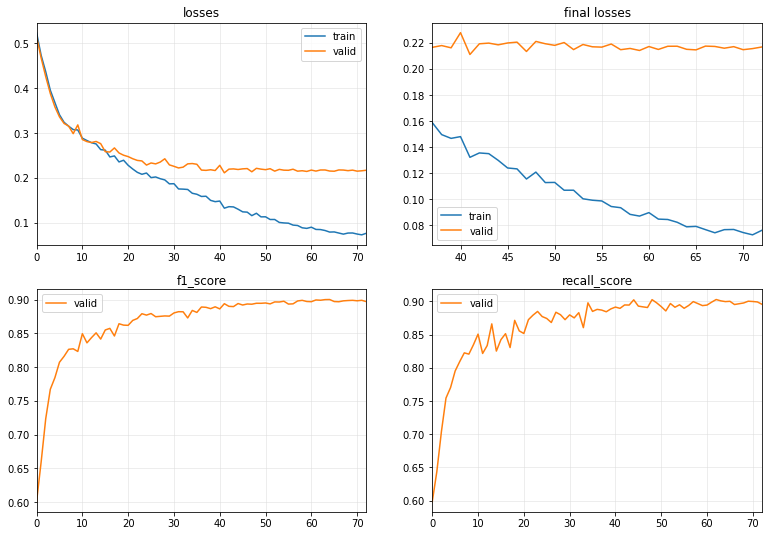

Training time: 375.1493 seconds


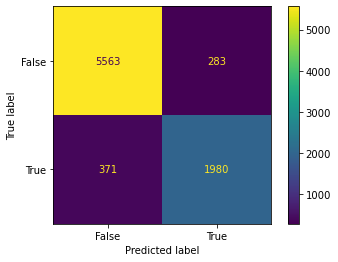

[I 2022-12-05 09:23:32,156] Trial 62 finished with value: 0.8582574772431729 and parameters: {'learning_rate': 0.00036253135329744667, 'batch_size': 128, 'pred_val': 148, 'num_epochs': 73, 'weight_decay': 0.0002613315245594917, 'normalization': True, 'window_length': 43}. Best is trial 56 with value: 0.8987348645273389.


0.8582574772431729


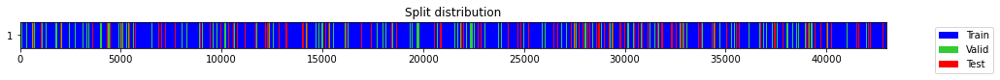

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.599428,0.553040,0.632373,0.622115,00:01
1,0.535945,0.497527,0.657547,0.642325,00:01
2,0.484028,0.455637,0.685943,0.667628,00:01
3,0.439126,0.416656,0.748607,0.735975,00:01
4,0.395251,0.378356,0.782743,0.773157,00:01
5,0.361578,0.349430,0.805532,0.800910,00:01
6,0.331855,0.337724,0.796931,0.779554,00:01
7,0.313328,0.306652,0.824484,0.812178,00:01
8,0.295104,0.305545,0.839363,0.836575,00:01
9,0.284419,0.349980,0.768686,0.739700,00:01


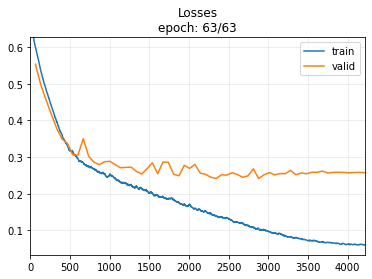

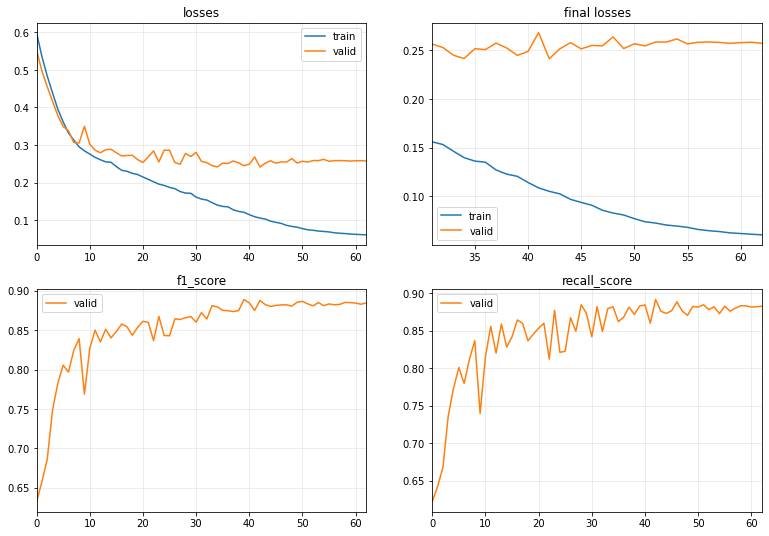

Training time: 104.7014 seconds


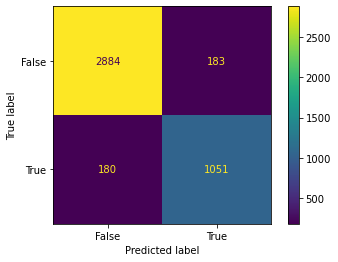

[I 2022-12-05 09:25:20,391] Trial 63 finished with value: 0.852738336713996 and parameters: {'learning_rate': 0.0009075486867499647, 'batch_size': 512, 'pred_val': 99, 'num_epochs': 63, 'weight_decay': 0.00015685542222167571, 'normalization': True, 'window_length': 82}. Best is trial 56 with value: 0.8987348645273389.


0.852738336713996


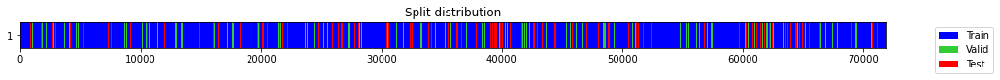

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.518895,0.511712,0.583103,0.586481,00:07
1,0.462153,0.458854,0.671276,0.653669,00:06
2,0.414924,0.407588,0.752277,0.734881,00:06
3,0.376790,0.365956,0.779020,0.764155,00:06
4,0.356767,0.334676,0.805184,0.796948,00:06
5,0.338992,0.320325,0.823739,0.821172,00:06
6,0.322913,0.311412,0.823525,0.823338,00:06
7,0.315723,0.312568,0.821607,0.817447,00:06
8,0.300862,0.294652,0.820845,0.804874,00:06
9,0.280892,0.287661,0.849198,0.851381,00:06


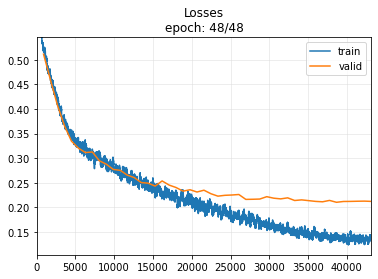

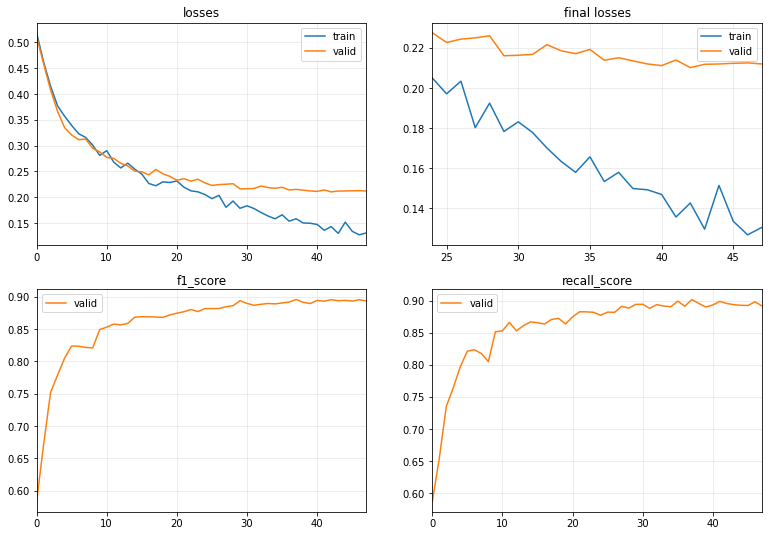

Training time: 392.4871 seconds


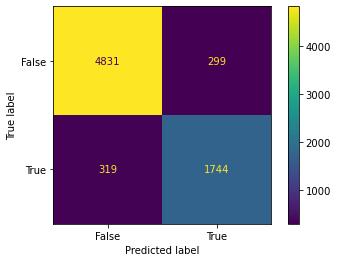

[I 2022-12-05 09:31:57,797] Trial 64 finished with value: 0.8494885533365807 and parameters: {'learning_rate': 0.00022286389201902468, 'batch_size': 64, 'pred_val': 442, 'num_epochs': 48, 'weight_decay': 0.00044569221691868134, 'normalization': True, 'window_length': 49}. Best is trial 56 with value: 0.8987348645273389.


0.8494885533365807


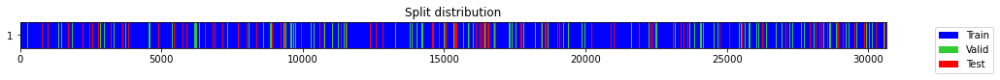

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.618867,0.574736,0.648390,0.640686,00:01
1,0.572041,0.516915,0.626273,0.617170,00:01
2,0.522848,0.472398,0.644100,0.631162,00:01
3,0.476984,0.431411,0.721379,0.702757,00:01
4,0.433685,0.385926,0.772407,0.766599,00:01
5,0.390613,0.343445,0.810930,0.802729,00:01
6,0.352953,0.316292,0.823066,0.817630,00:01
7,0.326861,0.298973,0.828969,0.823102,00:01
8,0.307308,0.309170,0.816513,0.801305,00:01
9,0.292435,0.283431,0.844532,0.837804,00:01


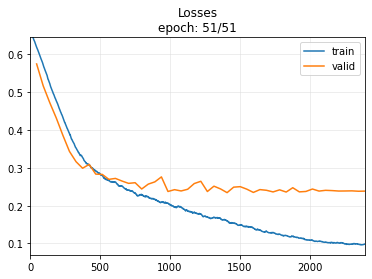

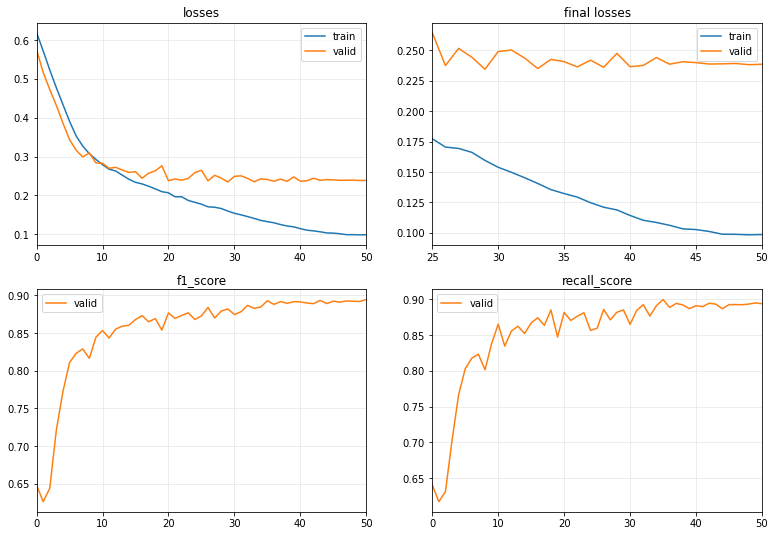

Training time: 74.0458 seconds


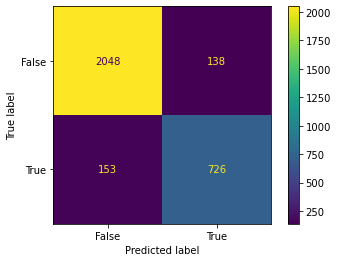

[I 2022-12-05 09:33:15,146] Trial 65 finished with value: 0.8330464716006885 and parameters: {'learning_rate': 0.0006487805159597697, 'batch_size': 512, 'pred_val': 197, 'num_epochs': 51, 'weight_decay': 1.3472468998389914e-05, 'normalization': True, 'window_length': 115}. Best is trial 56 with value: 0.8987348645273389.


0.8330464716006885


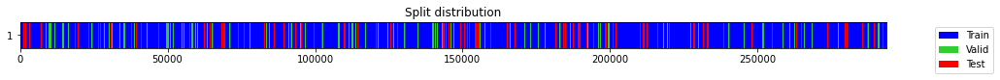

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.434140,0.424275,0.732752,0.715094,00:27
1,0.380431,0.372898,0.774416,0.759882,00:26
2,0.359624,0.344749,0.808500,0.804788,00:26
3,0.343906,0.318307,0.823974,0.821503,00:26
4,0.323440,0.310060,0.821503,0.811967,00:26
5,0.298789,0.294170,0.843718,0.849436,00:26
6,0.291723,0.293090,0.840986,0.846218,00:27
7,0.271053,0.268205,0.856632,0.856139,00:26
8,0.267225,0.263902,0.858234,0.862052,00:27
9,0.255733,0.253878,0.862704,0.857244,00:27


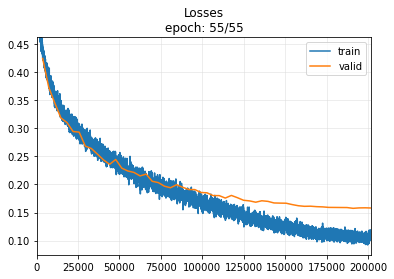

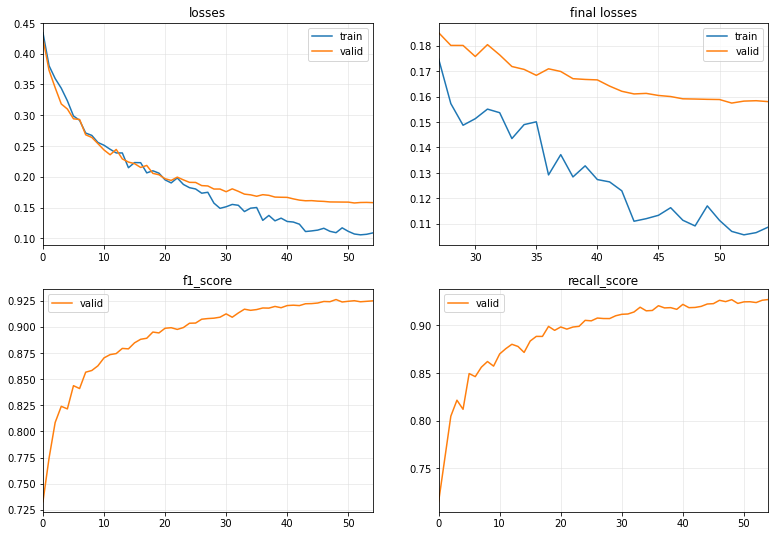

Training time: 1813.6368 seconds


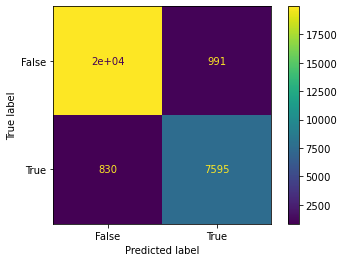

[I 2022-12-05 10:04:33,097] Trial 66 finished with value: 0.8929516195402974 and parameters: {'learning_rate': 0.00043389904166004424, 'batch_size': 64, 'pred_val': 99, 'num_epochs': 55, 'weight_decay': 0.0007295213435757632, 'normalization': True, 'window_length': 12}. Best is trial 56 with value: 0.8987348645273389.


0.8929516195402974


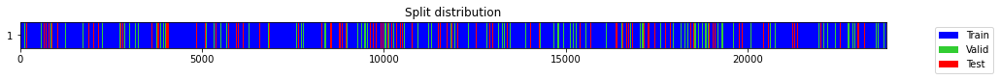

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.551414,0.520101,0.643523,0.630749,00:02
1,0.491641,0.459510,0.663885,0.647030,00:02
2,0.433391,0.409988,0.728174,0.705554,00:02
3,0.400006,0.357465,0.805060,0.791881,00:02
4,0.359764,0.327990,0.815864,0.803745,00:02
5,0.344518,0.323032,0.819587,0.811336,00:02
6,0.316553,0.291649,0.826308,0.816771,00:02
7,0.310905,0.285075,0.837997,0.833154,00:02
8,0.303576,0.326159,0.817876,0.803181,00:02
9,0.292603,0.270022,0.857587,0.855713,00:02


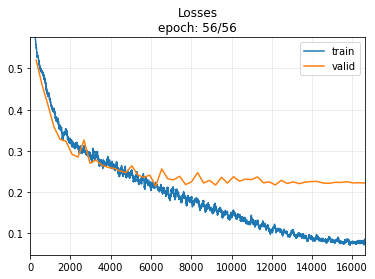

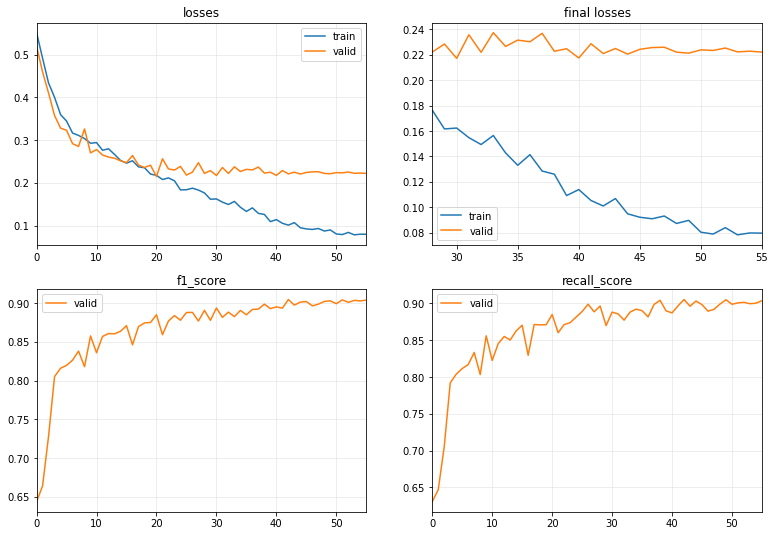

Training time: 166.0516 seconds


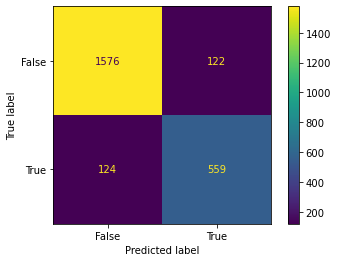

[I 2022-12-05 10:07:20,859] Trial 67 finished with value: 0.8196480938416423 and parameters: {'learning_rate': 0.0004296690535068586, 'batch_size': 64, 'pred_val': 50, 'num_epochs': 56, 'weight_decay': 0.0021141769331858404, 'normalization': False, 'window_length': 148}. Best is trial 56 with value: 0.8987348645273389.


0.8196480938416423


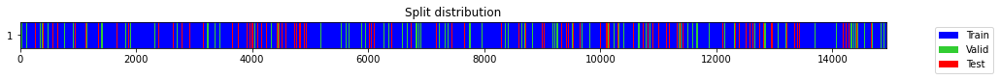

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.555239,0.519247,0.578468,0.584046,00:01
1,0.497280,0.460689,0.647849,0.634225,00:01
2,0.439116,0.403087,0.766971,0.752368,00:01
3,0.382251,0.356536,0.794815,0.782284,00:01
4,0.351220,0.318746,0.822719,0.824984,00:01
5,0.329882,0.310067,0.816925,0.814721,00:01
6,0.297332,0.295743,0.832454,0.828303,00:01
7,0.303469,0.298353,0.834581,0.829711,00:01
8,0.293311,0.282484,0.838143,0.833685,00:01
9,0.276624,0.291575,0.840827,0.843697,00:01


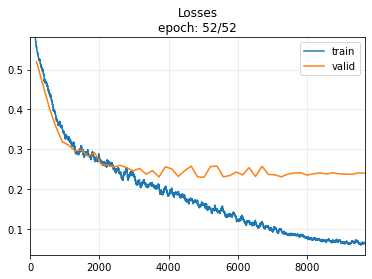

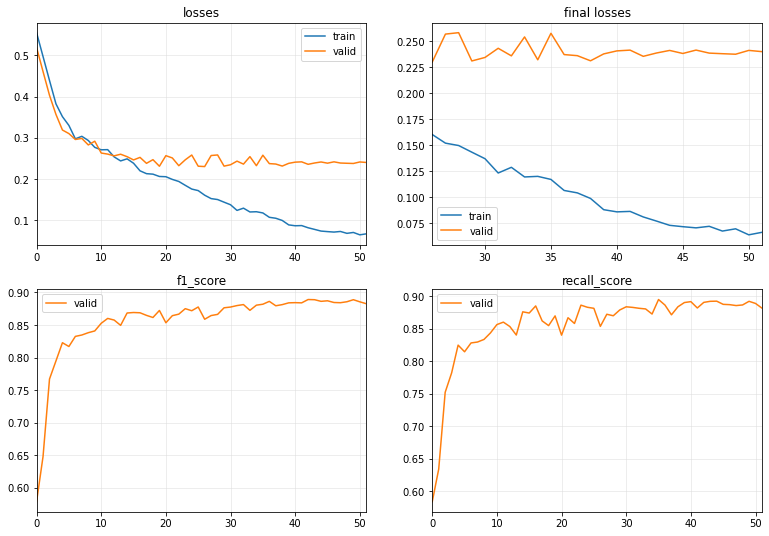

Training time: 108.658 seconds


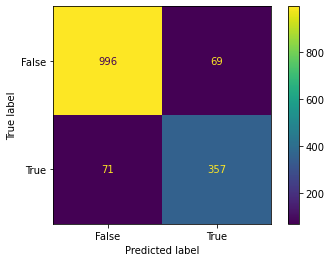

[I 2022-12-05 10:09:12,390] Trial 68 finished with value: 0.8360655737704918 and parameters: {'learning_rate': 0.0005608844043949642, 'batch_size': 64, 'pred_val': 148, 'num_epochs': 52, 'weight_decay': 0.0010411864730775144, 'normalization': True, 'window_length': 236}. Best is trial 56 with value: 0.8987348645273389.


0.8360655737704918


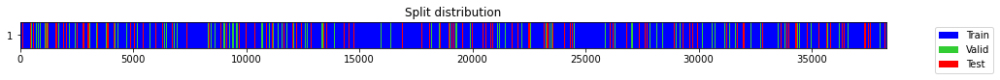

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.535266,0.518061,0.631025,0.620780,00:03
1,0.480589,0.473939,0.667434,0.650274,00:03
2,0.446626,0.431130,0.697871,0.677457,00:03
3,0.407475,0.389064,0.767611,0.752537,00:03
4,0.374528,0.358904,0.791962,0.779923,00:03
5,0.343383,0.338151,0.794830,0.780582,00:03
6,0.331702,0.317509,0.822504,0.813967,00:03
7,0.319956,0.308245,0.835407,0.843540,00:03
8,0.306991,0.292054,0.849973,0.859029,00:03
9,0.293510,0.292520,0.848237,0.859197,00:03


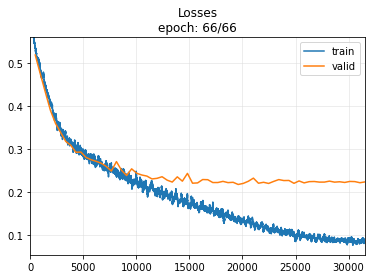

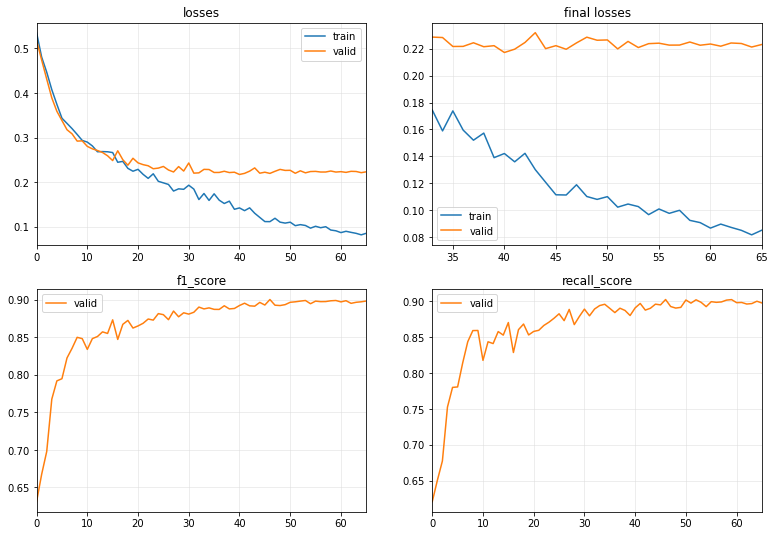

Training time: 306.3836 seconds


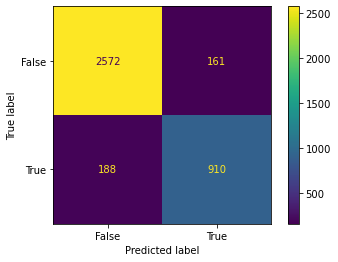

[I 2022-12-05 10:14:22,483] Trial 69 finished with value: 0.839096357768557 and parameters: {'learning_rate': 0.00027222213014790143, 'batch_size': 64, 'pred_val': 393, 'num_epochs': 66, 'weight_decay': 0.006754522820782896, 'normalization': True, 'window_length': 92}. Best is trial 56 with value: 0.8987348645273389.


0.839096357768557


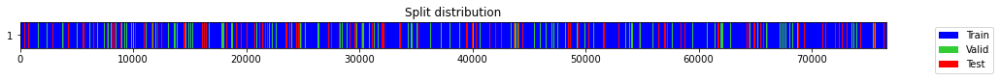

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.630599,0.624510,0.612319,0.615387,00:07
1,0.587607,0.579127,0.645274,0.639702,00:07
2,0.544578,0.537178,0.625894,0.616553,00:07
3,0.499497,0.501557,0.620257,0.612735,00:07
4,0.486730,0.471912,0.658273,0.642712,00:07
5,0.449848,0.446582,0.700836,0.681182,00:07
6,0.422066,0.421966,0.735115,0.716744,00:07
7,0.417008,0.400405,0.758616,0.743396,00:07
8,0.379050,0.382466,0.772493,0.761759,00:07
9,0.365426,0.367054,0.781338,0.769197,00:07


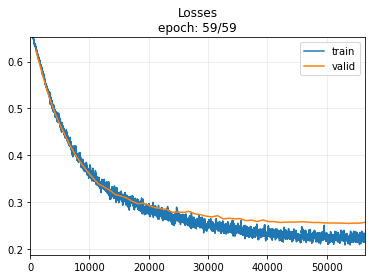

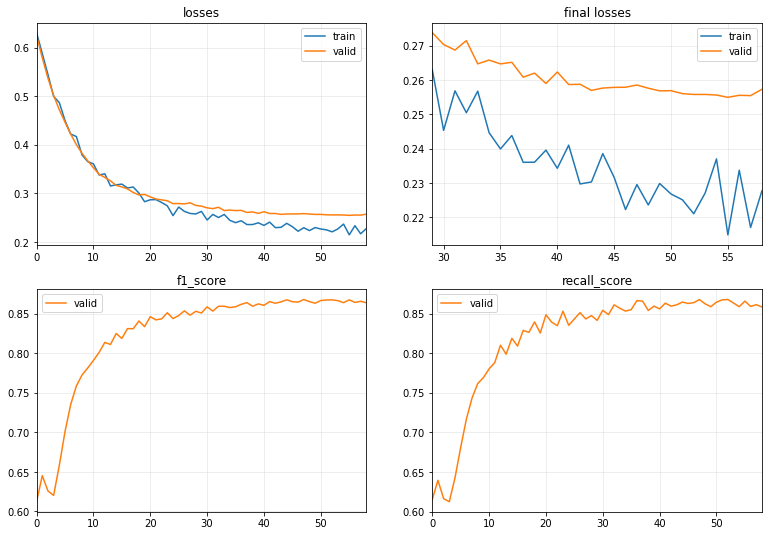

Training time: 528.8029 seconds


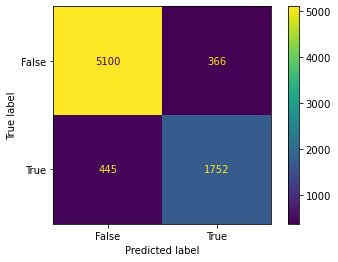

[I 2022-12-05 10:23:16,437] Trial 70 finished with value: 0.8120509849362687 and parameters: {'learning_rate': 3.26951247031931e-05, 'batch_size': 64, 'pred_val': 246, 'num_epochs': 59, 'weight_decay': 1.7976950153716996e-05, 'normalization': True, 'window_length': 46}. Best is trial 56 with value: 0.8987348645273389.


0.8120509849362687


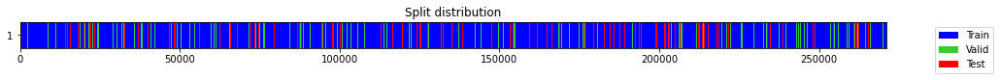

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.551190,0.539488,0.654564,0.641995,00:04
1,0.480746,0.474324,0.675322,0.658402,00:04
2,0.431220,0.421898,0.733509,0.715320,00:03
3,0.391780,0.383018,0.775246,0.764599,00:03
4,0.359652,0.354620,0.786636,0.771247,00:03
5,0.336790,0.332863,0.813798,0.805402,00:03
6,0.322474,0.321777,0.818297,0.807508,00:04
7,0.305148,0.306709,0.826472,0.817126,00:03
8,0.298116,0.296604,0.841874,0.846239,00:03
9,0.284100,0.299176,0.827072,0.810707,00:03


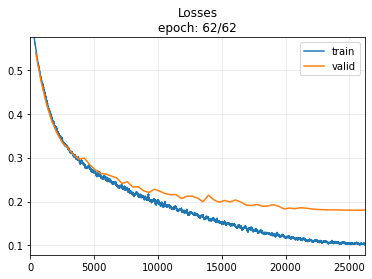

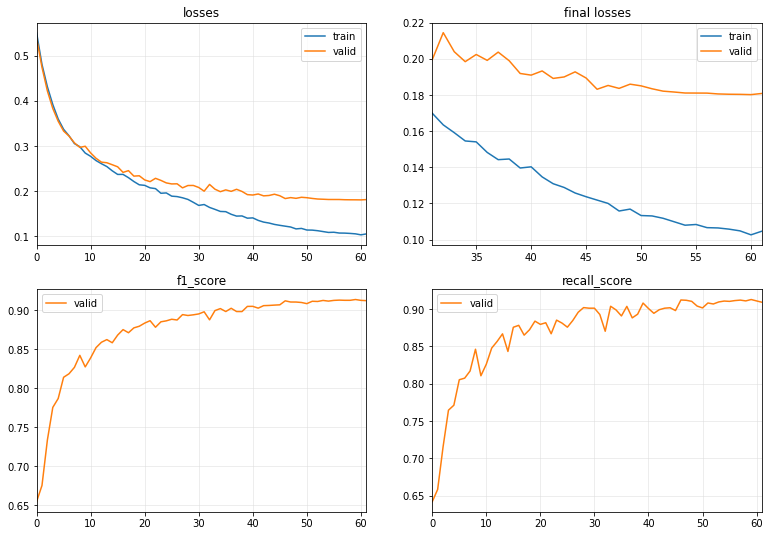

Training time: 296.7968 seconds


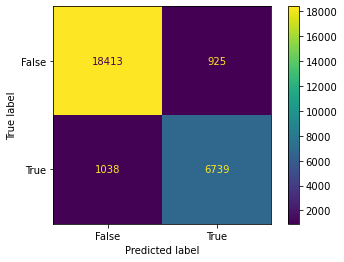

[I 2022-12-05 10:29:07,236] Trial 71 finished with value: 0.8728709280487016 and parameters: {'learning_rate': 0.00032492615265283917, 'batch_size': 512, 'pred_val': 50, 'num_epochs': 62, 'weight_decay': 0.0007480355372733719, 'normalization': True, 'window_length': 13}. Best is trial 56 with value: 0.8987348645273389.


0.8728709280487016


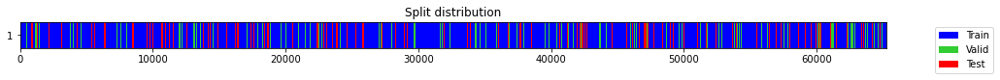

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.552395,0.544349,0.662524,0.650197,00:06
1,0.498203,0.476542,0.655758,0.640531,00:06
2,0.452705,0.430937,0.729970,0.712229,00:06
3,0.393137,0.384618,0.765030,0.745912,00:06
4,0.369638,0.353169,0.798911,0.792526,00:06
5,0.343031,0.336747,0.807480,0.797319,00:06
6,0.333202,0.325463,0.814515,0.805599,00:06
7,0.318049,0.303098,0.834558,0.826028,00:06
8,0.314194,0.294035,0.842996,0.837241,00:06
9,0.306874,0.288863,0.847482,0.851612,00:06


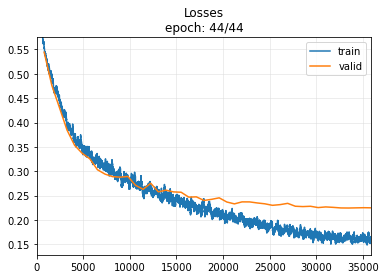

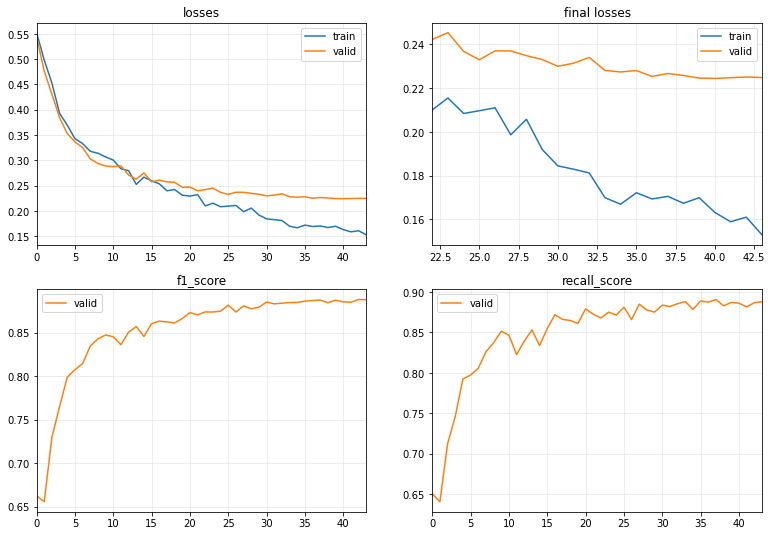

Training time: 320.5491 seconds


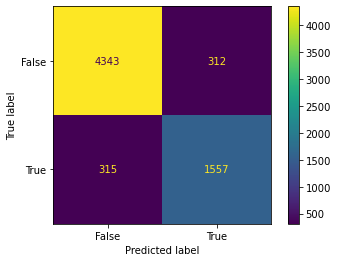

[I 2022-12-05 10:34:32,462] Trial 72 finished with value: 0.8323977546110666 and parameters: {'learning_rate': 0.00015684825865397084, 'batch_size': 64, 'pred_val': 99, 'num_epochs': 44, 'weight_decay': 0.00037433605510006043, 'normalization': True, 'window_length': 54}. Best is trial 56 with value: 0.8987348645273389.


0.8323977546110666


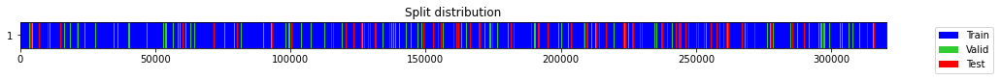

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.551317,0.531890,0.688908,0.682651,00:04
1,0.430309,0.417782,0.738457,0.720502,00:04
2,0.366581,0.354043,0.793012,0.780410,00:04
3,0.327362,0.324062,0.811394,0.798008,00:04
4,0.301124,0.303975,0.833024,0.831663,00:04
5,0.289526,0.287101,0.843733,0.839843,00:04
6,0.279273,0.276779,0.855222,0.862969,00:04
7,0.266325,0.259764,0.859639,0.857201,00:04
8,0.256239,0.257068,0.865053,0.866480,00:04
9,0.244722,0.245095,0.872848,0.873200,00:04


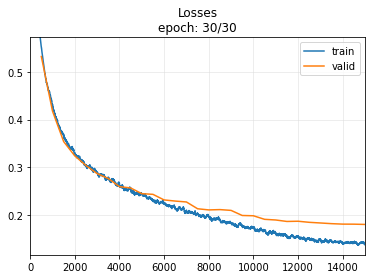

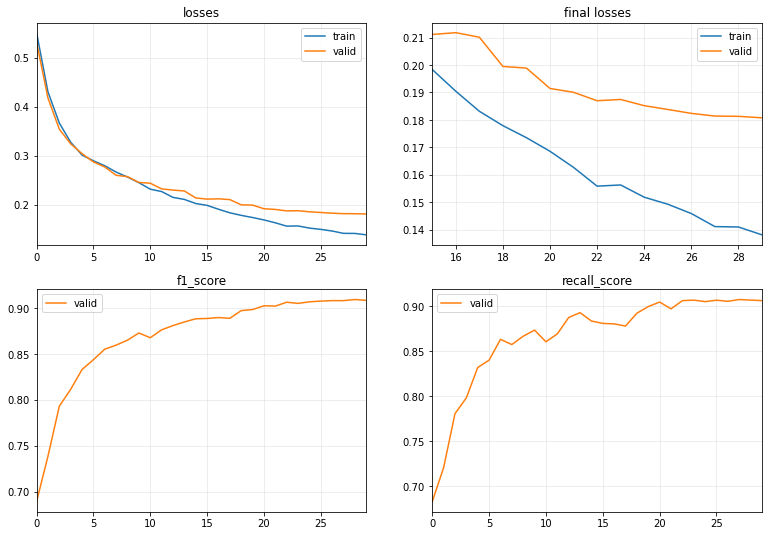

Training time: 153.0911 seconds


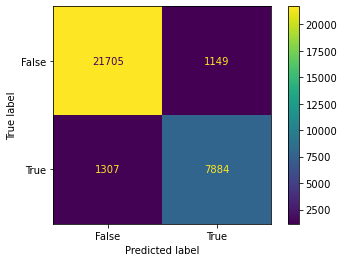

[I 2022-12-05 10:38:22,453] Trial 73 finished with value: 0.8652326602282704 and parameters: {'learning_rate': 0.0003943046811237248, 'batch_size': 512, 'pred_val': 99, 'num_epochs': 30, 'weight_decay': 0.0016995383763777831, 'normalization': True, 'window_length': 11}. Best is trial 56 with value: 0.8987348645273389.


0.8652326602282704


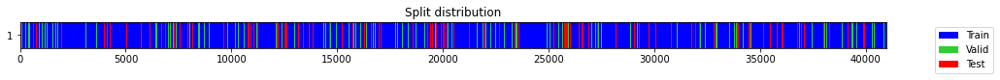

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.567064,0.551972,0.618990,0.611814,00:04
1,0.485905,0.473993,0.660606,0.644804,00:03
2,0.428918,0.407142,0.739565,0.722096,00:03
3,0.371927,0.356620,0.781260,0.762217,00:03
4,0.347624,0.342091,0.801903,0.794069,00:03
5,0.333419,0.320307,0.810240,0.797516,00:03
6,0.314550,0.301960,0.830148,0.818467,00:03
7,0.292620,0.287710,0.839798,0.838504,00:03
8,0.293925,0.286972,0.838195,0.834261,00:03
9,0.285206,0.273928,0.854246,0.862813,00:04


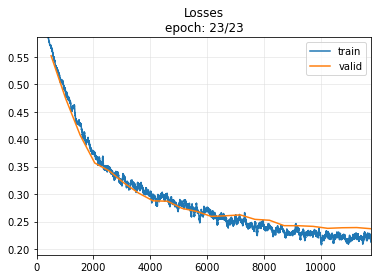

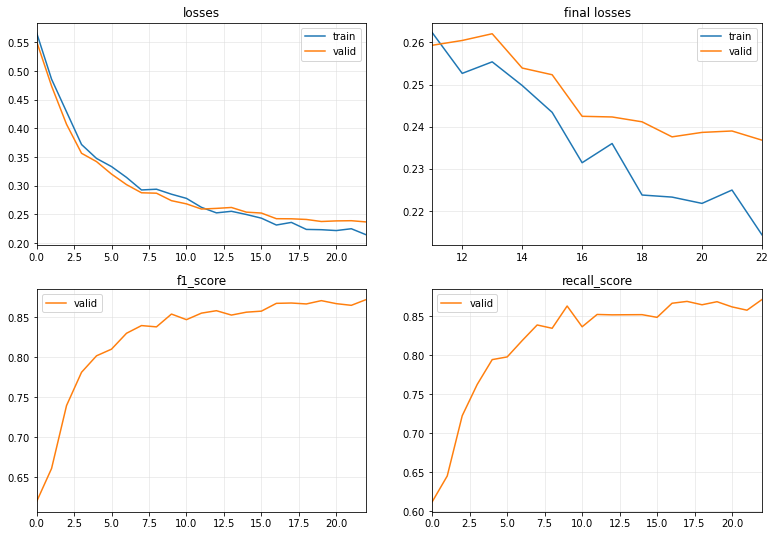

Training time: 100.6467 seconds


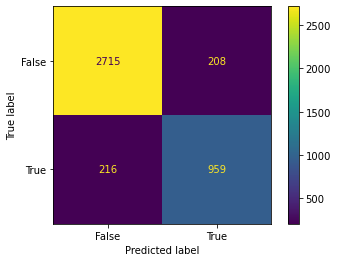

[I 2022-12-05 10:40:06,586] Trial 74 finished with value: 0.8189581554227156 and parameters: {'learning_rate': 0.00012081050749237765, 'batch_size': 64, 'pred_val': 148, 'num_epochs': 23, 'weight_decay': 0.0002724263701406836, 'normalization': True, 'window_length': 86}. Best is trial 56 with value: 0.8987348645273389.


0.8189581554227156


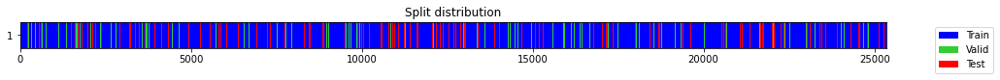

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.599655,0.570076,0.658624,0.648940,00:01
1,0.523418,0.504277,0.652131,0.637962,00:01
2,0.473030,0.454809,0.671854,0.655143,00:01
3,0.424906,0.412371,0.756337,0.740380,00:01
4,0.386456,0.371975,0.784174,0.775970,00:01
5,0.346970,0.331887,0.815416,0.809143,00:01
6,0.317197,0.311264,0.835130,0.835130,00:01
7,0.309357,0.325149,0.815082,0.816252,00:01
8,0.288965,0.303978,0.824027,0.807016,00:01
9,0.275302,0.320707,0.826134,0.839037,00:01


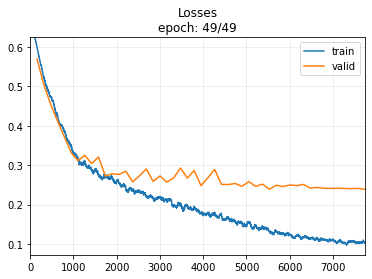

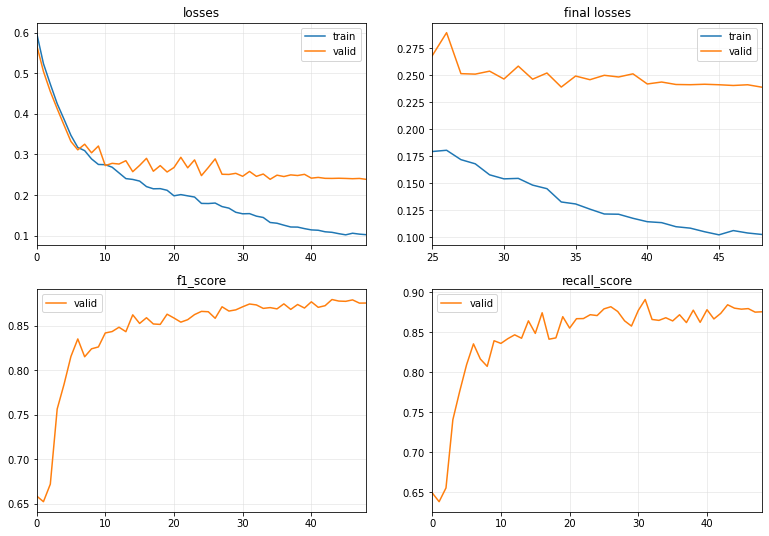

Training time: 95.3134 seconds


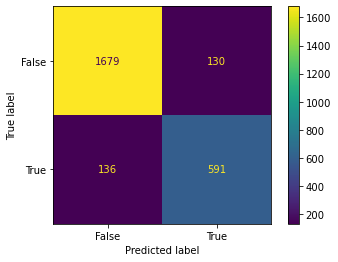

[I 2022-12-05 10:41:44,960] Trial 75 finished with value: 0.8162983425414365 and parameters: {'learning_rate': 0.00034030101321953955, 'batch_size': 128, 'pred_val': 99, 'num_epochs': 49, 'weight_decay': 3.07989718617506e-05, 'normalization': True, 'window_length': 139}. Best is trial 56 with value: 0.8987348645273389.


0.8162983425414365


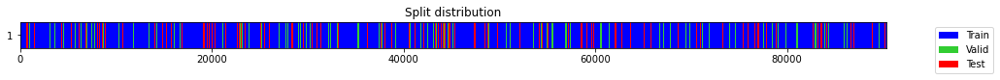

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.529317,0.516550,0.624676,0.615692,00:02
1,0.474741,0.463841,0.652215,0.637709,00:02
2,0.423300,0.414810,0.741104,0.723927,00:02
3,0.384474,0.376027,0.774187,0.761348,00:02
4,0.353446,0.350657,0.788165,0.774144,00:02
5,0.329473,0.344066,0.809770,0.815380,00:02
6,0.316296,0.326547,0.821338,0.819453,00:02
7,0.305676,0.329726,0.820667,0.818566,00:02
8,0.294291,0.324434,0.817966,0.800094,00:02
9,0.290161,0.311999,0.830810,0.845084,00:02


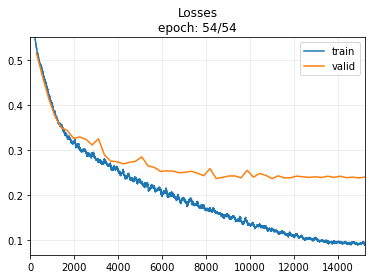

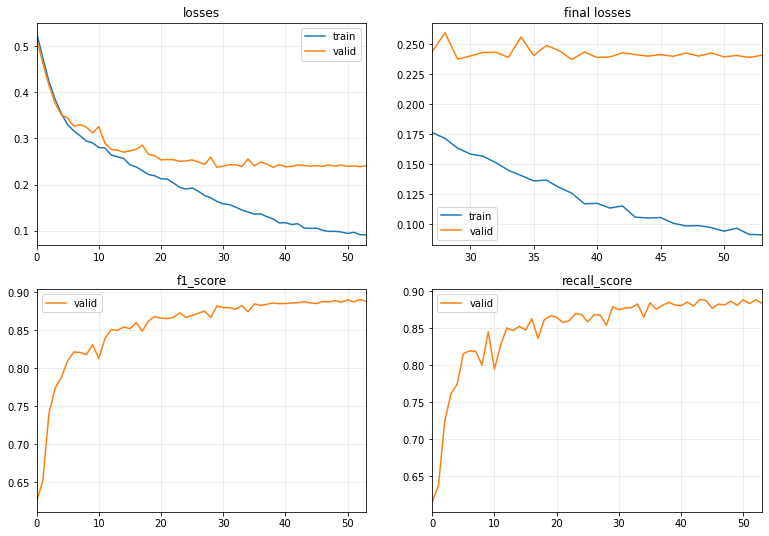

Training time: 165.728 seconds


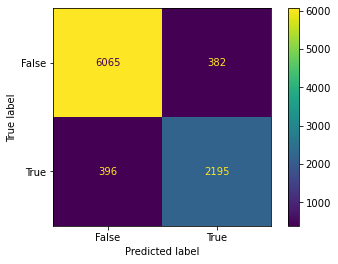

[I 2022-12-05 10:44:36,188] Trial 76 finished with value: 0.8494582043343654 and parameters: {'learning_rate': 0.0005014868341878061, 'batch_size': 256, 'pred_val': 1, 'num_epochs': 54, 'weight_decay': 0.0005416790882231127, 'normalization': True, 'window_length': 39}. Best is trial 56 with value: 0.8987348645273389.


0.8494582043343654


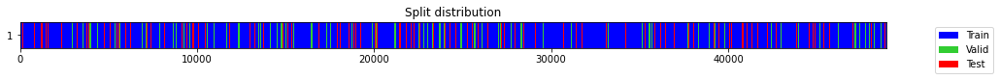

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.607714,0.562665,0.680405,0.672341,00:01
1,0.529785,0.481103,0.669837,0.652905,00:01
2,0.459702,0.421957,0.746458,0.730815,00:01
3,0.404371,0.367189,0.789730,0.780019,00:01
4,0.360615,0.335995,0.813639,0.814307,00:01
5,0.327062,0.323112,0.805250,0.781358,00:01
6,0.303382,0.298732,0.829419,0.816274,00:01
7,0.292227,0.295752,0.847341,0.855343,00:01
8,0.277895,0.279159,0.848305,0.841330,00:01
9,0.268831,0.282218,0.850845,0.847721,00:01


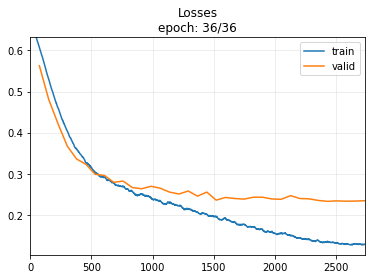

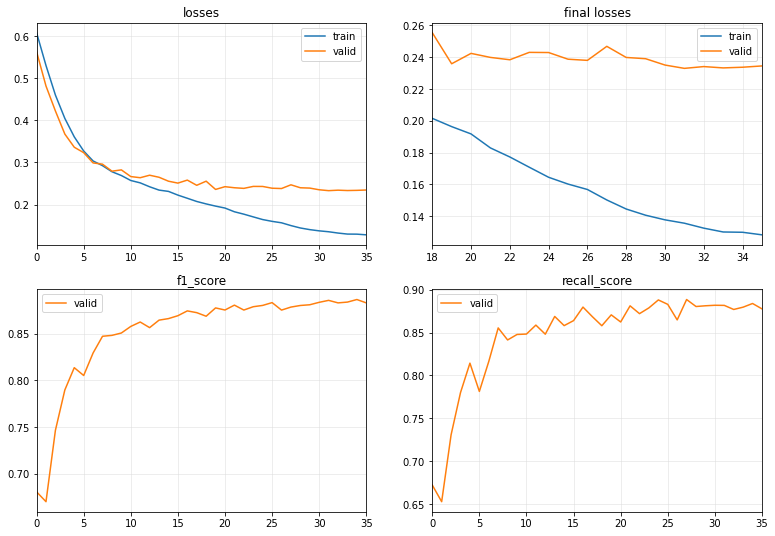

Training time: 59.8297 seconds


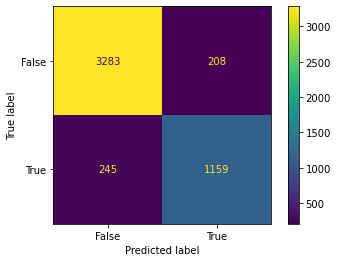

[I 2022-12-05 10:45:38,227] Trial 77 finished with value: 0.8365211115120896 and parameters: {'learning_rate': 0.0006587032398740953, 'batch_size': 512, 'pred_val': 442, 'num_epochs': 36, 'weight_decay': 4.185451525571948e-05, 'normalization': False, 'window_length': 72}. Best is trial 56 with value: 0.8987348645273389.


0.8365211115120896


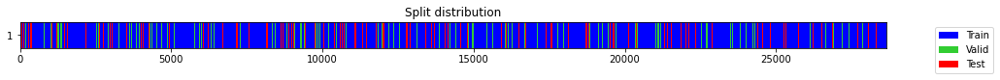

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.618205,0.598553,0.660910,0.680213,00:02
1,0.539738,0.524883,0.645923,0.632907,00:02
2,0.504491,0.484342,0.654532,0.639529,00:02
3,0.470619,0.454394,0.694135,0.673928,00:02
4,0.431413,0.418919,0.734631,0.712598,00:02
5,0.393913,0.384197,0.772771,0.755498,00:02
6,0.371037,0.355329,0.801927,0.793650,00:02
7,0.336081,0.335825,0.812103,0.803641,00:02
8,0.333655,0.319872,0.829040,0.829999,00:02
9,0.315636,0.304183,0.836182,0.838760,00:02


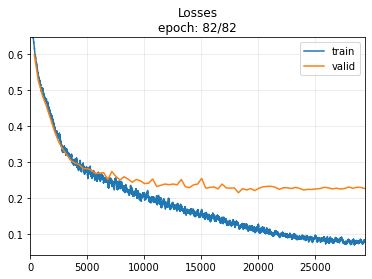

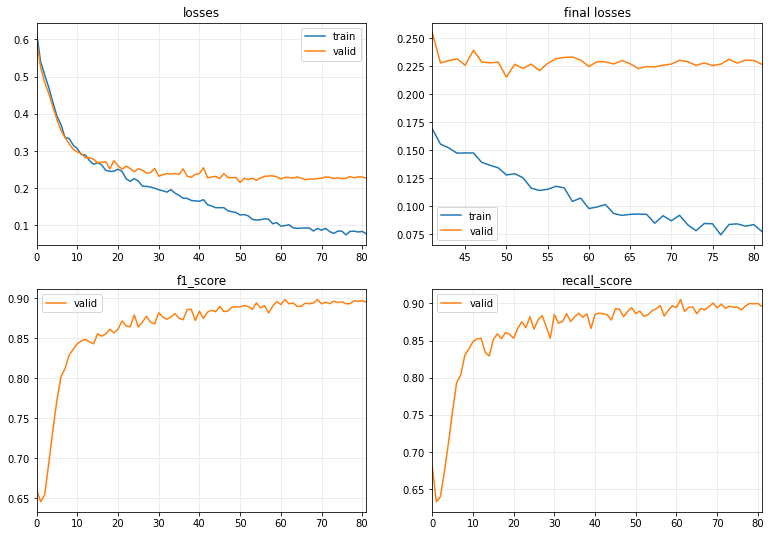

Training time: 301.634 seconds


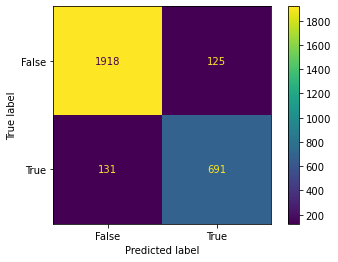

[I 2022-12-05 10:50:43,095] Trial 78 finished with value: 0.8437118437118438 and parameters: {'learning_rate': 0.00019662968736444924, 'batch_size': 64, 'pred_val': 197, 'num_epochs': 82, 'weight_decay': 0.00015738828168631455, 'normalization': True, 'window_length': 123}. Best is trial 56 with value: 0.8987348645273389.


0.8437118437118438


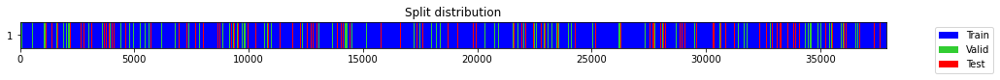

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.673225,0.643625,0.602391,0.608475,00:01
1,0.634240,0.598899,0.650729,0.655697,00:01
2,0.596415,0.558660,0.677430,0.668543,00:01
3,0.558029,0.521084,0.675621,0.660307,00:01
4,0.521503,0.489185,0.677864,0.660006,00:01
5,0.488716,0.459720,0.686862,0.667560,00:01
6,0.460565,0.434044,0.726629,0.706349,00:01
7,0.432176,0.405499,0.734175,0.714164,00:01
8,0.406336,0.384672,0.771836,0.760098,00:01
9,0.381125,0.359836,0.798344,0.788357,00:01


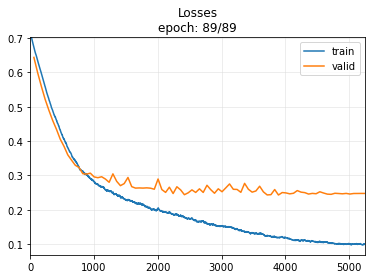

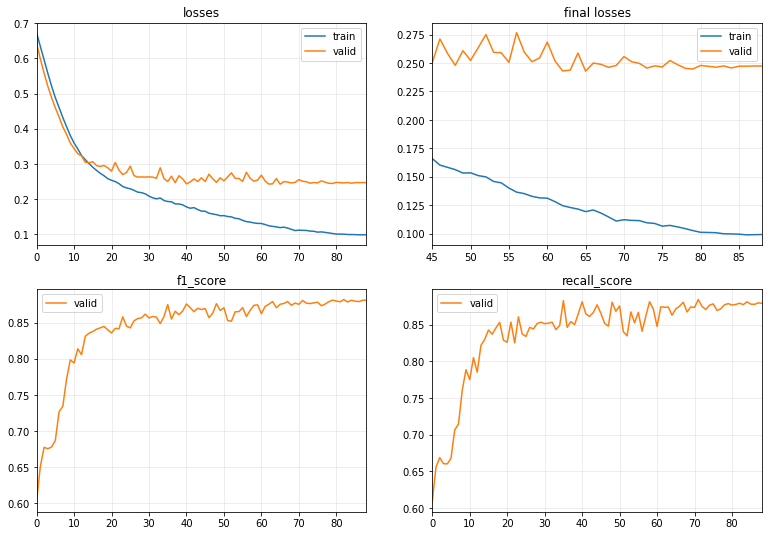

Training time: 144.1233 seconds


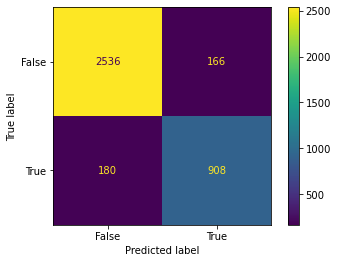

[I 2022-12-05 10:53:10,568] Trial 79 finished with value: 0.8399629972247918 and parameters: {'learning_rate': 0.0002876985619604164, 'batch_size': 512, 'pred_val': 50, 'num_epochs': 89, 'weight_decay': 9.924742050668939e-05, 'normalization': True, 'window_length': 93}. Best is trial 56 with value: 0.8987348645273389.


0.8399629972247918


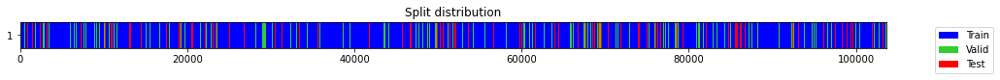

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.516877,0.511603,0.644154,0.631333,00:10
1,0.466793,0.457815,0.688795,0.670363,00:09
2,0.433813,0.418719,0.735371,0.718249,00:09
3,0.401488,0.384056,0.763855,0.749019,00:09
4,0.374245,0.356099,0.789893,0.781585,00:10
5,0.349956,0.336881,0.804411,0.795399,00:09
6,0.337756,0.323183,0.816438,0.808491,00:09
7,0.321148,0.313877,0.821561,0.808798,00:09
8,0.318350,0.304961,0.827427,0.818935,00:09
9,0.306364,0.306426,0.817032,0.798506,00:09


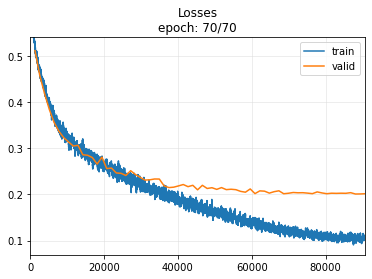

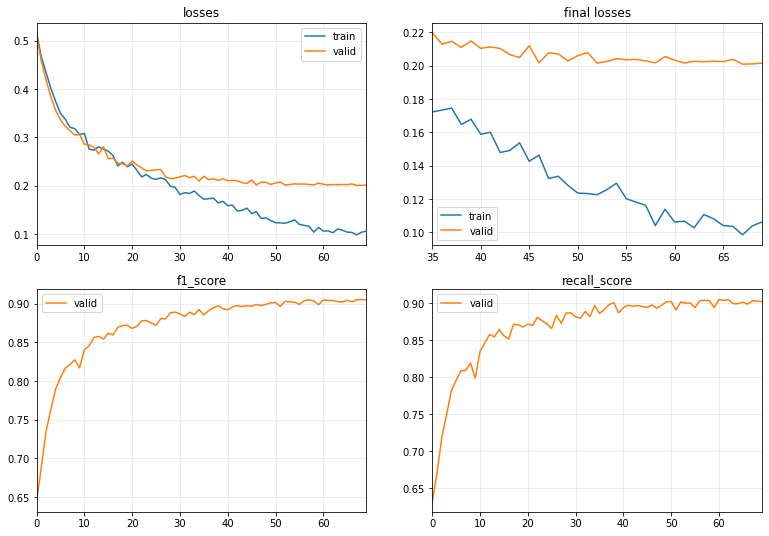

Training time: 871.9901 seconds


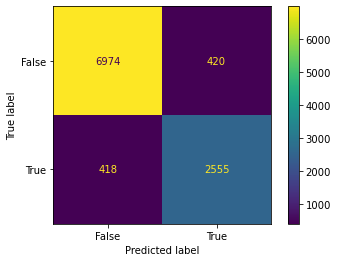

[I 2022-12-05 11:07:48,856] Trial 80 finished with value: 0.8591123066577 and parameters: {'learning_rate': 0.00023887148763073132, 'batch_size': 64, 'pred_val': 148, 'num_epochs': 70, 'weight_decay': 2.4621507278197567e-05, 'normalization': True, 'window_length': 34}. Best is trial 56 with value: 0.8987348645273389.


0.8591123066577


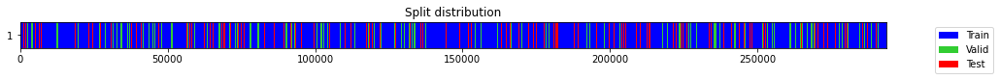

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.418082,0.387154,0.767741,0.754488,00:27
1,0.353147,0.338797,0.811806,0.810427,00:27
2,0.329339,0.311332,0.827598,0.819232,00:27
3,0.305102,0.296055,0.839984,0.841774,00:27
4,0.289125,0.268263,0.848799,0.840482,00:27
5,0.272671,0.254966,0.862601,0.859640,00:27
6,0.253915,0.246614,0.864641,0.857329,00:27
7,0.239477,0.232178,0.877210,0.877826,00:27
8,0.224504,0.224909,0.882137,0.877789,00:27
9,0.225787,0.209470,0.890666,0.889807,00:27


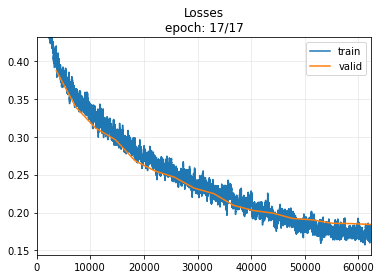

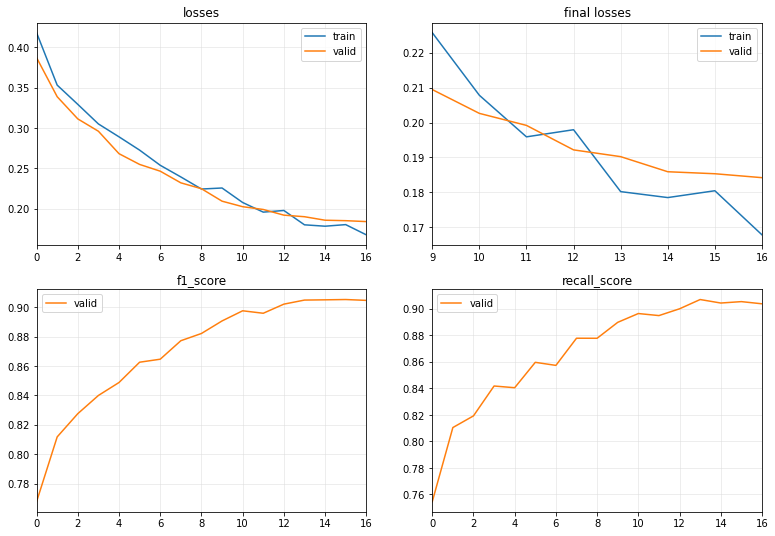

Training time: 499.0613 seconds


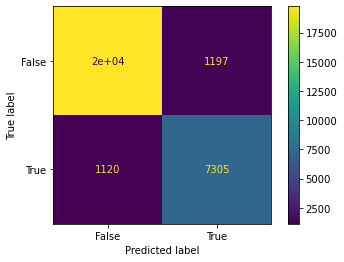

[I 2022-12-05 11:17:11,767] Trial 81 finished with value: 0.8631180953506232 and parameters: {'learning_rate': 0.0005244458209865605, 'batch_size': 64, 'pred_val': 50, 'num_epochs': 17, 'weight_decay': 0.00020884479046283028, 'normalization': True, 'window_length': 12}. Best is trial 56 with value: 0.8987348645273389.


0.8631180953506232


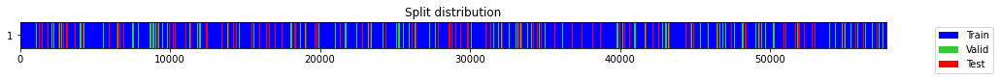

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.502405,0.482876,0.642984,0.630403,00:05
1,0.428226,0.406381,0.756829,0.744816,00:05
2,0.373897,0.355238,0.805785,0.801746,00:05
3,0.343162,0.336089,0.803945,0.793173,00:05
4,0.325416,0.322098,0.815871,0.814169,00:05
5,0.306912,0.303558,0.835867,0.827100,00:05
6,0.312612,0.297290,0.841208,0.833793,00:05
7,0.298448,0.286700,0.844883,0.841851,00:05
8,0.293356,0.278572,0.841200,0.826426,00:05
9,0.268312,0.279189,0.849699,0.841292,00:05


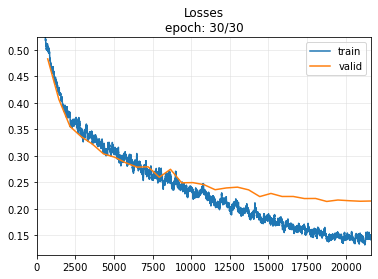

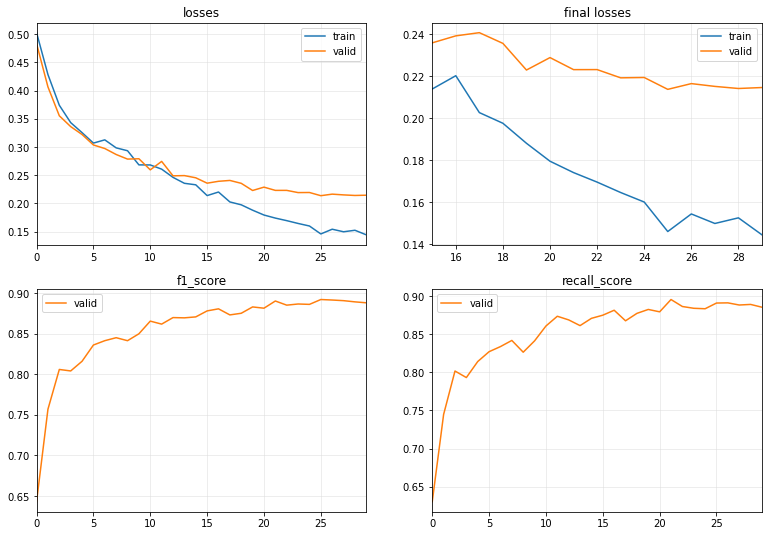

Training time: 188.1285 seconds


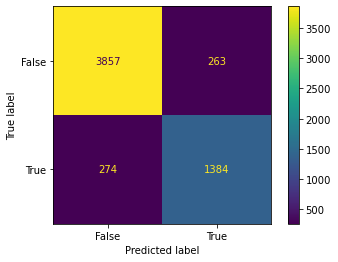

[I 2022-12-05 11:20:24,140] Trial 82 finished with value: 0.8375189107413011 and parameters: {'learning_rate': 0.0004550588890567069, 'batch_size': 64, 'pred_val': 50, 'num_epochs': 30, 'weight_decay': 0.00027143183658158985, 'normalization': True, 'window_length': 61}. Best is trial 56 with value: 0.8987348645273389.


0.8375189107413011


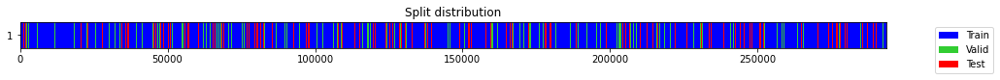

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.402836,0.399898,0.758590,0.746457,00:27
1,0.363162,0.348779,0.792076,0.778279,00:28
2,0.342811,0.339600,0.808271,0.796371,00:27
3,0.315804,0.310371,0.825654,0.821823,00:27
4,0.288872,0.285420,0.843272,0.839085,00:27
5,0.289768,0.280580,0.846943,0.845849,00:27
6,0.276054,0.260466,0.863967,0.866272,00:27
7,0.264427,0.244501,0.872917,0.876463,00:27
8,0.241071,0.238837,0.875449,0.872289,00:27
9,0.246818,0.224449,0.884643,0.887654,00:27


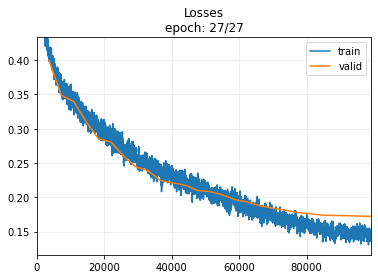

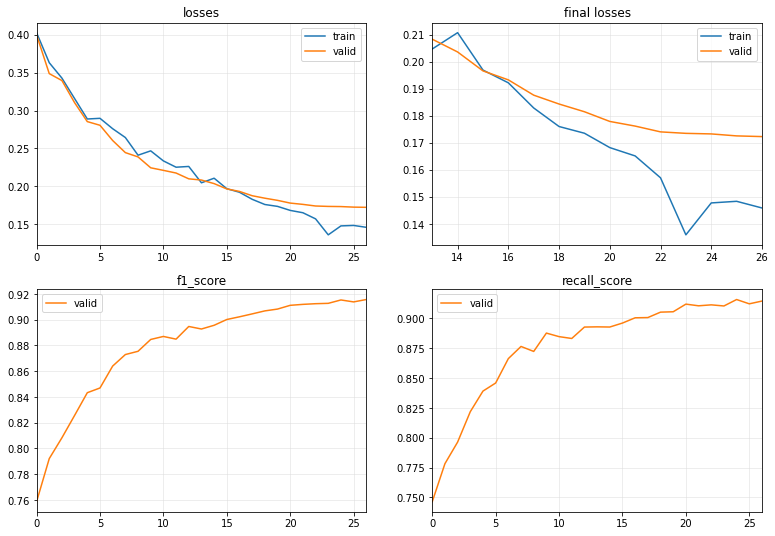

Training time: 820.1458 seconds


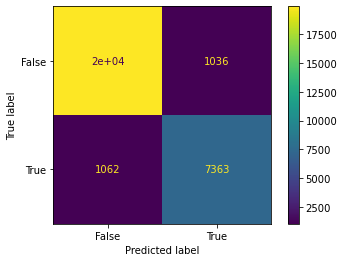

[I 2022-12-05 11:35:08,726] Trial 83 finished with value: 0.8752971944840705 and parameters: {'learning_rate': 0.0005979174050536181, 'batch_size': 64, 'pred_val': 1, 'num_epochs': 27, 'weight_decay': 0.0008478324470378101, 'normalization': True, 'window_length': 12}. Best is trial 56 with value: 0.8987348645273389.


0.8752971944840705


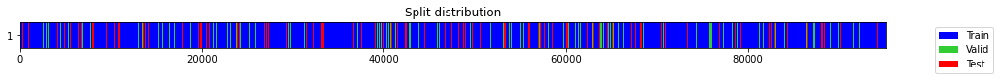

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.449032,0.434007,0.722041,0.706688,00:09
1,0.390592,0.371264,0.771131,0.757236,00:09
2,0.368740,0.341341,0.803441,0.792810,00:09
3,0.346340,0.345575,0.807990,0.806179,00:09
4,0.338644,0.320940,0.823937,0.822629,00:09
5,0.313996,0.307761,0.831521,0.830652,00:09
6,0.300091,0.297929,0.840345,0.836939,00:09
7,0.297787,0.289714,0.836157,0.821421,00:08
8,0.299937,0.288744,0.836812,0.835966,00:09
9,0.279324,0.281078,0.843944,0.835368,00:09


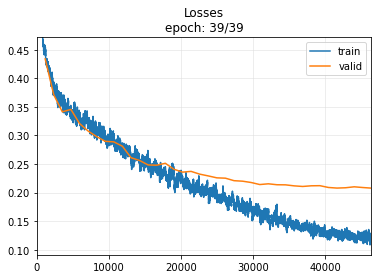

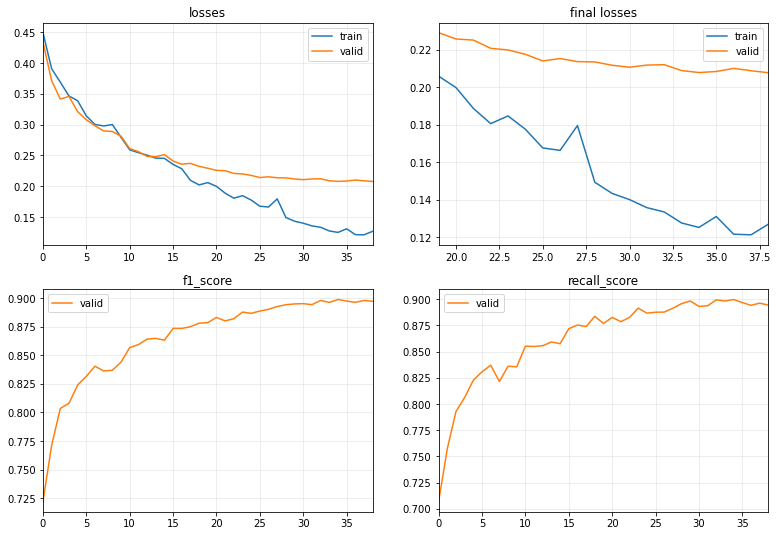

Training time: 411.4689 seconds


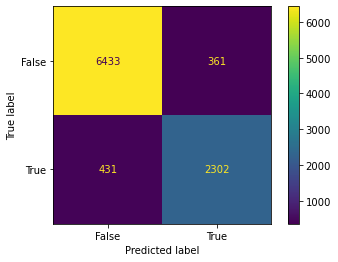

[I 2022-12-05 11:42:06,360] Trial 84 finished with value: 0.8532246108228319 and parameters: {'learning_rate': 0.0008757539020487127, 'batch_size': 64, 'pred_val': 1, 'num_epochs': 39, 'weight_decay': 0.0008274371005888412, 'normalization': True, 'window_length': 37}. Best is trial 56 with value: 0.8987348645273389.


0.8532246108228319


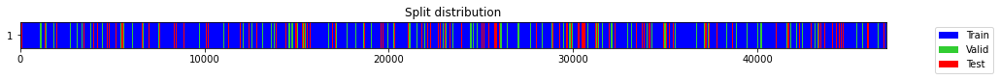

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.646954,0.592953,0.664998,0.694215,00:01
1,0.576137,0.520754,0.687643,0.671727,00:01
2,0.507842,0.464060,0.680704,0.662453,00:01
3,0.455599,0.420476,0.743415,0.726703,00:01
4,0.412491,0.388165,0.786082,0.783814,00:01
5,0.375096,0.353739,0.800593,0.794618,00:01
6,0.345646,0.341372,0.789449,0.776483,00:01
7,0.324245,0.321171,0.805108,0.787441,00:01
8,0.311701,0.331210,0.793034,0.767761,00:01
9,0.300286,0.297602,0.833199,0.821259,00:01


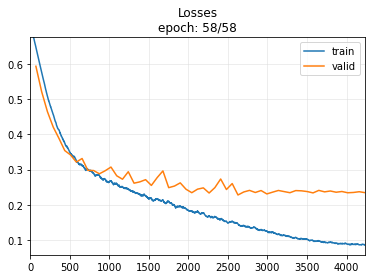

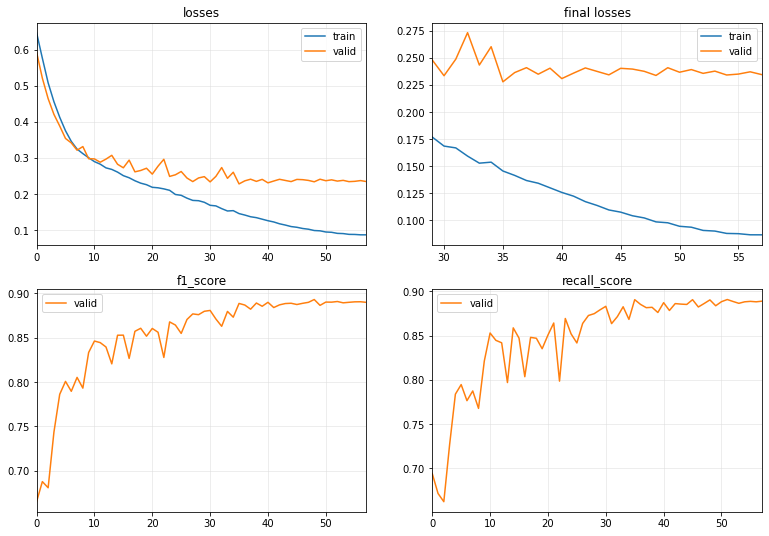

Training time: 98.5629 seconds


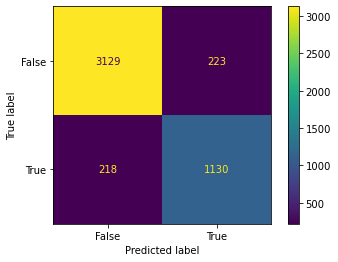

[I 2022-12-05 11:43:48,712] Trial 85 finished with value: 0.836727138097001 and parameters: {'learning_rate': 0.000693877520789004, 'batch_size': 512, 'pred_val': 1, 'num_epochs': 58, 'weight_decay': 0.0022869353761047063, 'normalization': True, 'window_length': 75}. Best is trial 56 with value: 0.8987348645273389.


0.836727138097001


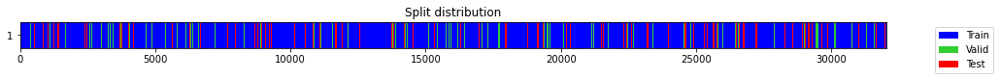

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.611002,0.582018,0.638893,0.651018,00:01
1,0.554337,0.525191,0.681459,0.666528,00:01
2,0.503274,0.477917,0.684012,0.665759,00:01
3,0.461727,0.439517,0.726896,0.709493,00:01
4,0.425236,0.402854,0.761014,0.750405,00:01
5,0.386348,0.366591,0.781827,0.767110,00:01
6,0.351619,0.336439,0.813766,0.812142,00:01
7,0.327557,0.321501,0.810891,0.795416,00:01
8,0.307579,0.307083,0.819004,0.806595,00:01
9,0.296883,0.285300,0.845033,0.844585,00:01


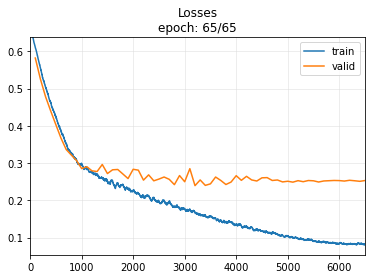

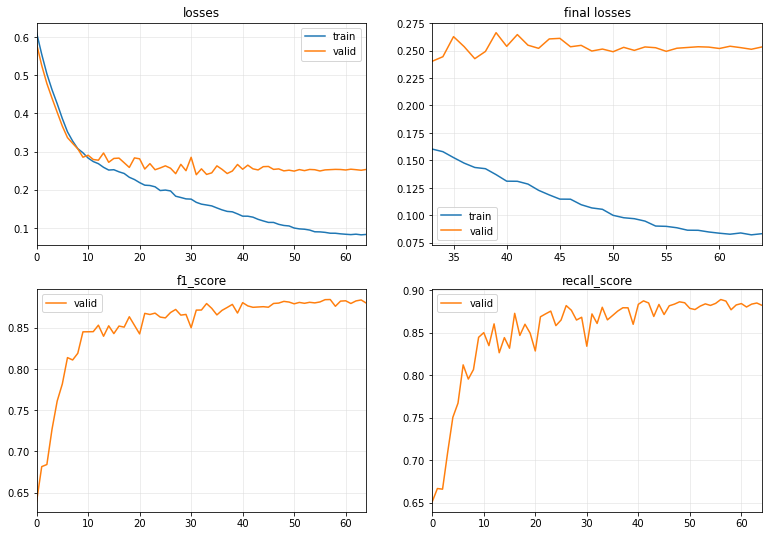

Training time: 113.6821 seconds


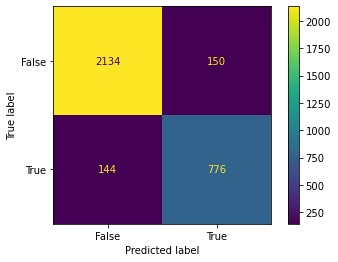

[I 2022-12-05 11:45:47,314] Trial 86 finished with value: 0.8407367280606717 and parameters: {'learning_rate': 0.00040712324880048934, 'batch_size': 256, 'pred_val': 99, 'num_epochs': 65, 'weight_decay': 0.0015242682953399338, 'normalization': True, 'window_length': 110}. Best is trial 56 with value: 0.8987348645273389.


0.8407367280606717


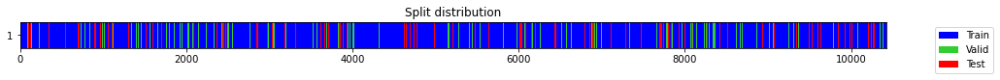

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.555086,0.504467,0.525220,0.552798,00:01
1,0.466321,0.420661,0.736631,0.716842,00:01
2,0.395181,0.348627,0.772743,0.751653,00:01
3,0.345908,0.336131,0.781772,0.757710,00:01
4,0.314214,0.312494,0.807857,0.783813,00:01
5,0.296834,0.273497,0.850843,0.844932,00:01
6,0.282739,0.283750,0.854576,0.848949,00:01
7,0.256322,0.279162,0.858887,0.863939,00:01
8,0.254360,0.262464,0.867266,0.880294,00:01
9,0.241714,0.279577,0.867568,0.877969,00:01


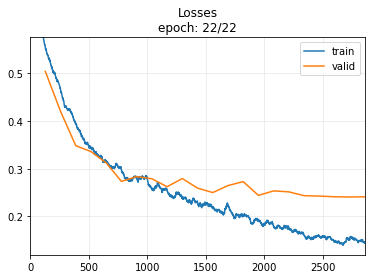

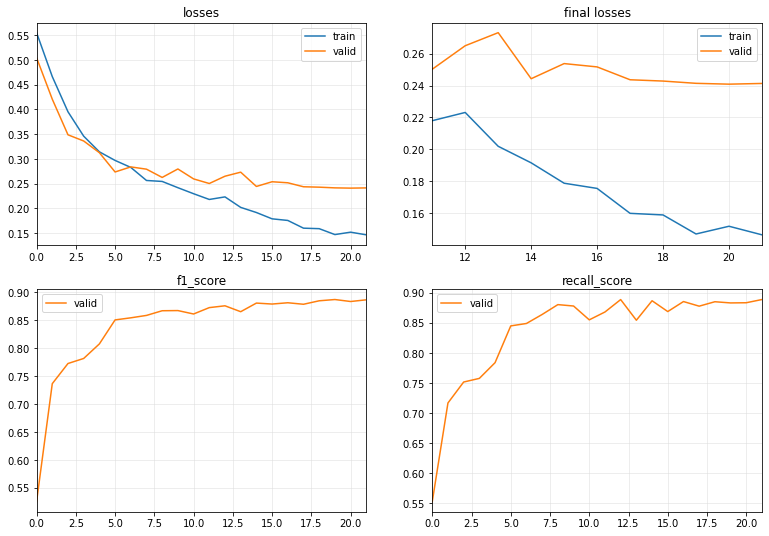

Training time: 36.4246 seconds


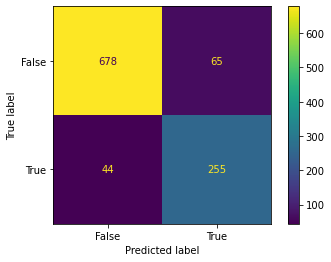

[I 2022-12-05 11:46:26,777] Trial 87 finished with value: 0.8239095315024232 and parameters: {'learning_rate': 0.0006086643932414983, 'batch_size': 64, 'pred_val': 1, 'num_epochs': 22, 'weight_decay': 1.164704092770192e-05, 'normalization': True, 'window_length': 338}. Best is trial 56 with value: 0.8987348645273389.


0.8239095315024232


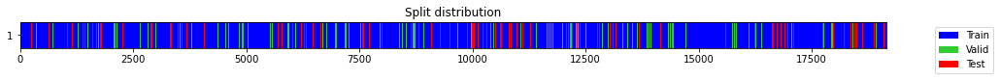

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.711923,0.642928,0.600695,0.635671,00:01
1,0.651803,0.544215,0.662229,0.647712,00:01
2,0.584626,0.485616,0.585382,0.588618,00:01
3,0.526782,0.443952,0.665241,0.648212,00:01
4,0.478294,0.401888,0.751283,0.729950,00:01
5,0.435940,0.369424,0.806225,0.801459,00:01
6,0.397124,0.361688,0.809440,0.816087,00:01
7,0.366159,0.320100,0.833634,0.828785,00:01
8,0.338499,0.324406,0.797420,0.770410,00:01
9,0.317954,0.339280,0.821483,0.822707,00:01


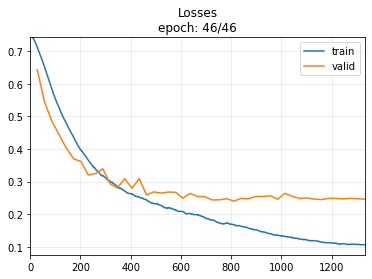

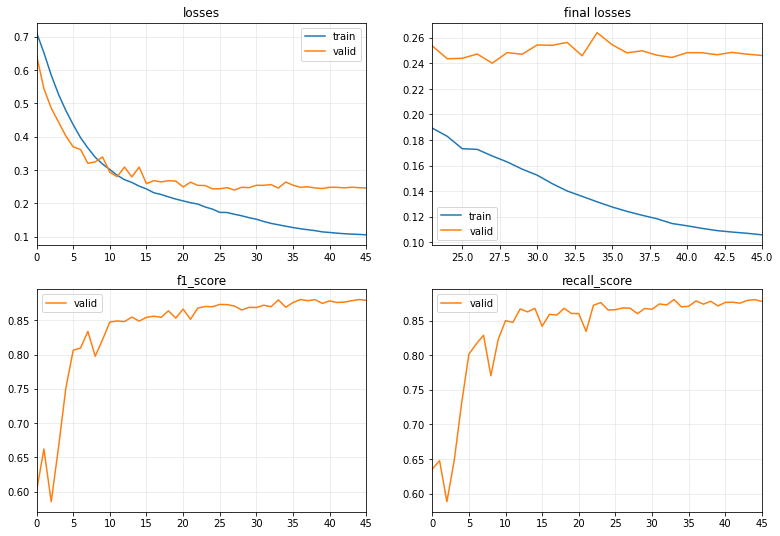

Training time: 56.5029 seconds


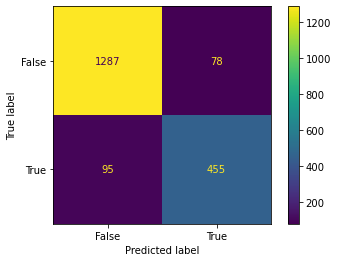

[I 2022-12-05 11:47:27,527] Trial 88 finished with value: 0.840258541089566 and parameters: {'learning_rate': 0.0007797395045779001, 'batch_size': 512, 'pred_val': 344, 'num_epochs': 46, 'weight_decay': 1.5451250063913778e-05, 'normalization': True, 'window_length': 184}. Best is trial 56 with value: 0.8987348645273389.


0.840258541089566


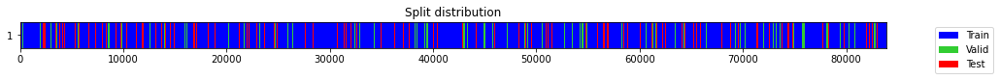

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.578892,0.574839,0.664741,0.660074,00:08
1,0.517657,0.515196,0.615515,0.609036,00:07
2,0.480870,0.481000,0.633796,0.623045,00:07
3,0.452384,0.450171,0.697553,0.678720,00:07
4,0.424848,0.418049,0.743357,0.727263,00:07
5,0.396416,0.387630,0.760488,0.744273,00:08
6,0.369532,0.361651,0.782217,0.768088,00:07
7,0.349892,0.343141,0.797655,0.785380,00:07
8,0.341543,0.332844,0.811591,0.803902,00:07
9,0.341276,0.322794,0.823705,0.822581,00:07


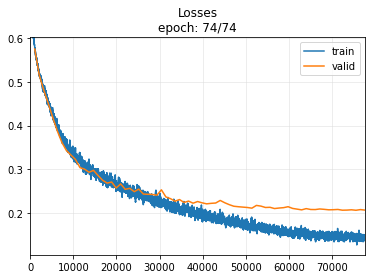

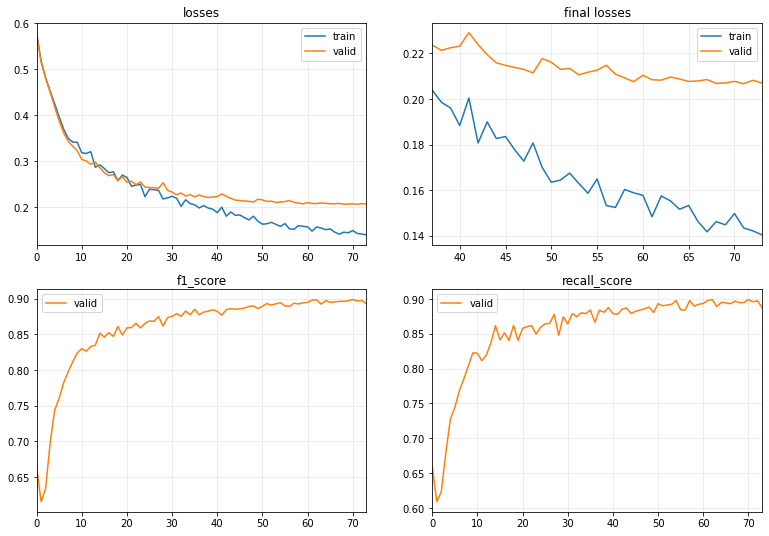

Training time: 762.72 seconds


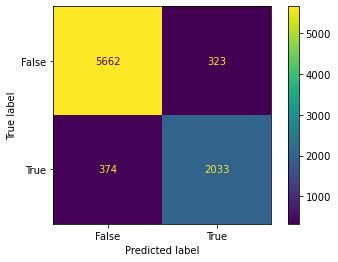

[I 2022-12-05 12:00:14,220] Trial 89 finished with value: 0.8536636573588074 and parameters: {'learning_rate': 0.00010654333636593898, 'batch_size': 64, 'pred_val': 148, 'num_epochs': 74, 'weight_decay': 0.0005105313265727933, 'normalization': False, 'window_length': 42}. Best is trial 56 with value: 0.8987348645273389.


0.8536636573588074


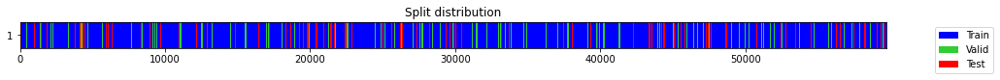

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.535485,0.488284,0.630041,0.620148,00:02
1,0.428570,0.385670,0.775468,0.764327,00:01
2,0.356391,0.331968,0.819491,0.816223,00:01
3,0.330843,0.328254,0.832082,0.847541,00:01
4,0.309722,0.299565,0.833254,0.829670,00:01
5,0.296692,0.289880,0.837844,0.825989,00:01
6,0.287755,0.283543,0.847565,0.841670,00:01
7,0.269464,0.275488,0.846946,0.835512,00:01
8,0.260721,0.270427,0.855211,0.854901,00:01
9,0.251024,0.258397,0.861371,0.856917,00:01


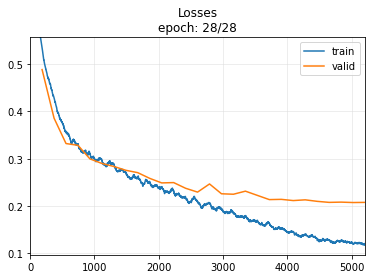

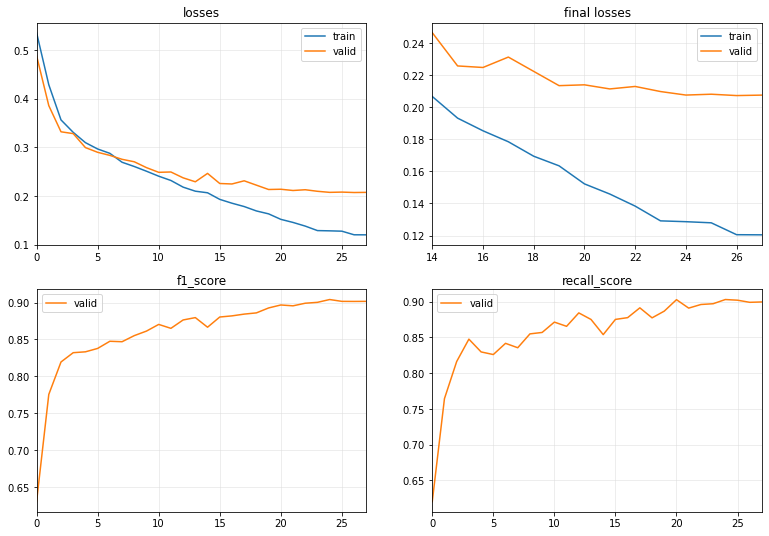

Training time: 62.0363 seconds


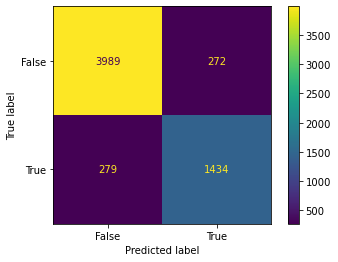

[I 2022-12-05 12:01:20,825] Trial 90 finished with value: 0.8388417665984206 and parameters: {'learning_rate': 0.0009827855661257638, 'batch_size': 256, 'pred_val': 442, 'num_epochs': 28, 'weight_decay': 0.0035264114620442016, 'normalization': True, 'window_length': 59}. Best is trial 56 with value: 0.8987348645273389.


0.8388417665984206


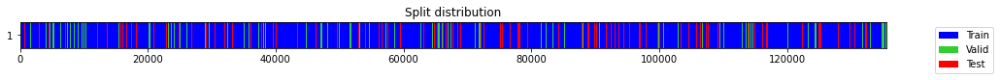

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.450387,0.449274,0.697567,0.678571,00:12
1,0.386714,0.375681,0.764557,0.746690,00:12
2,0.359449,0.341769,0.788751,0.772537,00:12
3,0.335384,0.325915,0.805655,0.789498,00:12
4,0.331045,0.309660,0.824584,0.811099,00:12
5,0.317513,0.296796,0.835952,0.826974,00:12
6,0.300487,0.292552,0.844246,0.843084,00:12
7,0.291471,0.270626,0.849932,0.845045,00:12
8,0.287187,0.259023,0.865792,0.863158,00:12
9,0.270252,0.250456,0.867797,0.862738,00:12


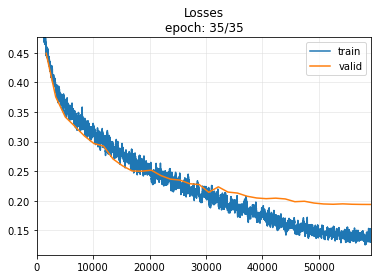

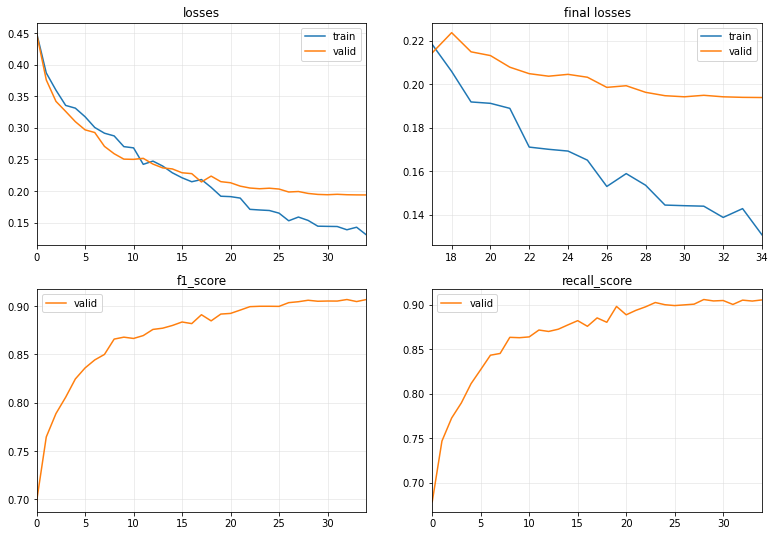

Training time: 510.6878 seconds


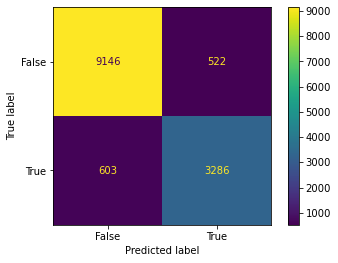

[I 2022-12-05 12:10:00,515] Trial 91 finished with value: 0.8538391581135508 and parameters: {'learning_rate': 0.0004823883293757781, 'batch_size': 64, 'pred_val': 50, 'num_epochs': 35, 'weight_decay': 0.001302823376180869, 'normalization': True, 'window_length': 26}. Best is trial 56 with value: 0.8987348645273389.


0.8538391581135508


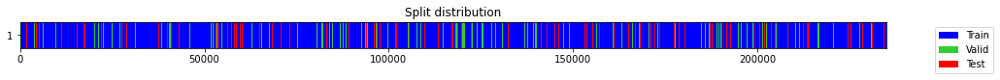

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.439357,0.433603,0.713154,0.695839,00:22
1,0.380625,0.361448,0.782145,0.770770,00:22
2,0.347174,0.338780,0.809185,0.808965,00:22
3,0.319674,0.315521,0.819555,0.808781,00:21
4,0.306652,0.289260,0.840311,0.834581,00:21
5,0.289486,0.283791,0.842658,0.837784,00:21
6,0.280535,0.262584,0.856351,0.854333,00:21
7,0.268310,0.256624,0.864281,0.869516,00:21
8,0.257293,0.243298,0.870742,0.865898,00:22
9,0.241185,0.245853,0.867674,0.870587,00:22


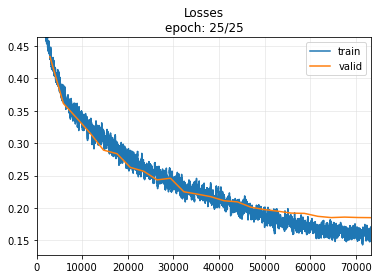

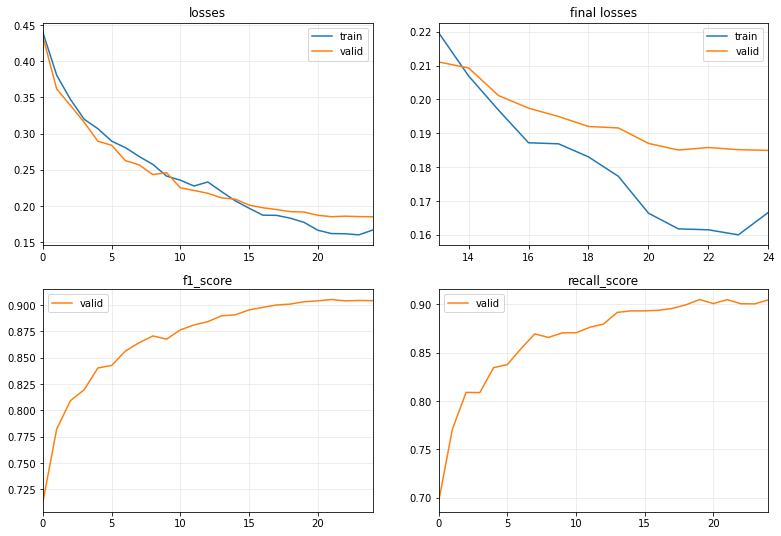

Training time: 602.8315 seconds


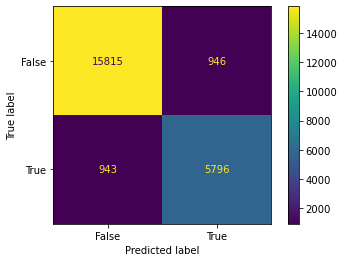

[I 2022-12-05 12:20:42,842] Trial 92 finished with value: 0.8598768637341443 and parameters: {'learning_rate': 0.000362272997407015, 'batch_size': 64, 'pred_val': 99, 'num_epochs': 25, 'weight_decay': 0.00013219504839554407, 'normalization': True, 'window_length': 15}. Best is trial 56 with value: 0.8987348645273389.


0.8598768637341443


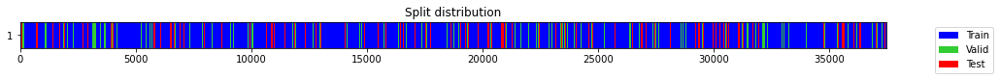

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.490185,0.484455,0.623949,0.615431,00:03
1,0.395116,0.385207,0.770148,0.758292,00:03
2,0.360447,0.364008,0.791992,0.794775,00:03
3,0.343412,0.329565,0.809279,0.802669,00:03
4,0.331933,0.336006,0.816310,0.820661,00:03
5,0.314632,0.295555,0.836425,0.828846,00:03
6,0.291456,0.287267,0.842195,0.838692,00:03
7,0.281544,0.289780,0.844485,0.848146,00:03
8,0.270355,0.298205,0.840858,0.857379,00:03
9,0.269468,0.287576,0.844915,0.855831,00:03


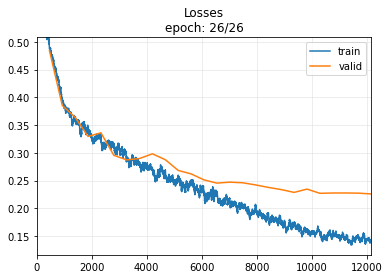

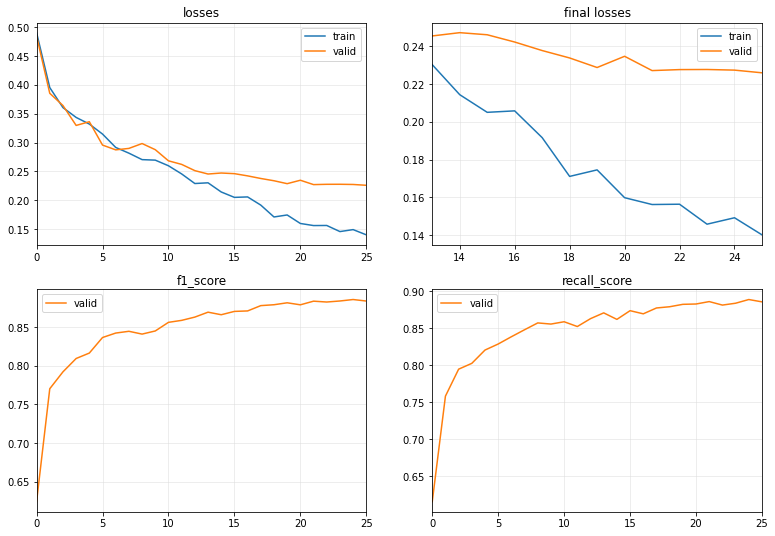

Training time: 107.1434 seconds


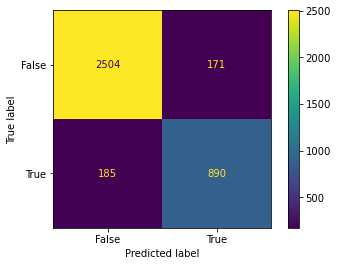

[I 2022-12-05 12:22:33,446] Trial 93 finished with value: 0.8333333333333333 and parameters: {'learning_rate': 0.0005677731094804243, 'batch_size': 64, 'pred_val': 50, 'num_epochs': 26, 'weight_decay': 0.0002246188978557481, 'normalization': True, 'window_length': 94}. Best is trial 56 with value: 0.8987348645273389.


0.8333333333333333


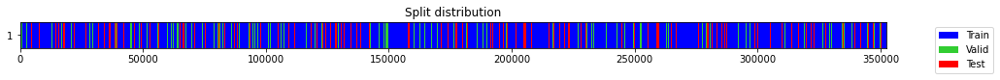

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.403342,0.396000,0.744438,0.726974,00:33
1,0.362283,0.340014,0.812034,0.814473,00:32
2,0.322050,0.312078,0.822137,0.811990,00:32
3,0.302991,0.286398,0.836169,0.824550,00:32
4,0.282741,0.266046,0.854142,0.846832,00:32
5,0.271698,0.250785,0.866135,0.863243,00:32
6,0.251305,0.239366,0.869464,0.861043,00:32
7,0.253703,0.230067,0.879314,0.882430,00:32
8,0.240136,0.219342,0.882021,0.876023,00:33
9,0.216241,0.207557,0.891409,0.889802,00:33


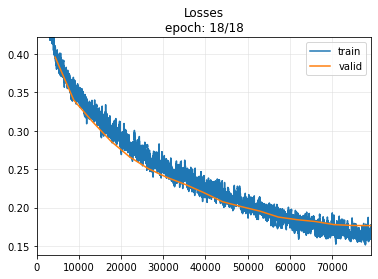

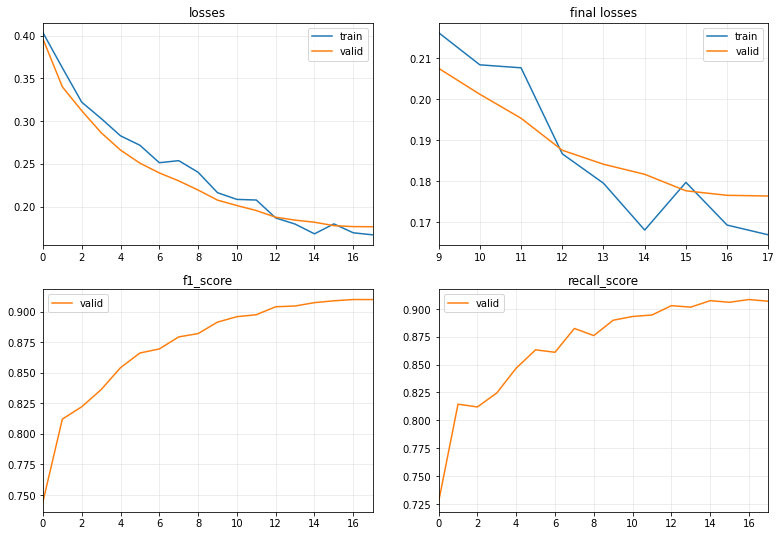

Training time: 632.9835 seconds


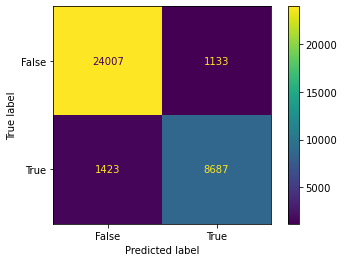

[I 2022-12-05 12:34:40,835] Trial 94 finished with value: 0.8717511289513297 and parameters: {'learning_rate': 0.0005046354576883896, 'batch_size': 64, 'pred_val': 1, 'num_epochs': 18, 'weight_decay': 0.0003474265866074577, 'normalization': True, 'window_length': 10}. Best is trial 56 with value: 0.8987348645273389.


0.8717511289513297


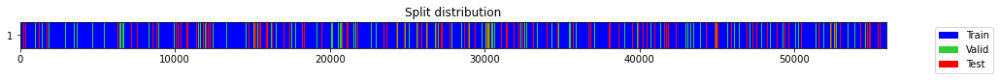

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.568274,0.550952,0.666094,0.657919,00:03
1,0.471128,0.467623,0.680867,0.665182,00:02
2,0.408831,0.402350,0.742710,0.727287,00:02
3,0.360858,0.356680,0.799791,0.797019,00:02
4,0.332659,0.348893,0.807945,0.815526,00:02
5,0.319737,0.312570,0.810397,0.796248,00:02
6,0.302085,0.327848,0.804551,0.778890,00:02
7,0.302102,0.305486,0.829918,0.824683,00:02
8,0.282466,0.295702,0.841243,0.850652,00:02
9,0.269059,0.280054,0.842892,0.832338,00:02


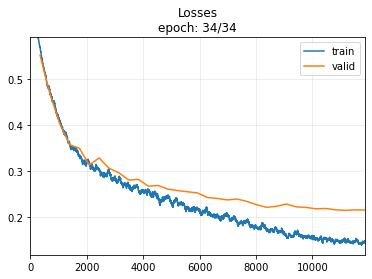

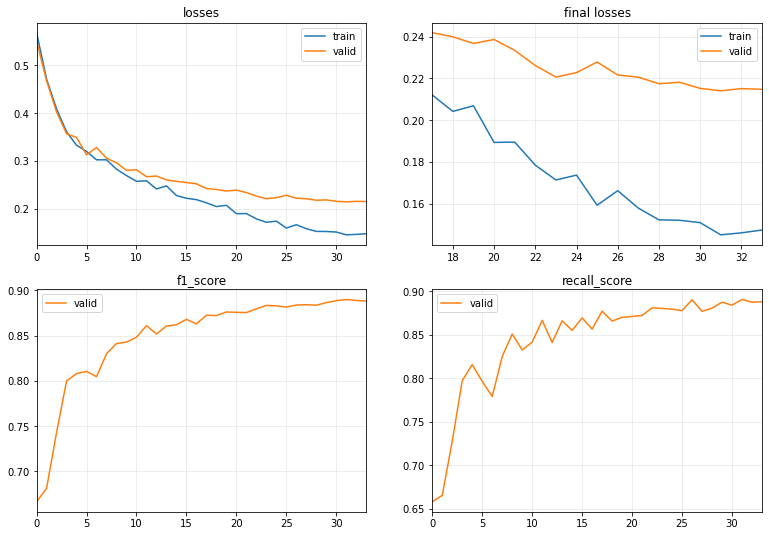

Training time: 110.5619 seconds


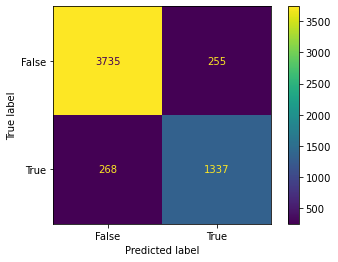

[I 2022-12-05 12:36:35,545] Trial 95 finished with value: 0.8364091335627151 and parameters: {'learning_rate': 0.00029574239498242523, 'batch_size': 128, 'pred_val': 197, 'num_epochs': 34, 'weight_decay': 5.701010891484206e-05, 'normalization': True, 'window_length': 63}. Best is trial 56 with value: 0.8987348645273389.


0.8364091335627151


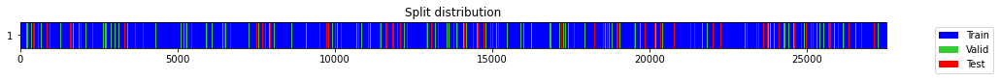

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.583118,0.562156,0.675987,0.665320,00:03
1,0.504631,0.484864,0.645591,0.632386,00:02
2,0.455130,0.433267,0.715303,0.695114,00:02
3,0.397028,0.376707,0.765470,0.747244,00:02
4,0.345598,0.339056,0.791585,0.773217,00:02
5,0.325104,0.320600,0.818921,0.812140,00:02
6,0.321361,0.314350,0.802082,0.790760,00:02
7,0.309202,0.305105,0.835983,0.843963,00:02
8,0.291945,0.296013,0.837088,0.832533,00:02
9,0.288569,0.278863,0.854918,0.860597,00:02


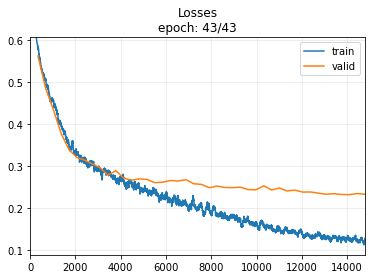

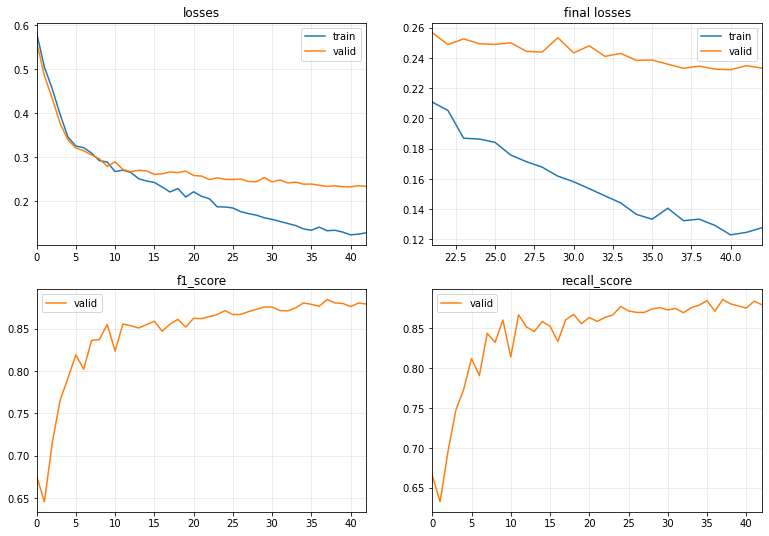

Training time: 138.3662 seconds


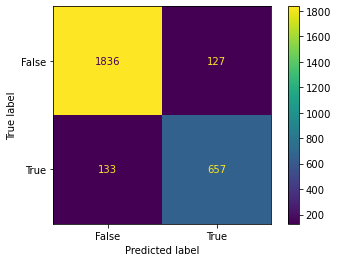

[I 2022-12-05 12:38:57,007] Trial 96 finished with value: 0.8348157560355781 and parameters: {'learning_rate': 0.00026409525920569185, 'batch_size': 64, 'pred_val': 99, 'num_epochs': 43, 'weight_decay': 2.2198285004392936e-05, 'normalization': True, 'window_length': 128}. Best is trial 56 with value: 0.8987348645273389.


0.8348157560355781


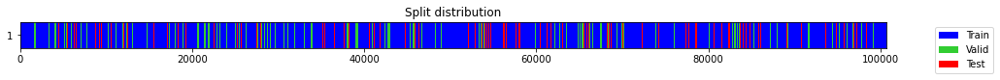

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.638635,0.625297,0.626070,0.635351,00:02
1,0.600467,0.584024,0.651993,0.657033,00:02
2,0.553442,0.533023,0.673588,0.661301,00:02
3,0.505070,0.489454,0.685162,0.667508,00:02
4,0.461921,0.447920,0.706643,0.687310,00:02
5,0.424970,0.412594,0.751167,0.734622,00:02
6,0.392633,0.383134,0.762338,0.745022,00:02
7,0.365918,0.360828,0.794232,0.784515,00:02
8,0.349934,0.345923,0.793750,0.777816,00:02
9,0.330780,0.334466,0.819122,0.818990,00:02


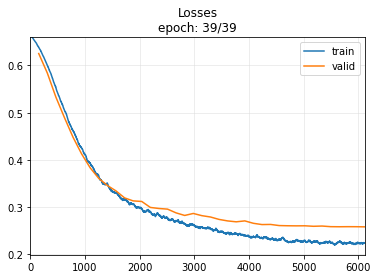

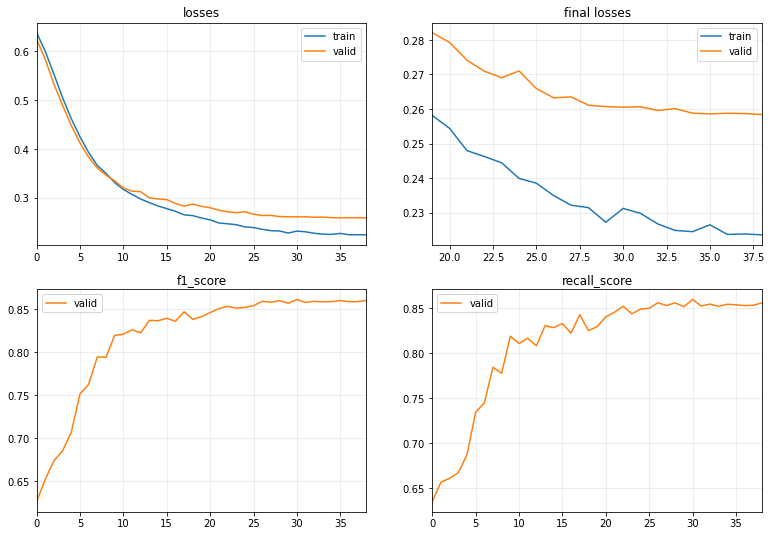

Training time: 92.5109 seconds


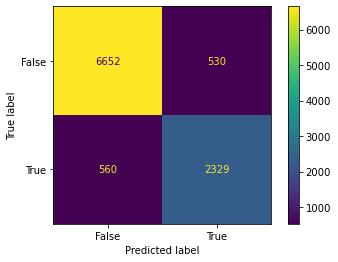

[I 2022-12-05 12:40:35,531] Trial 97 finished with value: 0.8103688239387612 and parameters: {'learning_rate': 8.699739074534051e-05, 'batch_size': 512, 'pred_val': 393, 'num_epochs': 39, 'weight_decay': 3.44552667937552e-05, 'normalization': True, 'window_length': 35}. Best is trial 56 with value: 0.8987348645273389.


0.8103688239387612


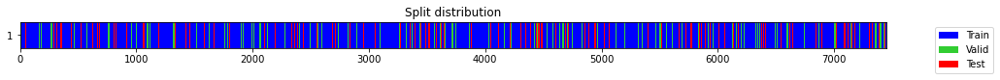

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.655550,0.599284,0.690653,0.691465,00:01
1,0.568138,0.517839,0.578972,0.584966,00:01
2,0.506487,0.473997,0.616030,0.609843,00:01
3,0.464397,0.429707,0.730853,0.710297,00:01
4,0.424771,0.389068,0.752796,0.732831,00:01
5,0.386679,0.351142,0.817977,0.813102,00:01
6,0.350967,0.334818,0.779872,0.758657,00:01
7,0.325581,0.309135,0.802116,0.785414,00:01
8,0.308773,0.316378,0.817435,0.811695,00:01
9,0.293244,0.287599,0.851645,0.858639,00:01


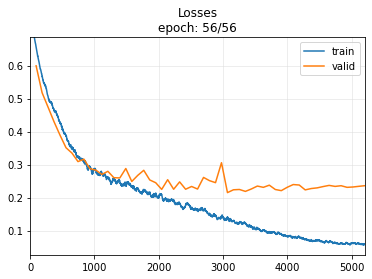

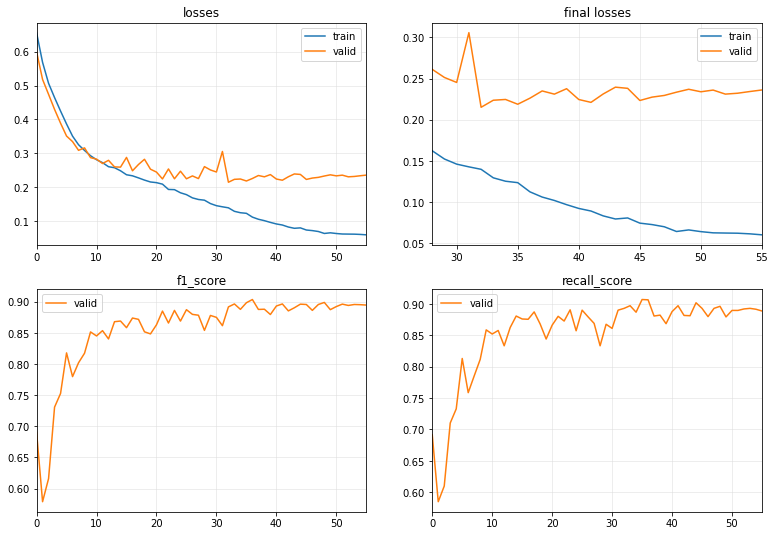

Training time: 86.9006 seconds


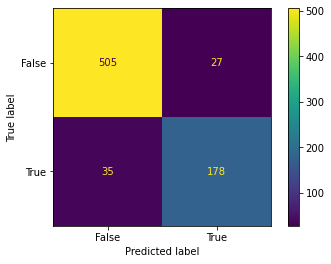

[I 2022-12-05 12:42:05,298] Trial 98 finished with value: 0.8516746411483253 and parameters: {'learning_rate': 0.00043016263792134557, 'batch_size': 64, 'pred_val': 148, 'num_epochs': 56, 'weight_decay': 8.275888247229905e-05, 'normalization': True, 'window_length': 473}. Best is trial 56 with value: 0.8987348645273389.


0.8516746411483253


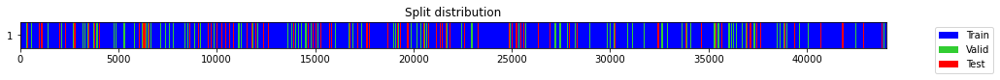

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.528796,0.507130,0.612672,0.607413,00:04
1,0.446328,0.428553,0.729658,0.712654,00:04
2,0.379089,0.361604,0.798983,0.791972,00:04
3,0.342191,0.316739,0.819153,0.808090,00:04
4,0.324052,0.304204,0.844906,0.847279,00:04
5,0.310830,0.293580,0.849515,0.845979,00:04
6,0.303128,0.287340,0.839691,0.823422,00:04
7,0.291651,0.269158,0.862678,0.862593,00:04
8,0.278796,0.273862,0.864922,0.867171,00:04
9,0.279216,0.260628,0.867332,0.880011,00:04


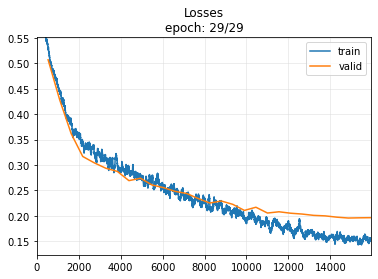

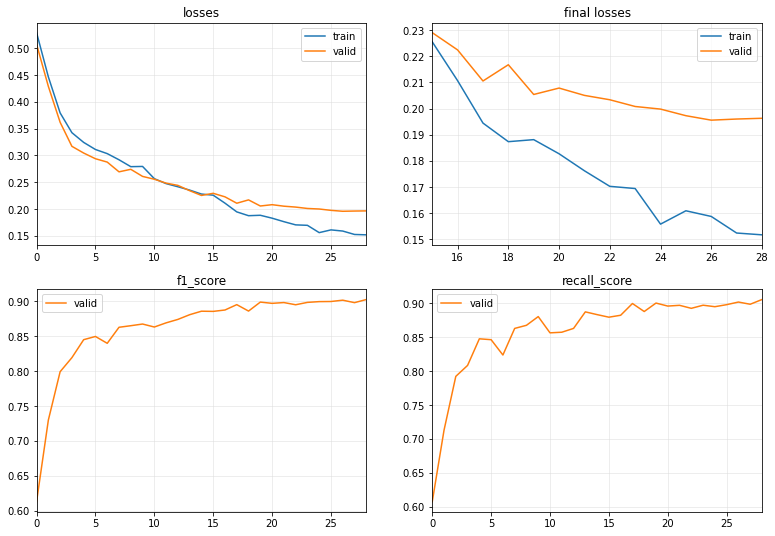

Training time: 139.2848 seconds


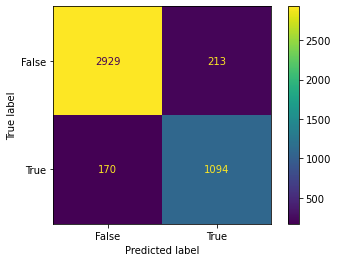

[I 2022-12-05 12:44:28,167] Trial 99 finished with value: 0.8510307273434461 and parameters: {'learning_rate': 0.0003407847680639575, 'batch_size': 64, 'pred_val': 197, 'num_epochs': 29, 'weight_decay': 0.00017884797520386232, 'normalization': True, 'window_length': 80}. Best is trial 56 with value: 0.8987348645273389.


0.8510307273434461


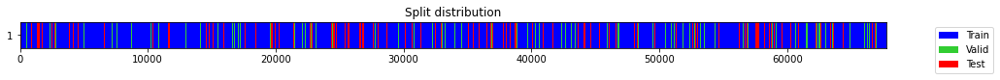

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.577527,0.531250,0.660919,0.647390,00:01
1,0.499442,0.454555,0.659430,0.643646,00:01
2,0.428811,0.394481,0.759102,0.743293,00:01
3,0.373782,0.350831,0.812800,0.811552,00:01
4,0.339122,0.327056,0.806452,0.791987,00:01
5,0.321332,0.321083,0.824379,0.824728,00:01
6,0.304873,0.300729,0.830305,0.821555,00:01
7,0.293398,0.302113,0.826702,0.806555,00:01
8,0.281871,0.293139,0.837894,0.829944,00:01
9,0.270821,0.287034,0.840627,0.824649,00:01


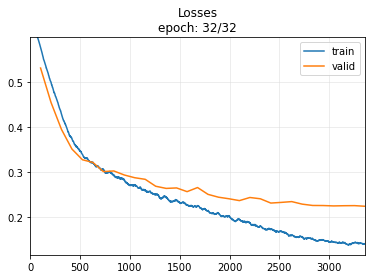

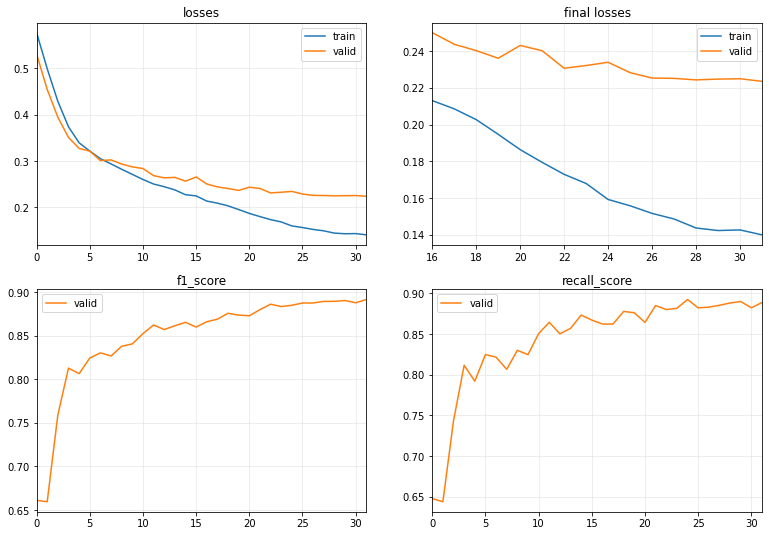

Training time: 60.332 seconds


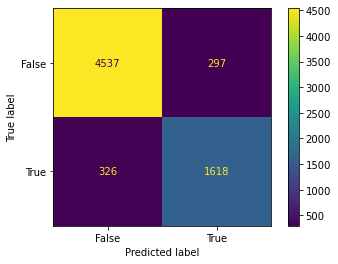

[I 2022-12-05 12:45:32,881] Trial 100 finished with value: 0.8385592122311479 and parameters: {'learning_rate': 0.0007141497416689267, 'batch_size': 512, 'pred_val': 50, 'num_epochs': 32, 'weight_decay': 0.0008801363249155528, 'normalization': True, 'window_length': 52}. Best is trial 56 with value: 0.8987348645273389.


0.8385592122311479


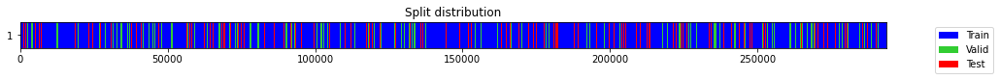

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.688336,0.684015,0.511190,0.592694,00:04
1,0.666526,0.660809,0.563088,0.625948,00:04
2,0.640483,0.636227,0.598513,0.646772,00:04
3,0.608106,0.603076,0.639636,0.665472,00:04
4,0.571524,0.566854,0.668195,0.670172,00:04
5,0.535965,0.531896,0.668755,0.655865,00:04
6,0.502275,0.499801,0.657609,0.642953,00:04
7,0.478611,0.474255,0.677353,0.660292,00:04
8,0.459827,0.452878,0.708263,0.690329,00:04
9,0.441608,0.433278,0.727710,0.709990,00:04


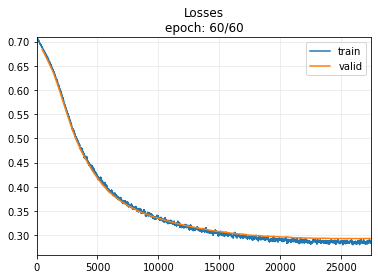

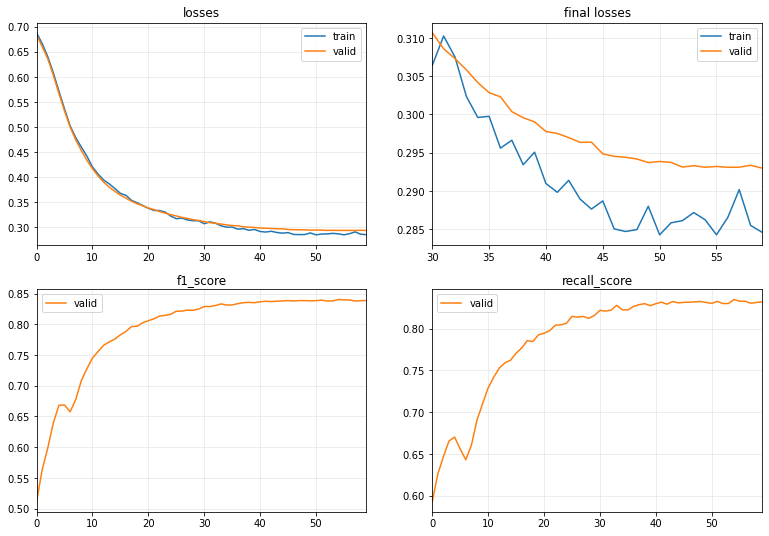

Training time: 303.9495 seconds


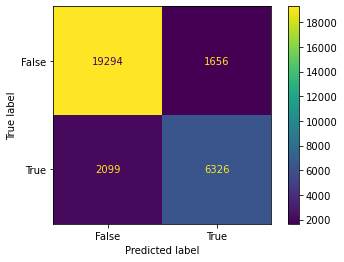

[I 2022-12-05 12:51:42,843] Trial 101 finished with value: 0.7711342719570915 and parameters: {'learning_rate': 1.8291392555754638e-05, 'batch_size': 512, 'pred_val': 50, 'num_epochs': 60, 'weight_decay': 0.0006784073370653534, 'normalization': True, 'window_length': 12}. Best is trial 56 with value: 0.8987348645273389.


0.7711342719570915


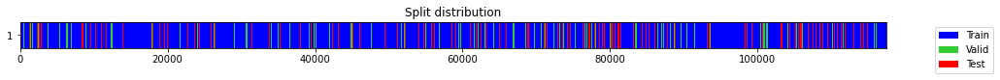

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.546221,0.525797,0.638622,0.626823,00:02
1,0.487262,0.471761,0.679533,0.661357,00:02
2,0.440632,0.426040,0.740354,0.722634,00:02
3,0.396995,0.384641,0.770096,0.755234,00:02
4,0.364134,0.351839,0.795508,0.783956,00:02
5,0.346077,0.337506,0.810870,0.804885,00:02
6,0.323597,0.320201,0.814848,0.800822,00:02
7,0.306024,0.307803,0.834912,0.828157,00:02
8,0.300208,0.308836,0.837402,0.841772,00:02
9,0.288172,0.301038,0.831208,0.816335,00:02


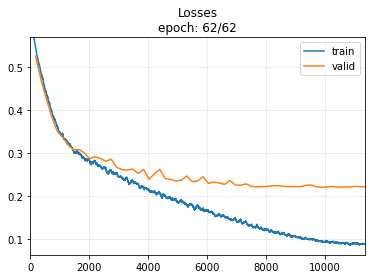

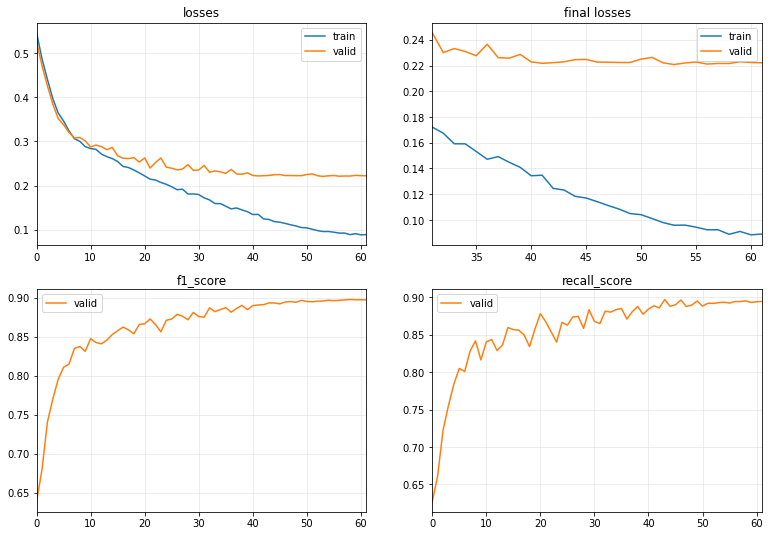

Training time: 165.1957 seconds


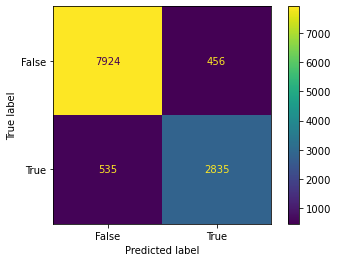

[I 2022-12-05 12:54:34,738] Trial 102 finished with value: 0.8512235400090078 and parameters: {'learning_rate': 0.0006047979718172655, 'batch_size': 512, 'pred_val': 1, 'num_epochs': 62, 'weight_decay': 0.0007661173342346265, 'normalization': True, 'window_length': 30}. Best is trial 56 with value: 0.8987348645273389.


0.8512235400090078


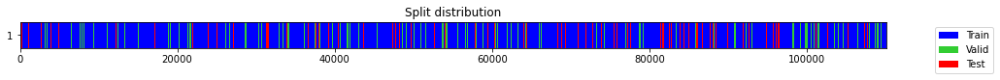

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.592588,0.572663,0.645415,0.642636,00:02
1,0.536653,0.517609,0.653080,0.639139,00:02
2,0.485606,0.474526,0.675535,0.658789,00:02
3,0.449373,0.437027,0.713729,0.694914,00:02
4,0.413602,0.409424,0.755362,0.742761,00:02
5,0.383662,0.376624,0.773793,0.762483,00:02
6,0.356353,0.355438,0.785272,0.774171,00:02
7,0.333911,0.338332,0.798112,0.784367,00:02
8,0.322084,0.324703,0.818152,0.815073,00:02
9,0.309364,0.320444,0.814009,0.795907,00:02


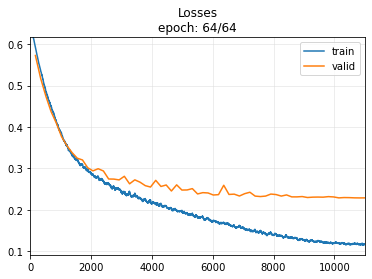

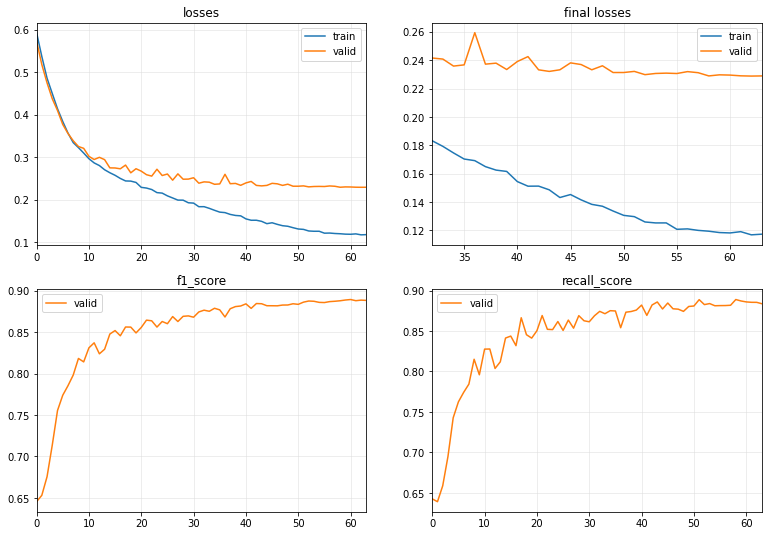

Training time: 161.2164 seconds


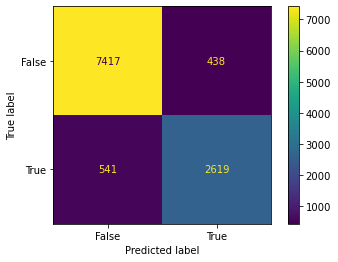

[I 2022-12-05 12:57:22,332] Trial 103 finished with value: 0.8425285507479491 and parameters: {'learning_rate': 0.000317477497447126, 'batch_size': 512, 'pred_val': 50, 'num_epochs': 64, 'weight_decay': 0.002839931599977135, 'normalization': True, 'window_length': 32}. Best is trial 56 with value: 0.8987348645273389.


0.8425285507479491


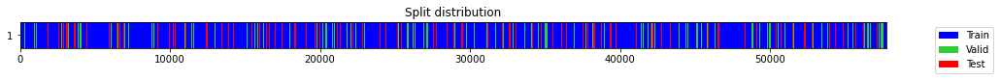

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.703733,0.660080,0.571722,0.640457,00:01
1,0.633791,0.586796,0.669737,0.698315,00:01
2,0.559363,0.513751,0.710706,0.700776,00:01
3,0.491896,0.455291,0.703361,0.683049,00:01
4,0.441406,0.417646,0.749962,0.733522,00:01
5,0.400827,0.377274,0.787792,0.775793,00:01
6,0.367161,0.344085,0.795618,0.775932,00:01
7,0.338132,0.331884,0.800942,0.779691,00:01
8,0.319525,0.314590,0.818851,0.809109,00:01
9,0.303706,0.291673,0.841641,0.834216,00:01


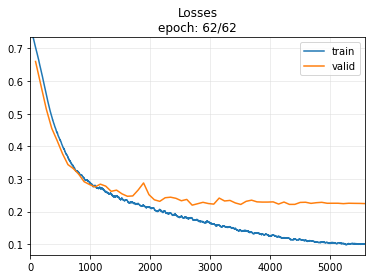

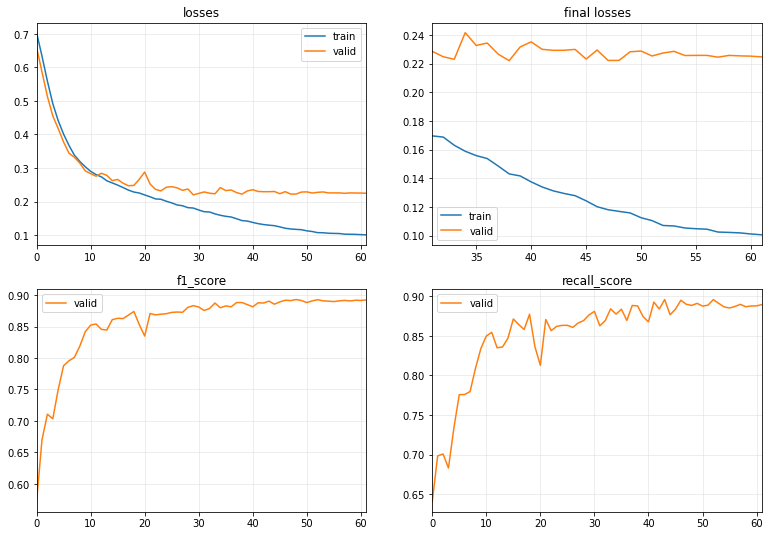

Training time: 115.1239 seconds


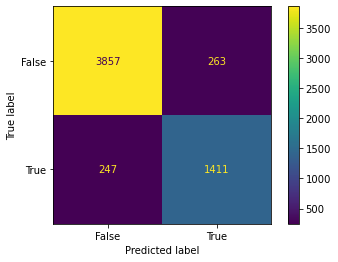

[I 2022-12-05 12:59:21,423] Trial 104 finished with value: 0.8469387755102042 and parameters: {'learning_rate': 0.000397538958782619, 'batch_size': 512, 'pred_val': 295, 'num_epochs': 62, 'weight_decay': 0.0005236319439658304, 'normalization': True, 'window_length': 61}. Best is trial 56 with value: 0.8987348645273389.


0.8469387755102042


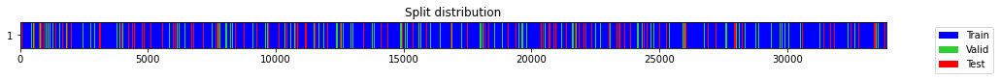

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.663502,0.623614,0.632344,0.646720,00:01
1,0.614425,0.561972,0.660024,0.650130,00:01
2,0.560025,0.509213,0.633175,0.622548,00:01
3,0.508454,0.466241,0.658328,0.643267,00:01
4,0.461796,0.426390,0.739669,0.724154,00:01
5,0.421750,0.386881,0.792853,0.784771,00:01
6,0.383741,0.355761,0.792769,0.778460,00:01
7,0.352735,0.333818,0.815066,0.806802,00:01
8,0.328850,0.315371,0.825647,0.810884,00:01
9,0.309102,0.319882,0.826157,0.810990,00:01


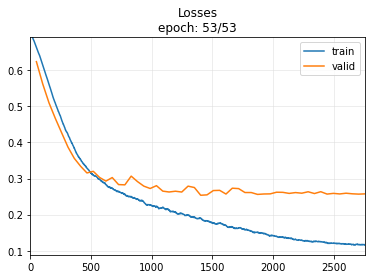

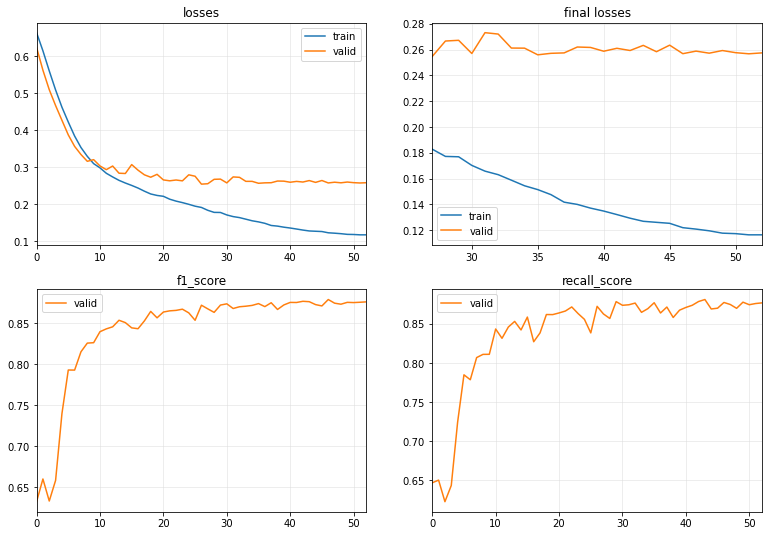

Training time: 77.8032 seconds


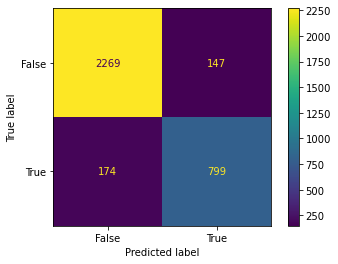

[I 2022-12-05 13:00:42,484] Trial 105 finished with value: 0.8327253778009379 and parameters: {'learning_rate': 0.000446669678468802, 'batch_size': 512, 'pred_val': 99, 'num_epochs': 53, 'weight_decay': 0.0012396095508504894, 'normalization': True, 'window_length': 104}. Best is trial 56 with value: 0.8987348645273389.


0.8327253778009379


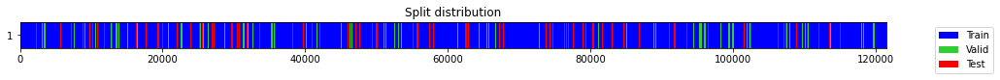

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.472489,0.453905,0.678194,0.660062,00:03
1,0.377000,0.376401,0.784558,0.780439,00:03
2,0.337720,0.335404,0.817059,0.817821,00:03
3,0.305513,0.319043,0.820611,0.811017,00:03
4,0.290538,0.303920,0.832313,0.827092,00:03
5,0.283116,0.282917,0.846651,0.847038,00:03
6,0.262264,0.278575,0.850726,0.853169,00:03
7,0.252203,0.263533,0.855864,0.852040,00:03
8,0.239492,0.251866,0.866790,0.871594,00:03
9,0.229650,0.249448,0.864383,0.865759,00:03


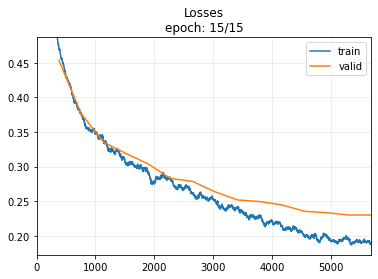

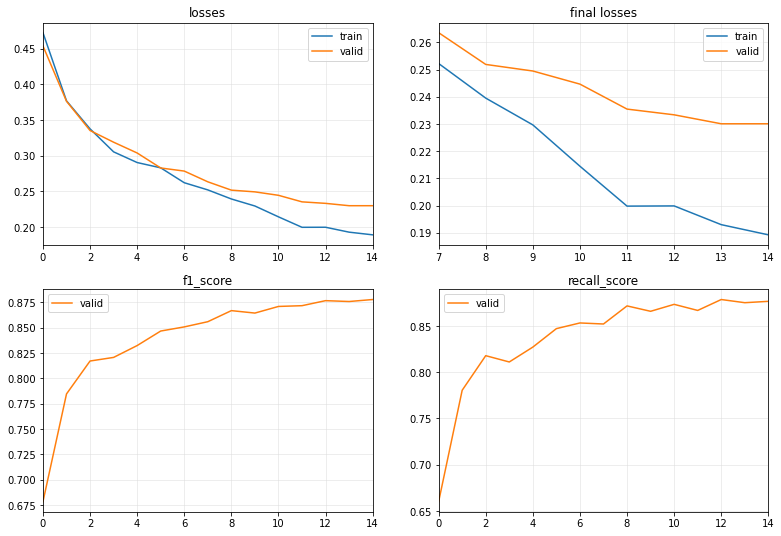

Training time: 51.8135 seconds


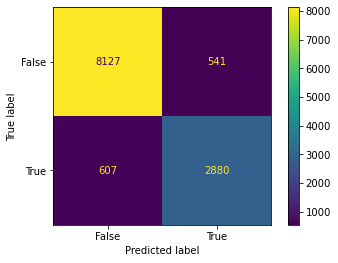

[I 2022-12-05 13:01:41,423] Trial 106 finished with value: 0.8338158656629995 and parameters: {'learning_rate': 0.0005411119743366069, 'batch_size': 256, 'pred_val': 50, 'num_epochs': 15, 'weight_decay': 0.00040393657701014504, 'normalization': True, 'window_length': 29}. Best is trial 56 with value: 0.8987348645273389.


0.8338158656629995


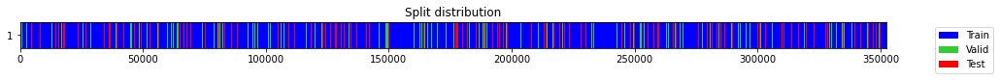

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.414536,0.415177,0.739452,0.721733,00:32
1,0.358813,0.352957,0.805402,0.807079,00:32
2,0.324736,0.313007,0.824108,0.821154,00:32
3,0.306136,0.299498,0.837294,0.835961,00:32
4,0.302046,0.270207,0.856497,0.857637,00:32
5,0.273777,0.262457,0.860488,0.865269,00:32
6,0.252190,0.244846,0.867409,0.863429,00:32
7,0.248322,0.237139,0.871014,0.869514,00:34
8,0.238268,0.230878,0.880127,0.882199,00:37
9,0.239208,0.220121,0.884855,0.887673,00:38


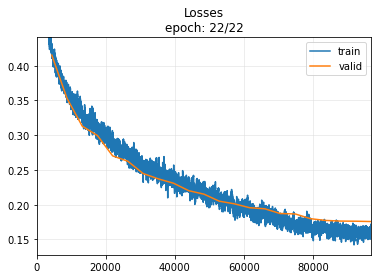

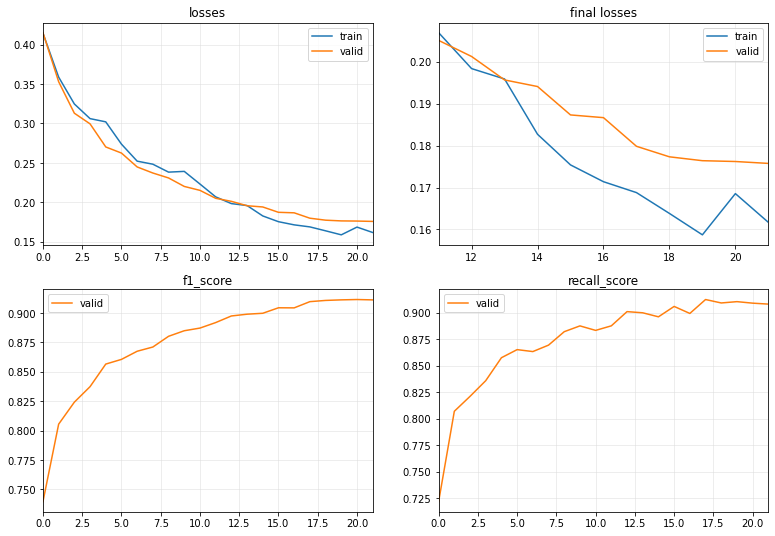

Training time: 849.7938 seconds


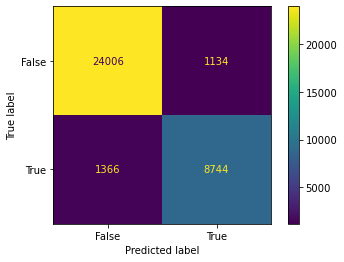

[I 2022-12-05 13:17:22,869] Trial 107 finished with value: 0.8749249549729838 and parameters: {'learning_rate': 0.0003221707156142615, 'batch_size': 64, 'pred_val': 99, 'num_epochs': 22, 'weight_decay': 1.847081988935307e-05, 'normalization': False, 'window_length': 10}. Best is trial 56 with value: 0.8987348645273389.


0.8749249549729838


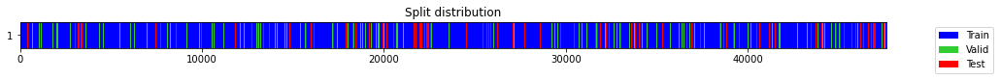

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.519492,0.508396,0.622922,0.614750,00:05
1,0.440465,0.418137,0.757490,0.743971,00:05
2,0.374813,0.361001,0.802363,0.801901,00:05
3,0.346407,0.340622,0.810928,0.802189,00:05
4,0.321417,0.324639,0.812083,0.801544,00:05
5,0.302193,0.305362,0.833849,0.829570,00:05
6,0.293513,0.299285,0.837068,0.827484,00:05
7,0.287582,0.290006,0.847194,0.847498,00:05
8,0.284129,0.278602,0.835999,0.825949,00:05
9,0.258632,0.270835,0.856307,0.851348,00:05


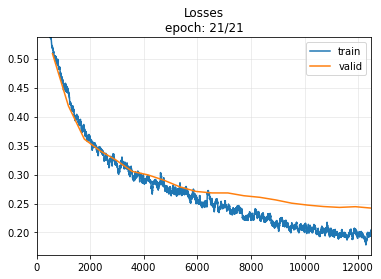

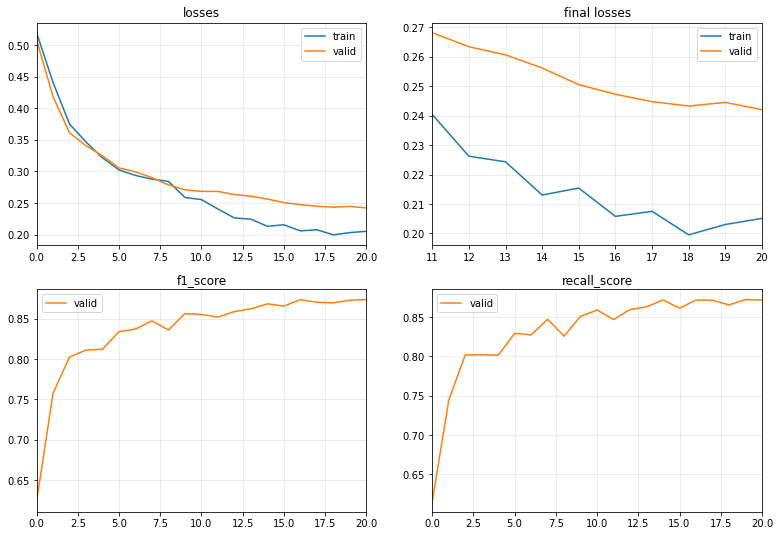

Training time: 118.6578 seconds


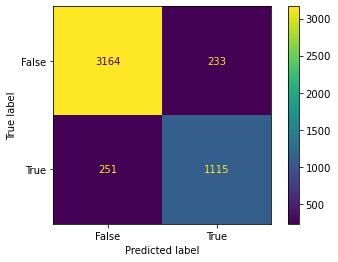

[I 2022-12-05 13:19:25,725] Trial 108 finished with value: 0.8216654384672071 and parameters: {'learning_rate': 0.00021229096958386582, 'batch_size': 64, 'pred_val': 99, 'num_epochs': 21, 'weight_decay': 1.8397574455797116e-05, 'normalization': True, 'window_length': 74}. Best is trial 56 with value: 0.8987348645273389.


0.8216654384672071


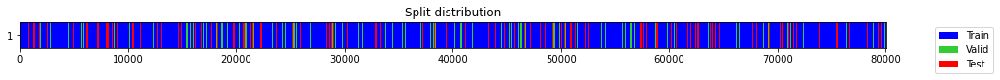

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.472767,0.456394,0.686401,0.667208,00:08
1,0.398381,0.367320,0.786847,0.774794,00:08
2,0.348160,0.340320,0.799236,0.784232,00:08
3,0.338349,0.327998,0.816189,0.807542,00:08
4,0.313531,0.308166,0.833265,0.829172,00:08
5,0.299228,0.292979,0.825631,0.811202,00:07
6,0.287774,0.278218,0.846075,0.844457,00:07
7,0.280854,0.282763,0.842908,0.845777,00:08
8,0.260871,0.262171,0.857040,0.848990,00:07
9,0.253528,0.258014,0.862903,0.856434,00:07


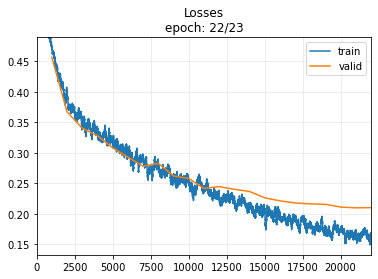

[W 2022-12-05 13:22:54,578] Trial 109 failed because of the following error: KeyboardInterrupt()
Traceback (most recent call last):
  File "C:\Users\zoopy\AppData\Roaming\Python\Python310\site-packages\optuna\study\_optimize.py", line 196, in _run_trial
    value_or_values = func(trial)
  File "C:\Users\zoopy\AppData\Local\Temp\ipykernel_22988\677904931.py", line 17, in objective
    model = train(X, y, splits, learning_rate, LSTM_FCNPlus, bs=batch_size, wd=weight_decay, num_epochs=num_epochs)
  File "C:\Users\zoopy\AppData\Local\Temp\ipykernel_22988\3708286303.py", line 6, in train
    fcst.fit_one_cycle(num_epochs, learning_rate)
  File "C:\Users\zoopy\miniconda3\envs\syde-599-project\lib\site-packages\fastai\callback\schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "C:\Users\zoopy\miniconda3\envs\syde-599-project\lib\site-packages\fastai\learner.py", line 256, in fit
    self

KeyboardInterrupt: 

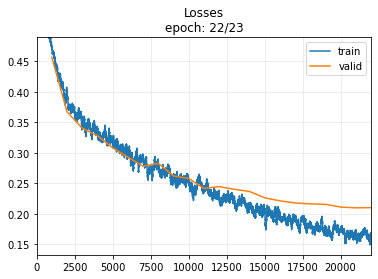

In [218]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=500)

In [10]:
study = joblib.load(f"fog_study.pkl")

print(study.best_trial.params)

{'learning_rate': 0.0005561849542053388, 'batch_size': 64, 'pred_val': 50, 'num_epochs': 62, 'weight_decay': 0.0002491961714966168, 'normalization': True, 'window_length': 11}


In [1]:
fig = optuna.visualization.plot_param_importances(study)
fig.show()

NameError: name 'optuna' is not defined

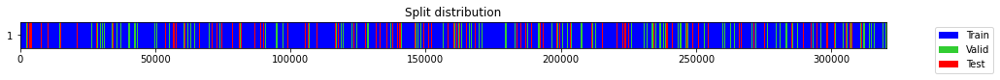

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.413029,0.414521,0.745973,0.733307,00:31
1,0.381009,0.367828,0.781575,0.769160,00:31
2,0.356423,0.337990,0.807739,0.799896,00:31
3,0.335951,0.327563,0.810216,0.801753,00:30
4,0.321286,0.296730,0.830500,0.821424,00:30
5,0.303647,0.283076,0.841063,0.835410,00:31
6,0.296407,0.283458,0.846676,0.847297,00:30
7,0.279072,0.290627,0.850476,0.864259,00:31
8,0.266610,0.258714,0.860849,0.859841,00:31
9,0.267624,0.249329,0.863381,0.860789,00:31


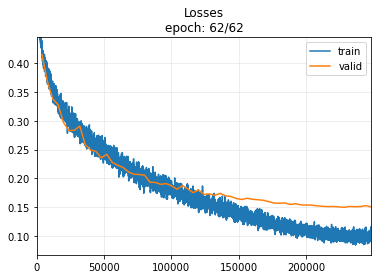

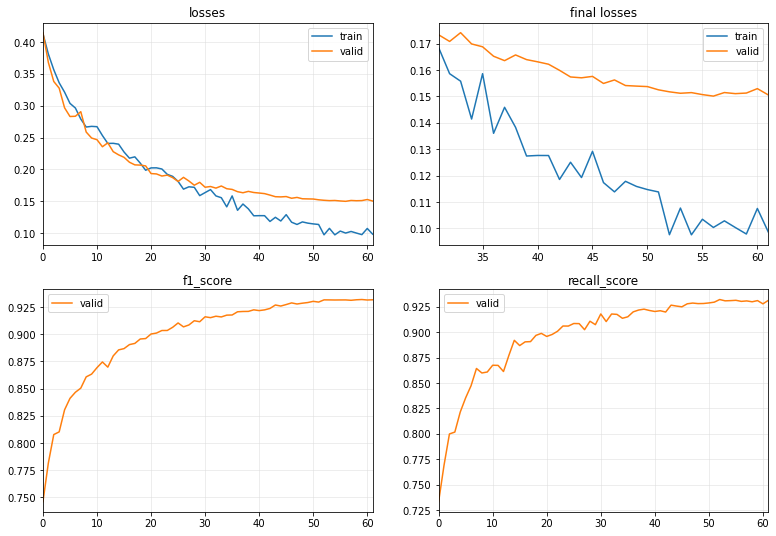

Training time: 2382.8289 seconds


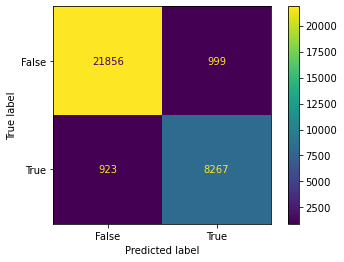

0.8958604247941048


In [221]:
# Manually Run Best Params from Optuna

learning_rate = study.best_params["learning_rate"]
batch_size = study.best_params["batch_size"]
pred_val = study.best_params["pred_val"]
num_epochs = study.best_params["num_epochs"]
weight_decay = study.best_params["weight_decay"]
normalization = study.best_params["normalization"]
window_length = study.best_params["window_length"]


X, y = create_sliding_windows(df, window_length=window_length, horizon=500, pred_val=pred_val)
scaler = StandardScaler()

if normalization:
    X = scaler.fit_transform(X.reshape(-1, X.shape[-1])).reshape(X.shape)
splits = get_splits(y, valid_size=0.1, test_size=0.1, stratify=True, random_state=23, shuffle=True)
model = train(X, y, splits, learning_rate, LSTM_FCNPlus, bs=batch_size, wd=weight_decay, num_epochs=num_epochs)
f1 = get_test_f1(X, y, splits, model)
print(f1)

In [5]:
# joblib.dump(study, f"fog_optuna_study.pkl")   # save study

## Manual Experinmentation

In [207]:
X, y = create_sliding_windows(df, window_length=250, horizon=500, pred_val=1)


In [223]:
X.shape

(320458, 31, 11)

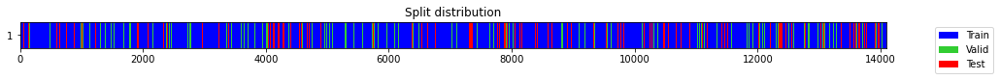

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.488740,0.455396,0.676160,0.658785,00:03
1,0.417324,0.380768,0.767827,0.753049,00:03
2,0.354123,0.350198,0.803783,0.799552,00:03
3,0.356308,0.384770,0.770330,0.770530,00:03
4,0.346218,0.311955,0.823214,0.820358,00:02
5,0.346362,0.335752,0.818479,0.838317,00:02
6,0.327791,0.309337,0.822589,0.817152,00:03
7,0.309428,0.314571,0.811063,0.801813,00:03
8,0.294012,0.322750,0.815393,0.808488,00:03
9,0.286458,0.290471,0.852797,0.869073,00:03


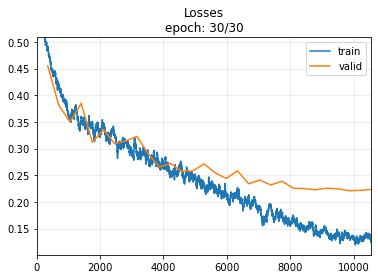

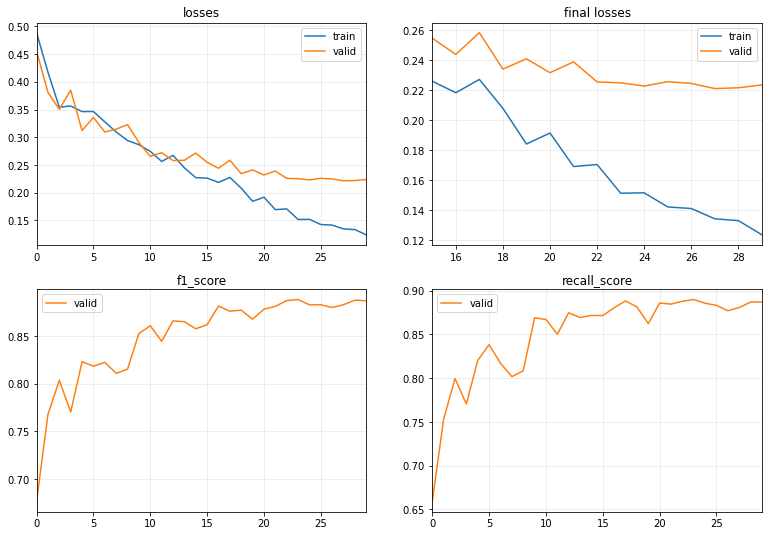

Training time: 113.4018 seconds


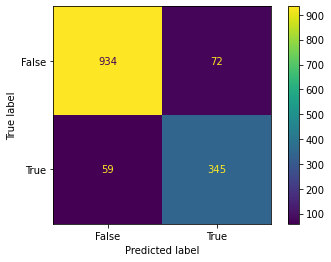

0.8404384896467723


In [209]:
# scaler = StandardScaler()
# X = scaler.fit_transform(X.reshape(-1, X.shape[-1])).reshape(X.shape)
splits = get_splits(y, valid_size=0.1, test_size=0.1, stratify=True, random_state=23, shuffle=True)
model = train(X, y, splits, 1e-3, LSTM_FCNPlus, wd=0.001)
f1 = get_test_f1(X, y, splits, model)
print(f1)

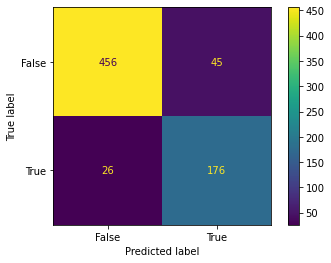

0.8321513002364066


In [66]:
# all below for horizon[250]

# LSTM_FCNPlus
# No scaling 0.83
# Normalization 0.82
# Normalization 0.797136


# MLSTM_FCN
# Normalization 0.814

#Ng data preparation
# MLSTM_FCN
# 0.8029 f1

# LSTM_FCNPlus
# 0.8048 f1 15 epoch
# no normalization 0.79512195
# no normalization 30 epochs 0.813 f1
# no normalization 30 epochs wd 0.001 0.819 f1
# no normalization 30 epochs wd 0.01 0.811 f1
# no normalization 30 epochs wd 0.01 batchsize 32 0.825 f1
# no normalization 30 epochs wd 0.01 batchsize 128 0.814 f1
# no normalization 30 epochs wd 0.01 batchsize 128 window_length=250 0.846153846 f1
# no normalization 30 epochs wd 0.01 batchsize 128 window_length=100 0.837983 f1



# MGRU_FCN
# no normalization 30 epochs wd 0.001 0.7883 f1

# TST
# 0.765550


# all below for horizon[100]
# no normalization 30 epochs wd 0.01 batchsize 128 window_length=250 0.83519 f1

# all below for horizon[50]
# no normalization 30 epochs wd 0.01 batchsize 128 window_length=250 0.8396572 f1

# all below for horizon[1]
# no normalization 30 epochs wd 0.01 batchsize 128 window_length=250 0.8396572 f1





## Run Leave Patient Out

In [ ]:
locs = []

for i in range(1, 14):
    patient_id = i
    if i == 1:
        for j in range(1, 5):
            task_id = j
            locs.append((patient_id, task_id))
    if i == 2:
        for j in range(1, 5):
            task_id = j
            locs.append((patient_id, task_id))
    if i == 3:
        for j in range(3, 5):
            task_id = j
            locs.append((patient_id, task_id))
    if i == 4:
        for j in range(1, 6):
            task_id = j
            locs.append((patient_id, task_id))
    if i == 5:
        for j in range(1, 5):
            task_id = j
            locs.append((patient_id, task_id))
    if i == 6:
        for j in range(1, 5):
            task_id = j
            locs.append((patient_id, task_id))
    if i == 7:
        for j in range(1, 5):
            task_id = j
            locs.append((patient_id, task_id))
    if i == 8:
        for j in range(3, 6):
            task_id = j
            locs.append((patient_id, task_id))
    if i == 9:
        for j in range(1, 7):
            task_id = j
            locs.append((patient_id, task_id))
    if i == 10:
        for j in range(3, 5):
            task_id = j
            locs.append((patient_id, task_id))
    if i == 11:
        locs.append((patient_id, 1))
        locs.append((patient_id, 3))
        locs.append((patient_id, 4))
    if i == 12:
        for j in range(1, 5):
            task_id = j
            locs.append((patient_id, task_id))
    if i == 13:
        for j in range(3, 5):
            task_id = j
            locs.append((patient_id, task_id))

In [210]:
def get_test_f1_no_splits(X, y, model):
  actual = [0 if target == 0 else 1 for target in y]

  raw_preds, target, preds = model.get_X_preds(X)
  predicted = [0 if pred[0] == False else 1 for pred in preds]

  confusion_matrix = metrics.confusion_matrix(actual, predicted)

  cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

  cm_display.plot()
  plt.show()

  tp = confusion_matrix[1,1]
  fp = confusion_matrix[0,1]
  fn = confusion_matrix[1,0]
  pre = tp/(tp+fp)
  re = tp/(tp+fn)
  f1 = 2*pre*re/(pre+re)
  return f1

def create_leave_patient_out(df):
    trainset = {}
    testset = {}

    for loc in locs:
        df_patient_task = df[(df["Patient_ID"] == loc[0]) & (df["Task_ID"] == loc[1])]
        X, y = create_sliding_windows(df_patient_task)
        if loc[0] != 1:
          trainset[loc] = (X, y)
        else:
          testset[loc] = (X, y)
        dim1 = X.shape[1]
        dim2 = X.shape[2]

    trainset_X = np.empty((0, dim1, dim2))
    trainset_y = np.empty((0))
    testset_X = np.empty((0, dim1, dim2))
    testset_y = np.empty((0))

    for key in trainset:
        X, y = trainset[key]
        trainset_X = np.concatenate((trainset_X, X), axis=0)
        trainset_y = np.concatenate((trainset_y, y), axis=0)

    for key in testset:
        X, y = testset[key]
        testset_X = np.concatenate((testset_X, X), axis=0)
        testset_y = np.concatenate((testset_y, y), axis=0)
    
    return trainset_X, trainset_y, testset_X, testset_y

In [195]:
trainset_X, trainset_y, testset_X, testset_y = create_leave_patient_out(df)

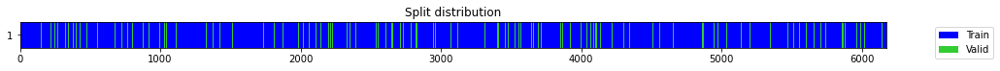

epoch,train_loss,valid_loss,f1_score,recall_score,time
0,0.537814,0.506892,0.558214,0.575133,00:02
1,0.451821,0.421927,0.721895,0.709294,00:01
2,0.393297,0.352517,0.802713,0.800518,00:01
3,0.338969,0.318848,0.823132,0.830334,00:01
4,0.317192,0.292805,0.845867,0.849938,00:01
5,0.311487,0.289174,0.856477,0.869228,00:01
6,0.292954,0.303669,0.824635,0.820412,00:01
7,0.279767,0.302051,0.844204,0.848767,00:01
8,0.287772,0.271597,0.858428,0.861056,00:01
9,0.276272,0.280851,0.851701,0.851701,00:01


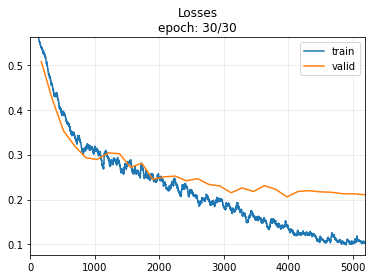

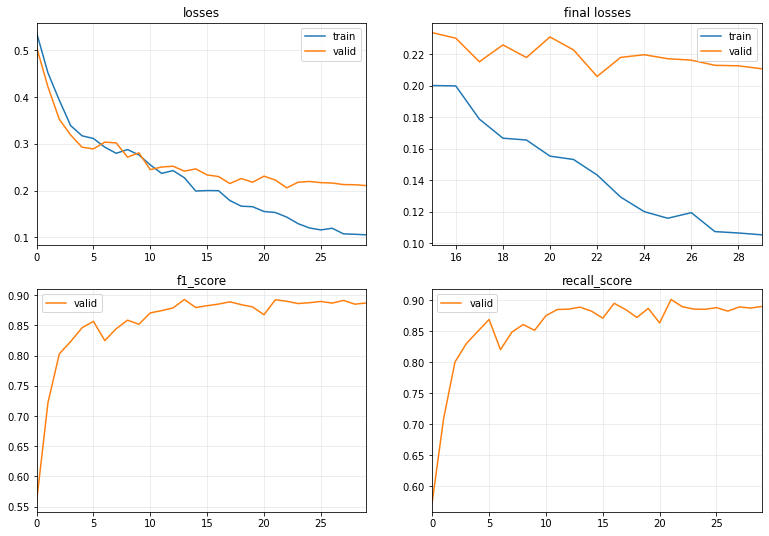

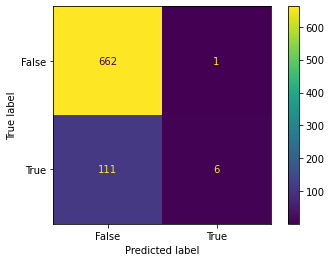

0.0967741935483871


In [196]:
splits = get_splits(trainset_y, valid_size=0.1, stratify=True, random_state=23, shuffle=True)
model = train(trainset_X, trainset_y, splits, 1e-3, LSTM_FCNPlus, wd=0.001)
f1 = get_test_f1_no_splits(testset_X, testset_y, model)
print(f1)

In [192]:
# splits_test = get_splits(y, valid_size=0, stratify=True, random_state=23, shuffle=True)
# actual = [0 if target == 0 else 1 for target in y[splits[2]]]

# raw_preds, target, preds = fcst.get_X_preds(X[splits[2]])
# predicted = [0 if pred[0] == False else 1 for pred in preds]

# confusion_matrix = metrics.confusion_matrix(actual, predicted)

# cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

# cm_display.plot()
# plt.show()

# tp = confusion_matrix[1,1]
# fp = confusion_matrix[0,1]
# fn = confusion_matrix[1,0]
# tn = confusion_matrix[0,0]
# r = (tp+fn)/(fp+tn)
# pre = tp/(tp+fp)
# re = tp/(tp+fn)
# f1 = 2*pre*re/(pre+re)

# print("test f1", f1)
# print("dummy f1", 2*r/(1+r))